In [1420]:
import numpy as np
from scipy.integrate import odeint
from scipy.integrate import solve_ivp
from scipy.interpolate import interp1d
import scipy.sparse as sparse
import scipy.sparse.linalg as sparsela
import scipy.linalg as sla
import math
from tqdm import tqdm
import time
import numpy.linalg as la 
import pandas as pd
import random
random.seed(7)

import matplotlib 
import matplotlib.pyplot as plt
matplotlib.rcParams.update({'font.size': 12})
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

## ODE Method

In [1421]:
def initializer(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, lambda_type, lambda_duration):
    # now: when block-specific i.e. lambda_type = 1, lambda_s_in is a (3,1) vector
    before_p =  np.tile(p_0, Nt)
    before_u = np.zeros((n_blocks*n_states, Nt)) 
    if lambda_type == 0: #same for every block time independent
        lambda_s = np.tile(lambda_s_in, n_blocks) #format: [lambda_s_in, lambda_s_in, ...], n_blocks = 6 
        lambda_i = np.tile(lambda_i_in, n_blocks)
        lambda_r = np.tile(lambda_r_in, n_blocks)
    if lambda_type == 1: #different for each block time independent
        lambda_s = lambda_s_in #format: [1, 1, 1]
        lambda_i = lambda_i_in
        lambda_r = lambda_r_in
    if lambda_type == 2: #different for each block time dependent       
        lambda_s = np.repeat(lambda_s_in, lambda_duration[0].astype(int), axis=1) #format[1,1,1,...,3,3,3];
        lambda_i = np.repeat(lambda_i_in, lambda_duration[1].astype(int), axis=1) #format[1,1,1,...,3,3,3];
        lambda_r = np.repeat(lambda_r_in, lambda_duration[2].astype(int), axis=1) #format[1,1,1,...,3,3,3];
    return (before_p, before_u, lambda_s, lambda_i, lambda_r)    

In [1422]:
def Z_calculator(n_blocks, block_dens, lambda_i, graphon, p, lambda_type, xi_i):
    n_blocks_half = n_blocks // 2
    if (lambda_type==0 or lambda_type==1):
        i_control = np.concatenate((lambda_i[:n_blocks_half], np.repeat(xi_i, n_blocks_half)))
        Z = np.matmul(graphon, np.multiply(np.reshape(np.multiply(block_dens, i_control), (n_blocks,1)),p[n_blocks:2*n_blocks,:]))
    return Z

def opt_control_calculator(lambda_s, lambda_i, lambda_r, beta, c_lambda, c_nu, Z, u, n_blocks, lambda_type, kappa, xi_i):
    n_blocks_half = n_blocks // 2
    if (lambda_type==0 or lambda_type==1):
        # followers, each of which is shape (3,1)
        alpha_s_f = np.reshape(lambda_s[:n_blocks_half], (n_blocks_half,1)) + np.reshape(beta[:n_blocks_half]/(2*c_lambda[:n_blocks_half]),(n_blocks_half,1)) * Z[:n_blocks_half, :] * (u[0:n_blocks_half,:]-u[n_blocks:n_blocks+n_blocks_half,:])
        alpha_i_f = np.tile(np.reshape(lambda_i[:n_blocks_half],(n_blocks_half,1)),Nt)
        alpha_r_f = np.tile(np.reshape(lambda_r[:n_blocks_half],(n_blocks_half,1)),Nt)
        nu_f      = np.reshape(kappa[:n_blocks_half]/(2*c_nu[:n_blocks_half]),(n_blocks_half,1)) * (u[0:n_blocks_half,:]-u[2*n_blocks:2*n_blocks+n_blocks_half,:])
        # indifferents
        alpha_s_i = np.reshape(np.repeat(1,n_blocks_half), (n_blocks_half,1)) + np.reshape(beta[n_blocks_half:]/(2*c_lambda[n_blocks_half:]),(n_blocks_half,1)) * Z[n_blocks_half:, :] * (u[n_blocks_half:n_blocks,:]-u[n_blocks+n_blocks_half:2*n_blocks,:])
        alpha_i_i = np.tile(np.reshape(np.repeat(xi_i,n_blocks_half),(n_blocks_half,1)),Nt)
        alpha_r_i = np.tile(np.reshape(np.repeat(1,n_blocks_half),(n_blocks_half,1)),Nt)
        nu_i      = np.reshape(kappa[n_blocks_half:]/(2*c_nu[n_blocks_half:]),(n_blocks_half,1)) * (u[n_blocks_half:n_blocks,:]-u[2*n_blocks+n_blocks_half:3*n_blocks,:])
    if lambda_type==2:
        # not editted
        alpha_s = lambda_s + np.reshape(beta/c_lambda,(n_blocks,1)) * Z * (u[0:n_blocks,:]-u[n_blocks:2*n_blocks,:])
        alpha_i = lambda_i
        alpha_r = lambda_r
        nu      = np.reshape(kappa/(2*c_lambda),(n_blocks,1)) * (u[0:n_blocks,:]-u[2*n_blocks:3*n_blocks,:])
    alpha_s = np.vstack([alpha_s_f, alpha_s_i])
    alpha_i = np.vstack([alpha_i_f, alpha_i_i])
    alpha_r = np.vstack([alpha_r_f, alpha_r_i])
    nu = np.vstack([nu_f, nu_i])
    return (alpha_s, alpha_i, alpha_r, nu)

In [1423]:
def rate_ODE_p(t, p, death, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, rho, n_states, n_blocks, eta):
    alpha_s = inter_alpha_s(t)
    nu      = inter_nu(t)
    Z = inter_Z(t)
    rate_p_S = -beta*alpha_s*Z*p[0:n_blocks]- kappa * nu * p[0:n_blocks] + eta * p[2*n_blocks:3*n_blocks]
    # p[(n_states-1)*n_blocks:n_states*n_blocks]
    rate_p_I = beta*alpha_s*Z*p[0:n_blocks] - gamma * p[n_blocks:2*n_blocks]
    rate = []
    for k in np.arange(n_blocks):
        rate=np.append(rate, rate_p_S[k])
    for k in np.arange(n_blocks):
        rate=np.append(rate, rate_p_I[k])  
    if death==0:
        rate_p_R = gamma * p[n_blocks:2*n_blocks] + kappa * nu * p[0:n_blocks] - eta * p[2*n_blocks:3*n_blocks]
        for k in np.arange(n_blocks):
            rate=np.append(rate, rate_p_R[k])
    # not editted   
    if death==1:
        rate_p_R = rho * gamma * p[n_blocks:2*n_blocks] - kappa * p[(n_states-1)*n_blocks:n_states*n_blocks]
        rate_p_D = (1-rho) * gamma * p[n_blocks:2*n_blocks]
        for k in np.arange(n_blocks):
            rate=np.append(rate, rate_p_R[k]) 
        for k in np.arange(n_blocks):
            rate=np.append(rate, rate_p_D[k])             
    return rate


def solver_KFP(death, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, rho, eta, n_states, n_blocks, p_0, t_grid, T):
    sol_p = solve_ivp(rate_ODE_p, [0,T], p_0, t_eval = t_grid, args = (death, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, rho, n_states, n_blocks, eta))    
    p = sol_p.y
    return p

In [1424]:
def rate_ODE_u(t, u, death, lambda_type, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, lambda_s, c_lambda, c_inf, c_dead, c_nu, n_blocks, eta):
    n_blocks_half = n_blocks // 2
    Z  = inter_Z(t) 
    nu = inter_nu(t)
    alpha_s = inter_alpha_s(t)
    if lambda_type==2:
        lambda_s = lambda_s(t)
    rate_u_S_f = beta[0:n_blocks_half] * alpha_s[0:n_blocks_half] * Z[0:n_blocks_half] * (u[0:n_blocks_half]-u[n_blocks:n_blocks+n_blocks_half]) - c_lambda[0:n_blocks_half]*((lambda_s[0:n_blocks_half]-alpha_s[0:n_blocks_half])**2) + kappa[0:n_blocks_half]*nu[0:n_blocks_half]*(u[0:n_blocks_half]-u[2*n_blocks:2*n_blocks+n_blocks_half]) - c_nu[0:n_blocks_half]*((nu[0:n_blocks_half])**2)
                # ((beta**2)/(2*c_lambda)) * (Z**2) * (u[n_blocks:2*n_blocks]- u[0:n_blocks])**2)
    rate_u_S_i = beta[n_blocks_half:n_blocks] * alpha_s[n_blocks_half:n_blocks] * Z[n_blocks_half:n_blocks] * (u[n_blocks_half:n_blocks]-u[n_blocks+n_blocks_half:2*n_blocks]) - c_lambda[n_blocks_half:n_blocks]*((1-alpha_s[n_blocks_half:n_blocks])**2) + kappa[n_blocks_half:n_blocks]*nu[n_blocks_half:n_blocks]*(u[n_blocks_half:n_blocks]-u[2*n_blocks+n_blocks_half:3*n_blocks]) - c_nu[n_blocks_half:n_blocks]*((nu[n_blocks_half:n_blocks])**2)
    rate_u_I = -(gamma * (u[2*n_blocks:3*n_blocks]- u[n_blocks:2*n_blocks]) + c_inf)
    rate = []
    for k in np.arange(n_blocks_half):
        rate=np.append(rate, rate_u_S_f[k])
    for k in np.arange(n_blocks_half):
        rate=np.append(rate, rate_u_S_i[k])
    for k in np.arange(n_blocks):
        rate=np.append(rate, rate_u_I[k]) 
    if death==0:
        # rate_u_R = -(kappa*(u[0:n_blocks] - u[2*n_blocks:3*n_blocks]))
        rate_u_R = eta * (u[2*n_blocks:3*n_blocks] - u[0:n_blocks])
        for k in np.arange(n_blocks):
            rate=np.append(rate, rate_u_R[k])   
    # not editted     
    if death==1:   
        rate_u_R = -gamma*(kappa*(u[0:n_blocks] - u[2*n_blocks:3*n_blocks]))
        rate_u_D = - c_dead * np.ones((n_blocks))
        for k in np.arange(n_blocks):
            rate=np.append(rate, rate_u_R[k])  
        for k in np.arange(n_blocks):
            rate=np.append(rate, rate_u_D[k])  
    return rate


def solver_HJB(death, lambda_type, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, lambda_s, c_lambda, c_inf, c_dead, c_nu, eta, n_blocks, u_T, t_grid, T):
    backward_t_grid = T-t_grid
    sol_u = solve_ivp(rate_ODE_u, [T, 0], u_T, t_eval = backward_t_grid, \
                  args = (death, lambda_type, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, lambda_s, c_lambda, c_inf, c_dead, c_nu, n_blocks, eta)) 
    u = sol_u.y
    return np.flip(u,axis=1)

In [1425]:
def stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                      graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta, \
                      t_grid, T, p_0, u_T, n_print, exp_id, block_dens, lambda_type, lambda_duration, death):
    #Algorithm for constant lambda, xi_i being scalar, eta being (1, n_blocks) vector
    if (lambda_type==0 or lambda_type==1):
        before_p, before_u, lambda_s, lambda_i, lambda_r  =  initializer(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, lambda_type, lambda_duration)
        Z = Z_calculator(n_blocks, block_dens, lambda_i, graphon, before_p, lambda_type, xi_i)
        inter_Z = interp1d(t_grid, Z)
        alpha_s, alpha_i, alpha_r, nu = opt_control_calculator(lambda_s, lambda_i, lambda_r, beta, c_lambda, c_nu, Z, before_u, n_blocks, lambda_type, kappa, xi_i)
        inter_alpha_s = interp1d(t_grid, alpha_s)
        inter_nu      = interp1d(t_grid, nu)
        after_p = solver_KFP(death, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, rho, eta, n_states, n_blocks, np.reshape(p_0,(n_blocks*n_states)), t_grid, T)
        after_u = solver_HJB(death, lambda_type, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, lambda_s, c_lambda, c_inf, c_dead, c_nu, eta, n_blocks, np.reshape(u_T,(n_blocks*n_states)), t_grid, T)
        convergence_p = la.norm(after_p - before_p)
        convergence_u = la.norm(after_u - before_u)
        i=0
        print("iter: ", i, "p conv: ", convergence_p, "u conv:", convergence_u)
        while ((la.norm(after_p - before_p) > epsilon) or (la.norm(after_u - before_u) > epsilon)):
            Z = Z_calculator(n_blocks, block_dens, lambda_i, graphon, after_p, lambda_type, xi_i)
            inter_Z = interp1d(t_grid, Z)
            alpha_s, alpha_i, alpha_r, nu = opt_control_calculator(lambda_s, lambda_i, lambda_r, beta, c_lambda, c_nu, Z, after_u, n_blocks, lambda_type, kappa, xi_i)
            inter_alpha_s = interp1d(t_grid, alpha_s)
            inter_nu      = interp1d(t_grid, nu)
            before_p = after_p.copy()
            before_u = after_u.copy()
            after_p = solver_KFP(death, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, rho, eta, n_states, n_blocks, np.reshape(p_0,(n_blocks*n_states)), t_grid, T)
            after_u = solver_HJB(death, lambda_type, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, lambda_s, c_lambda, c_inf, c_dead, c_nu, eta, n_blocks, np.reshape(u_T,(n_blocks*n_states)), t_grid, T)
            convergence_p = np.append(convergence_p, la.norm(after_p - before_p))
            convergence_u = np.append(convergence_u, la.norm(after_u - before_u))  
            i +=1
            if i % n_print == 0:
                print("iter: ", i, "p conv: ", convergence_p[-1], "u conv:", convergence_u[-1])      
    return (after_u, after_p, alpha_s, alpha_i, alpha_r, nu, Z, convergence_p, convergence_u)        
        

## Experiments

Assume in the codes, the states goes in order {LF, MF, HF, LI, MI, HI}, the order of parameters below accordingly follows.

In [1426]:
T =     100.0
Nt =    10000 # number of points
t_grid = np.linspace(0, T, Nt, endpoint=True) # grid on [0,T]
Delta_t = t_grid[1]-t_grid[0]

n_states = 3
n_print=10
epsilon = 1.e-7

In [1427]:
n_blocks = 6

beta = np.array([0.4, 0.35, 0.3, 0.4, 0.35, 0.3])
# kappa = np.array([0.2, 0.2, 0.2, 0.2, 0.2, 0.2])
kappa = np.array([0.03, 0.03, 0.03, 0.03, 0.03, 0.03])
gamma = np.array([1/7, 1/7, 1/7, 1/7, 1/7, 1/7])
eta = np.array([1/250, 1/250, 1/250, 1/250, 1/250, 1/250])

block_dens = [0.1473, 0.1509, 0.1859, 0.1751, 0.1655, 0.1753]
c_inf = np.array([1.05, 1, 0.8, 1.05, 1, 0.8])
c_nu = np.array([1.4, 1.2, 0.8, 1.6, 1.4, 1.0])
c_lambda = np.array([1., 1., 1., 1., 1., 1.]) # np.array([0.9, 1., 1.1, 0.9, 1., 1.1])
xi_i = 0.97

p_0 = np.array([[0.99], [0.99], [0.99], [0.99], [0.99], [0.99], 
                [0.01], [0.01], [0.01], [0.01], [0.01], [0.01], 
                [0.00], [0.00], [0.00], [0.00], [0.00], [0.00]])
u_T = np.array([[0], [0], [0], [0], [0], [0],
                [0], [0], [0], [0], [0], [0],
                [0], [0], [0], [0], [0], [0]])
lambda_type =1 #Block specific lambdas
death = 0 # death not included
#unused ones
c_dead = np.array([1., 1.]) 
rho = np.array([1.0, 1.0])

graphon = np.array([[1.0, 0.95, 0.95, 0.95, 0.9, 0.9],
                    [0.95, 1.0, 0.95, 0.9, 0.95, 0.9],
                    [0.95, 0.95, 1.0, 0.9, 0.9, 0.95],
                    [0.95, 0.9, 0.9, 1.0, 0.95, 0.95],
                    [0.9, 0.95, 0.9, 0.95, 1.0, 0.95],
                    [0.9, 0.9, 0.95, 0.95, 0.95, 1.0]])

In [1428]:
debug = {}

### Debugging Attempt

In [1429]:
# Rmk: indeed the last three entries of each lambda doesn't matter at all, since those individuals are indifferent.
lambda_s_in = [0.9, 0.8, 0.7, 0.6, 0.5, 0.4]
lambda_i_in = [0.9, 0.8, 0.7, 0.6, 0.5, 0.4]
lambda_r_in = [0.9, 0.8, 0.7, 0.6, 0.5, 0.4]

lambda_duration = np.zeros(0)

In [1430]:
date = 25
i = 0
debug[i] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  41.34797541102371 u conv: 1583.7390027060503
iter:  10 p conv:  1.0876179974714613 u conv: 6.3613324117764956
iter:  20 p conv:  0.002040822655716711 u conv: 0.015099554076951573
iter:  30 p conv:  3.351896500313644e-06 u conv: 1.9958724196166327e-05


### Verification

In [1431]:
lambda_s_in = [1., 1., 1., 1., 1., 1.]
lambda_i_in = [0.97, 0.97, 0.97, 0.97, 0.97, 0.97]
lambda_r_in = [1., 1., 1., 1., 1., 1.]
# eta = np.array([0., 0., 0., 0., 0., 0.])

iter:  0 p conv:  48.65146330337342 u conv: 1592.6517195144572
iter:  10 p conv:  0.6904464732284626 u conv: 11.00002027409826
iter:  20 p conv:  0.0006439193682131713 u conv: 0.015587880809327263
iter:  30 p conv:  4.808988410417663e-07 u conv: 1.0285530267303724e-05


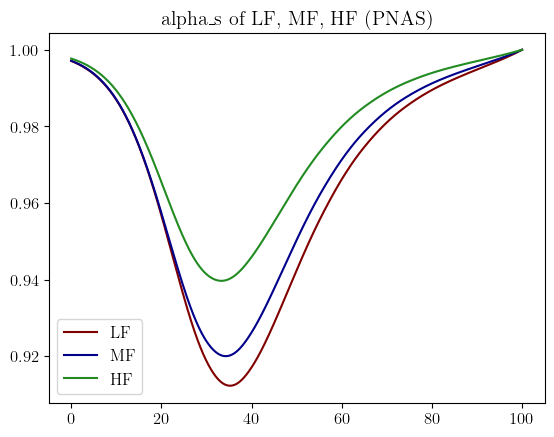

In [1432]:
random.seed(7)
date = 27
i = 1
debug[i] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

# import matplotlib.pyplot as plt
plt.plot(t_grid, debug[i][2][0, :], color="maroon",    label="LF")
plt.plot(t_grid, debug[i][2][1, :], color="darkblue",  label="MF")
plt.plot(t_grid, debug[i][2][2, :], color="forestgreen", label="HF")
plt.title('alpha_s of LF, MF, HF (PNAS)')
plt.legend(loc='best')

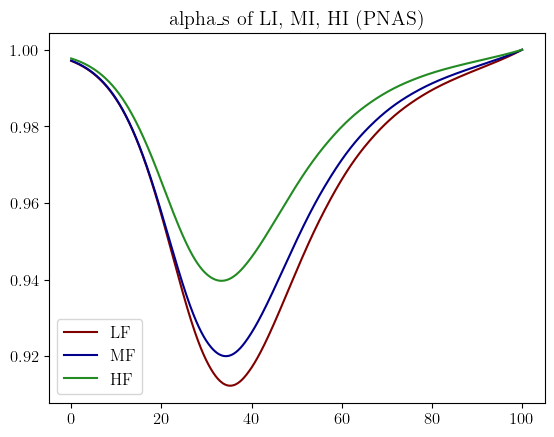

In [1433]:
plt.plot(t_grid, debug[i][2][3, :], color="maroon",    label="LF")
plt.plot(t_grid, debug[i][2][4, :], color="darkblue",  label="MF")
plt.plot(t_grid, debug[i][2][5, :], color="forestgreen", label="HF")
plt.title('alpha_s of LI, MI, HI (PNAS)')
plt.legend(loc='best')

### Official Experiments

### G1: Different Policies

In [1434]:
policy_debug = {}

In [1435]:
# all lambda 0.95
lambda_s_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_i_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_r_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_duration = np.zeros(0)

policy_debug[0] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  45.10239253946166 u conv: 1588.0928125140915
iter:  10 p conv:  0.8379413840109882 u conv: 9.32268298986906
iter:  20 p conv:  0.0008195564047341369 u conv: 0.02007259540929142
iter:  30 p conv:  1.982213586073193e-07 u conv: 2.4061124740224128e-06


In [1436]:
# all lambda 0.6
lambda_s_in = [0.6, 0.6, 0.6, 0.6, 0.6, 0.6]
lambda_i_in = [0.6, 0.6, 0.6, 0.6, 0.6, 0.6]
lambda_r_in = [0.6, 0.6, 0.6, 0.6, 0.6, 0.6]
lambda_duration = np.zeros(0)

policy_debug[1] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  34.000665494393786 u conv: 1575.02018665719
iter:  10 p conv:  1.5730358745792286 u conv: 8.433910125940336
iter:  20 p conv:  0.008649332990969786 u conv: 0.09113979599248392
iter:  30 p conv:  1.4052006623910446e-05 u conv: 8.484775247760781e-05
iter:  40 p conv:  8.262694607979975e-08 u conv: 7.283124744542509e-07


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


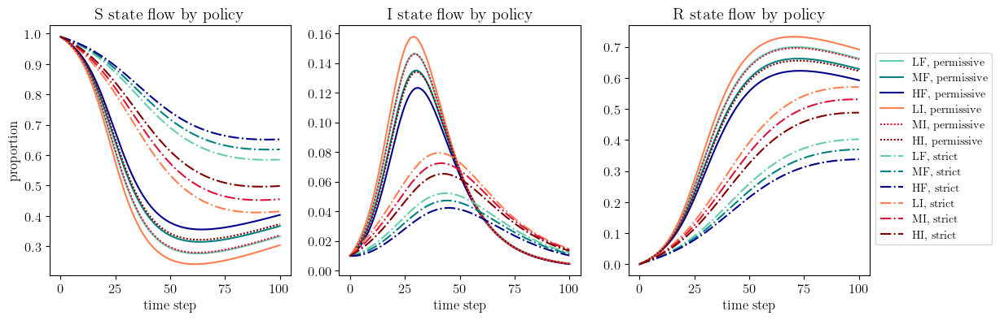

In [1437]:
block_names = ['LF', 'MF', 'HF', 'LI', 'MI', 'HI']
colors = ['mediumaquamarine', 'teal', 'darkblue', 'coral', 'crimson', 'maroon']
state_names = ['S', 'I', 'R']
policy_names = ['permissive', 'strict']
line_styles = ["-", "-.", "--"]

fig, ax= plt.subplots(1, 3, figsize=(13, 4))

for j in np.arange(2):
    for i in np.arange(6):
        if ((i == 4) or (i == 5)) and (j == 0):
            # line_styles[j] = ":"
            p_S_block_i = policy_debug[j][1][i,:]
            p_I_block_i = policy_debug[j][1][6 + i,:]
            p_R_block_i = policy_debug[j][1][12 + i,:]
            ax[0].plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            ax[1].plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            ax[2].plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            continue
        p_S_block_i = policy_debug[j][1][i,:]
        p_I_block_i = policy_debug[j][1][6 + i,:]
        p_R_block_i = policy_debug[j][1][12 + i,:]
        ax[0].plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        ax[1].plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        ax[2].plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
ax[0].set_title("S state flow by policy")
ax[0].set_xlabel('time step')
ax[0].set_ylabel('proportion')
ax[1].set_title("I state flow by policy")
ax[1].set_xlabel('time step')
# ax[1].set_ylabel('proportion')
ax[2].set_title("R state flow by policy")
ax[2].set_xlabel('time step')
# ax[2].set_ylabel('proportion')

handles, labels = ax[0].get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)
# fig.set_title("State Density by groups and policies")
title = "e1_p1"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

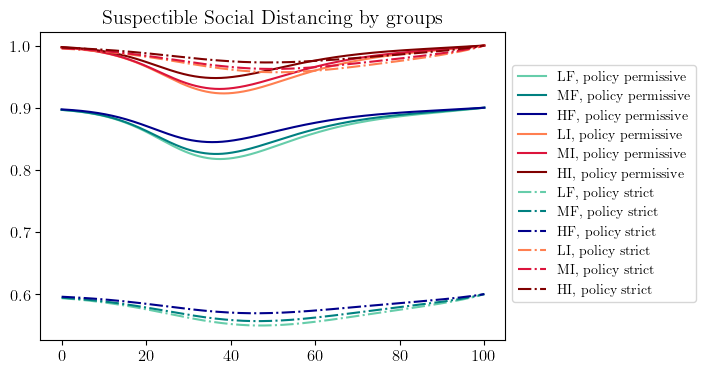

In [1438]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))

for j in np.arange(2):
    for i in np.arange(6):
        alpha_S_block_i = policy_debug[j][2][i,:]
        ax.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, policy {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax.set_title("Suspectible Social Distancing by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)
title = "e1_p2"
# plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

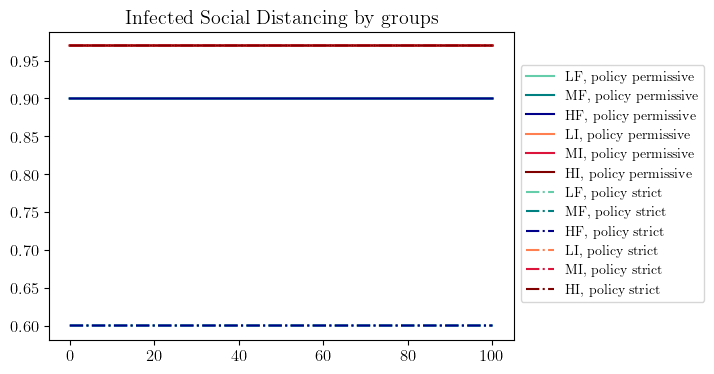

In [1439]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))

for j in np.arange(2):
    for i in np.arange(6):
        alpha_I_block_i = policy_debug[j][3][i,:]
        ax.plot(t_grid, alpha_I_block_i, label = f"{block_names[i]}, policy {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax.set_title("Infected Social Distancing by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)

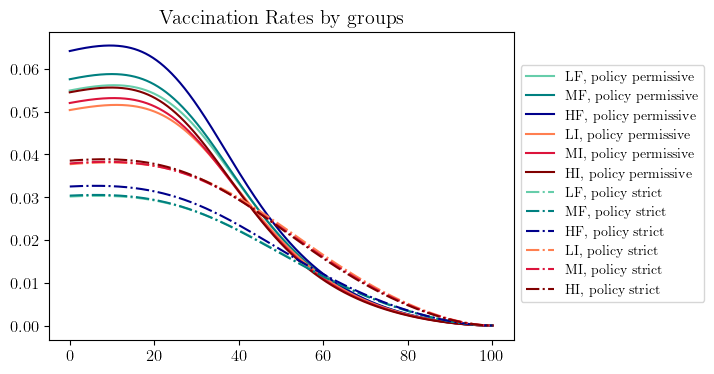

In [1440]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))

for j in np.arange(2):
    for i in np.arange(6):
        nu_block_i = policy_debug[j][5][i,:]
        ax.plot(t_grid, nu_block_i, label = f"{block_names[i]}, policy {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax.set_title("Vaccination Rates by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)
title = "e1_p3"
# plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


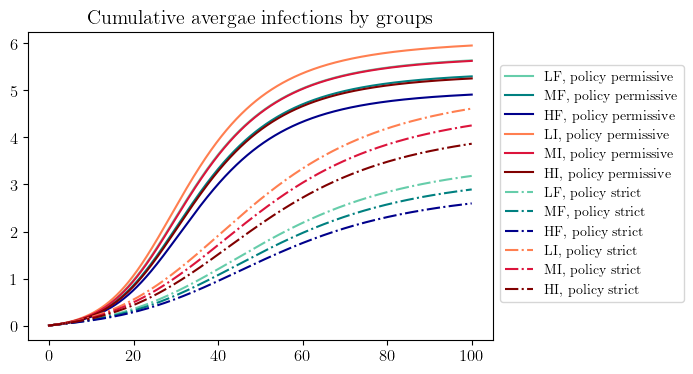

In [1441]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))
for j in np.arange(2):
    for i in np.arange(6):
        # p_S_block_i = policy_debug[j][1][i,:]
        p_I_block_i_cum_sum = np.cumsum(policy_debug[j][1][6 + i,:]) * Delta_t
        # p_R_block_i = policy_debug[j][1][12 + i,:]
        ax.plot(t_grid, p_I_block_i_cum_sum, label = f"{block_names[i]}, policy {policy_names[j]}", c=colors[i], linestyle=line_styles[j])

ax.set_title("Cumulative avergae infections by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)
title = "e1_p4"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

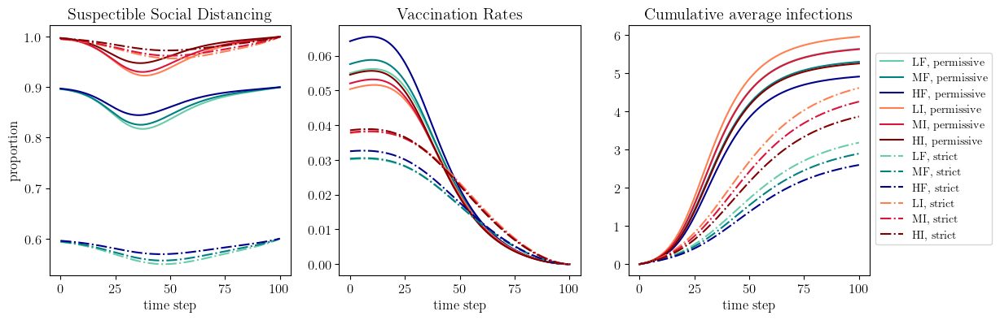

In [1442]:
fig, ax= plt.subplots(1, 3, figsize=(13, 4))

for j in np.arange(2):
    for i in np.arange(6):
        alpha_S_block_i = policy_debug[j][2][i,:]
        ax[0].plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        nu_block_i = policy_debug[j][5][i,:]
        ax[1].plot(t_grid, nu_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        p_I_block_i_cum_sum = np.cumsum(policy_debug[j][1][6 + i,:]) * Delta_t
        ax[2].plot(t_grid, p_I_block_i_cum_sum, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])

ax[0].set_title("Suspectible Social Distancing")
ax[0].set_xlabel('time step')
ax[0].set_ylabel('proportion')
ax[1].set_title("Vaccination Rates")
ax[1].set_xlabel('time step')
# ax[1].set_ylabel('proportion')
ax[2].set_title("Cumulative average infections")
ax[2].set_xlabel('time step')
# ax[2].set_ylabel('proportion')

handles, labels = ax[0].get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)
# fig.set_title("State Density by groups and policies")
title = "e1_p5"
# plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


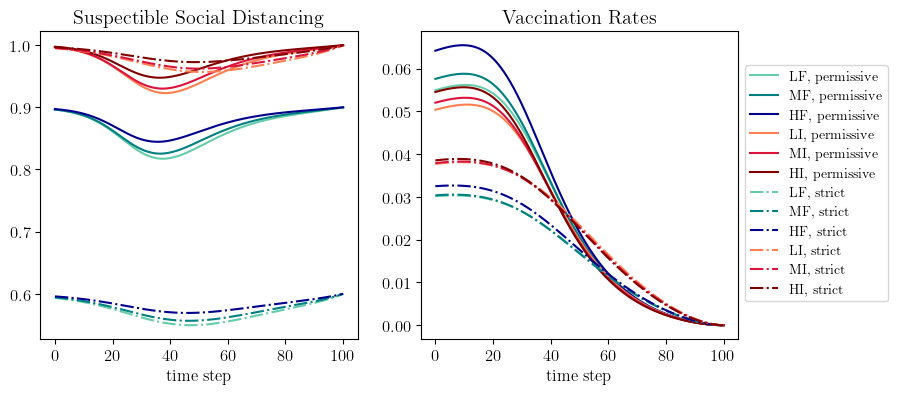

In [1443]:
fig, ax= plt.subplots(1, 2, figsize=(9, 4))

for j in np.arange(2):
    for i in np.arange(6):
        alpha_S_block_i = policy_debug[j][2][i,:]
        ax[0].plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        nu_block_i = policy_debug[j][5][i,:]
        ax[1].plot(t_grid, nu_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])

ax[0].set_title("Suspectible Social Distancing")
ax[0].set_xlabel('time step')
# ax[0].set_ylabel('proportion')
ax[1].set_title("Vaccination Rates")
ax[1].set_xlabel('time step')

handles, labels = ax[0].get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)
# fig.set_title("State Density by groups and policies")
title = "e1_p10"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


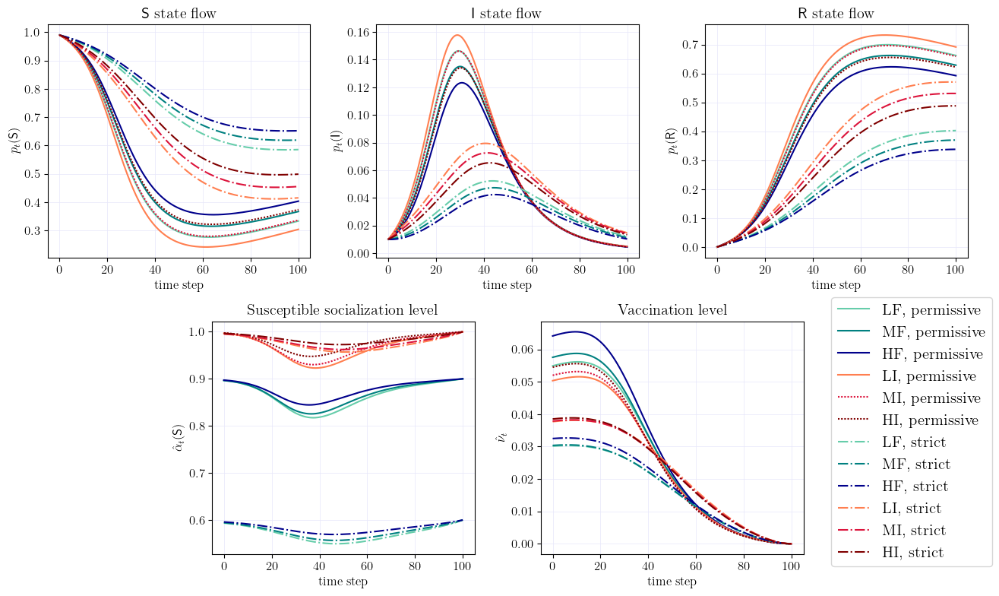

In [1444]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(13, 8))
gs = GridSpec(2, 6, figure=fig, height_ratios=[1, 1])

ax1 = fig.add_subplot(gs[0, 0:2])
ax1.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax2 = fig.add_subplot(gs[0, 2:4])
ax2.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax3 = fig.add_subplot(gs[0, 4:6])
ax3.grid(True, color='lavender', linestyle='-', linewidth=0.5)

ax4 = fig.add_subplot(gs[1, 1:3])
ax4.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax5 = fig.add_subplot(gs[1, 3:5])
ax5.grid(True, color='lavender', linestyle='-', linewidth=0.5)

for j in np.arange(2):
    for i in np.arange(6):
        if ((i == 4) or (i == 5)) and (j == 0):
            # line_styles[j] = ":"
            p_S_block_i = policy_debug[j][1][i,:]
            p_I_block_i = policy_debug[j][1][6 + i,:]
            p_R_block_i = policy_debug[j][1][12 + i,:]
            ax1.plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            ax2.plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            ax3.plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            continue
        p_S_block_i = policy_debug[j][1][i,:]
        p_I_block_i = policy_debug[j][1][6 + i,:]
        p_R_block_i = policy_debug[j][1][12 + i,:]
        ax1.plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        ax2.plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        ax3.plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
ax1.set_title(r"$\mathsf{S}$ state flow")
ax1.set_xlabel('time step')
ax1.set_ylabel(r'$p_{t}(\mathsf{S})$')
ax2.set_title(r"$\mathsf{I}$ state flow")
ax2.set_xlabel('time step')
ax2.set_ylabel(r'$p_{t}(\mathsf{I})$')
ax3.set_title(r"$\mathsf{R}$ state flow")
ax3.set_xlabel('time step')
ax3.set_ylabel(r'$p_{t}(\mathsf{R})$')


for j in np.arange(2):
    for i in np.arange(6):
        if ((i == 4) or (i == 5)) and (j == 0):
            # line_styles[j] = ":"
            alpha_S_block_i = policy_debug[j][2][i,:]
            ax4.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            nu_block_i = policy_debug[j][5][i,:]
            ax5.plot(t_grid, nu_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            continue
        alpha_S_block_i = policy_debug[j][2][i,:]
        ax4.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        nu_block_i = policy_debug[j][5][i,:]
        ax5.plot(t_grid, nu_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        # p_I_block_i_cum_sum = np.cumsum(policy_debug[j][1][6 + i,:]) * Delta_t
        # ax[2].plot(t_grid, p_I_block_i_cum_sum, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])

ax4.set_ylabel(r'$\hat{\alpha}_t(\mathsf{S})$')
ax4.set_title("Susceptible socialization level")
ax4.set_xlabel('time step')
# ax[0].set_ylabel('proportion')
ax5.set_title("Vaccination level")
ax5.set_xlabel('time step')
ax5.set_ylabel(r'$\hat{\nu}_t$')

handles, labels = ax1.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.84, 0.28),
           frameon=True,
           fontsize=15)


plt.tight_layout(h_pad=1.0)
title = "official_a1"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


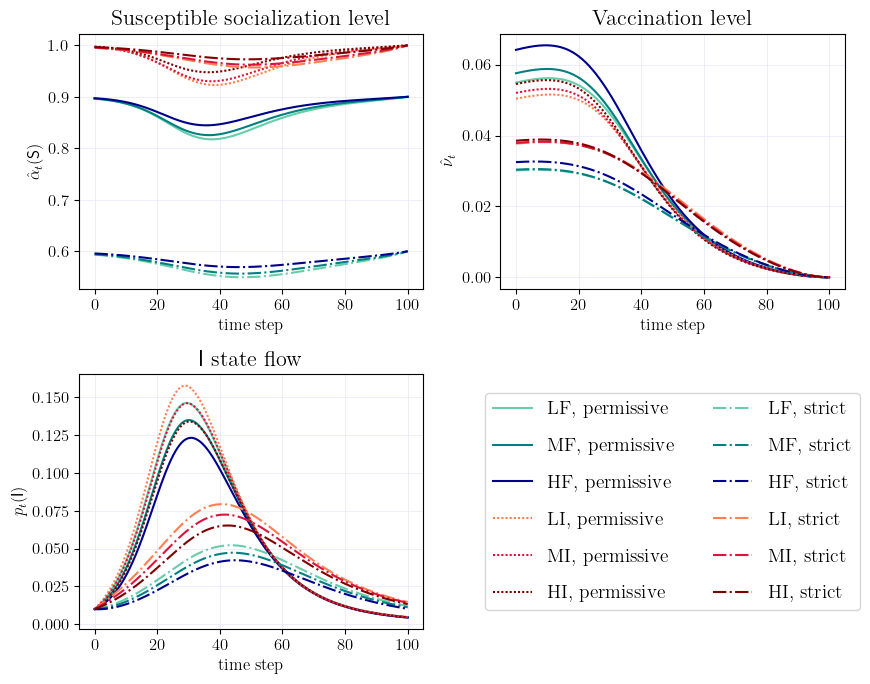

In [1449]:
fig, ax = plt.subplots(2, 2, figsize=(9, 7))

ax[0,0].grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax[0,1].grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax[1,0].grid(True, color='lavender', linestyle='-', linewidth=0.5)

for j in np.arange(2):
    for i in np.arange(6):
        if ((i == 3) or (i == 4) or (i == 5)) and (j == 0):
            # line_styles[j] = ":"
            p_S_block_i = policy_debug[j][1][i,:]
            p_I_block_i = policy_debug[j][1][6 + i,:]
            p_R_block_i = policy_debug[j][1][12 + i,:]
            # ax1.plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            ax[1,0].plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            # ax3.plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            continue
        p_S_block_i = policy_debug[j][1][i,:]
        p_I_block_i = policy_debug[j][1][6 + i,:]
        p_R_block_i = policy_debug[j][1][12 + i,:]
        # ax1.plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        ax[1,0].plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        # ax3.plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
ax[1,0].set_title(r"$\mathsf{I}$ state flow", fontsize=16)
ax[1,0].set_xlabel('time step')
ax[1,0].set_ylabel(r'$p_{t}(\mathsf{I})$')


for j in np.arange(2):
    for i in np.arange(6):
        if ((i == 3) or (i == 4) or (i == 5)) and (j == 0):
            alpha_S_block_i = policy_debug[j][2][i,:]
            ax[0,0].plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            nu_block_i = policy_debug[j][5][i,:]
            ax[0,1].plot(t_grid, nu_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            continue
        alpha_S_block_i = policy_debug[j][2][i,:]
        ax[0,0].plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        nu_block_i = policy_debug[j][5][i,:]
        ax[0,1].plot(t_grid, nu_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])

ax[0,0].set_ylabel(r'$\hat{\alpha}_t(\mathsf{S})$')
ax[0,0].set_title("Susceptible socialization level", fontsize=16)
ax[0,0].set_xlabel('time step')
# ax[0].set_ylabel('proportion')
ax[0,1].set_title("Vaccination level", fontsize=16)
ax[0,1].set_xlabel('time step')
ax[0,1].set_ylabel(r'$\hat{\nu}_t$')

handles, labels = ax[0,0].get_legend_handles_labels()

ax[1, 1].axis('off')

ax[1, 1].legend(handles, labels,
                loc='center',
                frameon=True,
                fontsize=14,
                ncol=2,
                labelspacing=1.0)


plt.tight_layout(h_pad=1.0)
title = "official_a1_nov26"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')
plt.show()

In [1450]:
# max difference between HF and LI over time (permissive), order: LF, MF, HF, LI, MI, HI
p_I_permissive_LF = policy_debug[0][1][6 + 0,:]
p_I_permissive_MF = policy_debug[0][1][6 + 1,:]
p_I_permissive_HF = policy_debug[0][1][6 + 2,:]
p_I_permissive_LI = policy_debug[0][1][6 + 3,:]
p_I_permissive_MI = policy_debug[0][1][6 + 4,:]
p_I_permissive_HI = policy_debug[0][1][6 + 5,:]

p_I_strict_LF = policy_debug[1][1][6 + 0,:]
p_I_strict_MF = policy_debug[1][1][6 + 1,:]
p_I_strict_HF = policy_debug[1][1][6 + 2,:]
p_I_strict_LI = policy_debug[1][1][6 + 3,:]
p_I_strict_MI = policy_debug[1][1][6 + 4,:]
p_I_strict_HI = policy_debug[1][1][6 + 5,:]

# argmax_t p_t^{LI}(I) - p_t^{HF}(I)
(p_I_permissive_LI - p_I_permissive_HF)[np.argmax(p_I_permissive_LI - p_I_permissive_HF)]

0.038597398130997176

In [1451]:
# max difference between socioeconomic groups (permissive)
alpha_S_permissive_LF = policy_debug[0][2][0,:]
alpha_S_permissive_MF = policy_debug[0][2][1,:]
alpha_S_permissive_HF = policy_debug[0][2][2,:]
alpha_S_permissive_LI = policy_debug[0][2][3,:]
alpha_S_permissive_MI = policy_debug[0][2][4,:]
alpha_S_permissive_HI = policy_debug[0][2][5,:]

alpha_S_strict_LF = policy_debug[1][2][0,:]
alpha_S_strict_MF = policy_debug[1][2][1,:]
alpha_S_strict_HF = policy_debug[1][2][2,:]
alpha_S_strict_LI = policy_debug[1][2][3,:]
alpha_S_strict_MI = policy_debug[1][2][4,:]
alpha_S_strict_HI = policy_debug[1][2][5,:]

(alpha_S_permissive_HF - alpha_S_permissive_LF)[np.argmax(alpha_S_permissive_HF - alpha_S_permissive_LF)]

0.028271175595984466

In [1452]:
# reduction in vaccinations
nu_permissive_LF = policy_debug[0][5][0,:]
nu_permissive_MF = policy_debug[0][5][1,:]
nu_permissive_HF = policy_debug[0][5][2,:]
nu_permissive_LI = policy_debug[0][5][3,:]
nu_permissive_MI = policy_debug[0][5][4,:]
nu_permissive_HI = policy_debug[0][5][5,:]

nu_strict_LF = policy_debug[1][5][0,:]
nu_strict_MF = policy_debug[1][5][1,:]
nu_strict_HF = policy_debug[1][5][2,:]
nu_strict_LI = policy_debug[1][5][3,:]
nu_strict_MI = policy_debug[1][5][4,:]
nu_strict_HI = policy_debug[1][5][5,:]

# LF
(nu_permissive_LF - nu_strict_LF)[np.argmax(nu_permissive_LF - nu_strict_LF)]

0.02596788782744162

In [1453]:
(nu_permissive_MF - nu_strict_MF)[np.argmax(nu_permissive_MF - nu_strict_MF)]

0.028355042978034962

In [1454]:
(nu_permissive_HF - nu_strict_HF)[np.argmax(nu_permissive_HF - nu_strict_HF)]

0.03289315404017107

In [1455]:
(nu_permissive_LI - nu_strict_LI)[np.argmax(nu_permissive_LI - nu_strict_LI)]

0.01347761478678746

In [1456]:
(nu_permissive_MI - nu_strict_MI)[np.argmax(nu_permissive_MI - nu_strict_MI)]

0.014935795851527225

In [1457]:
(nu_permissive_HI - nu_strict_HI)[np.argmax(nu_permissive_HI - nu_strict_HI)]

0.016793554308682547

In [1458]:
alpha_S_strict_LF = policy_debug[1][2][0,:]
alpha_S_strict_MF = policy_debug[1][2][1,:]
alpha_S_strict_HF = policy_debug[1][2][2,:]
alpha_S_strict_LI = policy_debug[1][2][3,:]
alpha_S_strict_MI = policy_debug[1][2][4,:]
alpha_S_strict_HI = policy_debug[1][2][5,:]

In [1459]:
for i in range(n_blocks):
    alpha_S_permissive_group = policy_debug[0][2][i,:]
    alpha_S_strict_group = policy_debug[1][2][i,:]
    alpha_peak_diff = np.min(alpha_S_strict_group) - np.min(alpha_S_permissive_group) # (alpha_S_strict_group - alpha_S_permissive_group)[np.argmax(alpha_S_strict_group - alpha_S_permissive_group)]
    # percentage_candidates = (alpha_S_strict_group - alpha_S_permissive_group) / alpha_S_permissive_group
    alpha_peak_increase_percentage = (np.min(alpha_S_strict_group) - np.min(alpha_S_permissive_group)) / np.min(alpha_S_permissive_group)
    print(f'{block_names[i]} socialization peak difference: {alpha_peak_diff}, peak increase by {alpha_peak_increase_percentage}')

LF socialization peak difference: -0.2678839558090539, peak increase by -0.32776242535445865
MF socialization peak difference: -0.2689884846859335, peak increase by -0.32585256118739286
HF socialization peak difference: -0.27539841859630454, peak increase by -0.3260875039530645
LI socialization peak difference: 0.034048124143993275, peak increase by 0.03689180919873318
MI socialization peak difference: 0.03220210189501482, peak increase by 0.03462147879341024
HI socialization peak difference: 0.0251128719332272, peak increase by 0.02650024275780961


In [1460]:
for i in range(n_blocks):
    nu_permissive_group = policy_debug[0][5][i,:]
    nu_strict_group = policy_debug[1][5][i,:]
    nu_peak_diff = np.max(nu_permissive_group) - np.max(nu_strict_group)# (nu_permissive_group - nu_strict_group)[np.argmax(nu_permissive_group - nu_strict_group)]
    # percentage_candidates = (nu_permissive_group[:6000] - nu_strict_group[:6000]) / nu_permissive_group[:6000]
    nu_peak_decrease_percentage = nu_peak_diff / np.max(nu_permissive_group) # percentage_candidates[np.argmax(percentage_candidates)]
    print(f'{block_names[i]} max vaxx difference: {nu_peak_diff}, max decrease by {nu_peak_decrease_percentage}')

LF max vaxx difference: 0.025852922187168843, max decrease by 0.46015508203929867
MF max vaxx difference: 0.02825453132401097, max decrease by 0.4806048595069273
HF max vaxx difference: 0.032799704478605876, max decrease by 0.5010262189333268
LI max vaxx difference: 0.013446150899624802, max decrease by 0.2606957341491689
MI max vaxx difference: 0.014904871666498752, max decrease by 0.2802969509242993
HI max vaxx difference: 0.0167624585363085, max decrease by 0.3012846630657077


Our aim: 

In [1461]:
# 0.9, 0.6, 1
lambda_s_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_i_in = [0.6, 0.6, 0.6, 0.6, 0.6, 0.6]
lambda_r_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_duration = np.zeros(0)

policy_debug[1] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  38.820705627809595 u conv: 1580.61460512871
iter:  10 p conv:  1.3982925628317489 u conv: 5.650026837299401
iter:  20 p conv:  0.004112352201481161 u conv: 0.02478976703426598
iter:  30 p conv:  7.413425175145081e-06 u conv: 3.2905049337018084e-05
iter:  40 p conv:  1.9141978143450366e-08 u conv: 9.19311711694948e-08


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


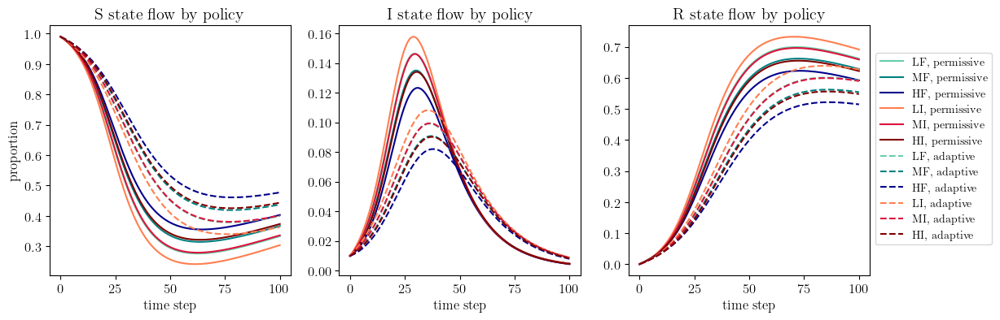

In [1462]:
block_names = ['LF', 'MF', 'HF', 'LI', 'MI', 'HI']
colors = ['mediumaquamarine', 'teal', 'darkblue', 'coral', 'crimson', 'maroon']
state_names = ['S', 'I', 'R']
policy_names = ['permissive', 'adaptive']
line_styles = ["-", "--"]

fig, ax= plt.subplots(1, 3, figsize=(13, 4))

for j in np.arange(2):
    for i in np.arange(6):
        p_S_block_i = policy_debug[j][1][i,:]
        p_I_block_i = policy_debug[j][1][6 + i,:]
        p_R_block_i = policy_debug[j][1][12 + i,:]
        ax[0].plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        ax[1].plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        ax[2].plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
ax[0].set_title("S state flow by policy")
ax[0].set_xlabel('time step')
ax[0].set_ylabel('proportion')
ax[1].set_title("I state flow by policy")
ax[1].set_xlabel('time step')
# ax[1].set_ylabel('proportion')
ax[2].set_title("R state flow by policy")
ax[2].set_xlabel('time step')
# ax[2].set_ylabel('proportion')

handles, labels = ax[0].get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)
# fig.set_title("State Density by groups and policies")
title = "e1_p6"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


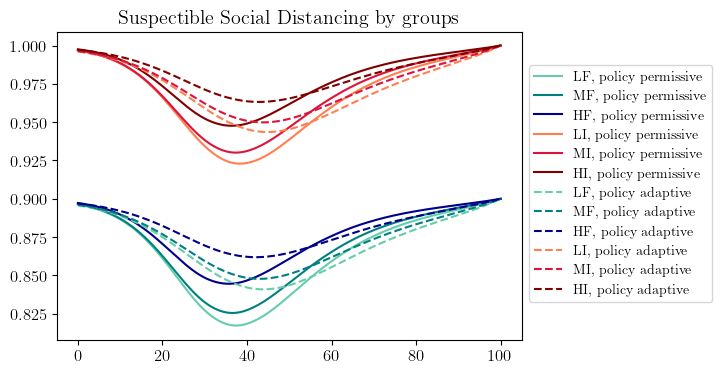

In [1463]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))

for j in np.arange(2):
    for i in np.arange(6):
        alpha_S_block_i = policy_debug[j][2][i,:]
        ax.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, policy {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax.set_title("Suspectible Social Distancing by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)
title = "e1_p7"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


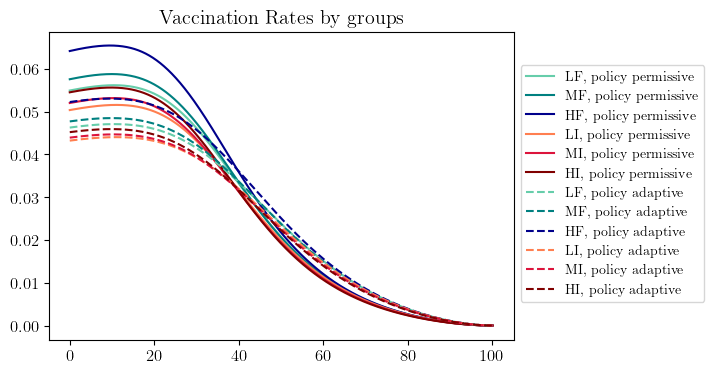

In [1464]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))

for j in np.arange(2):
    for i in np.arange(6):
        nu_block_i = policy_debug[j][5][i,:]
        ax.plot(t_grid, nu_block_i, label = f"{block_names[i]}, policy {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax.set_title("Vaccination Rates by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)
title = "e1_p8"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


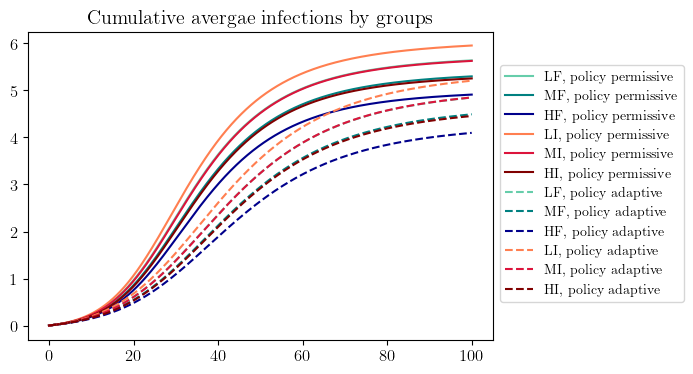

In [1465]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))
for j in np.arange(2):
    for i in np.arange(6):
        # p_S_block_i = policy_debug[j][1][i,:]
        p_I_block_i_cum_sum = np.cumsum(policy_debug[j][1][6 + i,:]) * Delta_t
        # p_R_block_i = policy_debug[j][1][12 + i,:]
        ax.plot(t_grid, p_I_block_i_cum_sum, label = f"{block_names[i]}, policy {policy_names[j]}", c=colors[i], linestyle=line_styles[j])

ax.set_title("Cumulative avergae infections by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)
title = "e1_p9"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


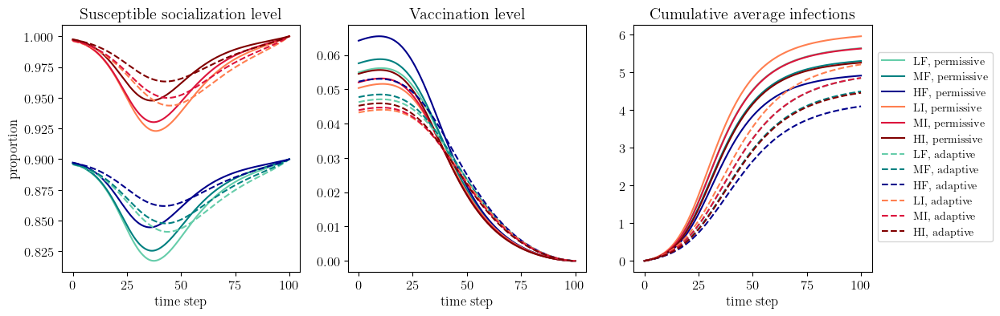

In [1466]:
fig, ax= plt.subplots(1, 3, figsize=(13, 4))

for j in np.arange(2):
    for i in np.arange(6):
        alpha_S_block_i = policy_debug[j][2][i,:]
        ax[0].plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        nu_block_i = policy_debug[j][5][i,:]
        ax[1].plot(t_grid, nu_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        p_I_block_i_cum_sum = np.cumsum(policy_debug[j][1][6 + i,:]) * Delta_t
        ax[2].plot(t_grid, p_I_block_i_cum_sum, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])

ax[0].set_title("Susceptible socialization level")
ax[0].set_xlabel('time step')
ax[0].set_ylabel('proportion')
ax[1].set_title("Vaccination level")
ax[1].set_xlabel('time step')
# ax[1].set_ylabel('proportion')
ax[2].set_title("Cumulative average infections")
ax[2].set_xlabel('time step')
# ax[2].set_ylabel('proportion')

handles, labels = ax[0].get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)
# fig.set_title("State Density by groups and policies")
title = "e1_p10"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


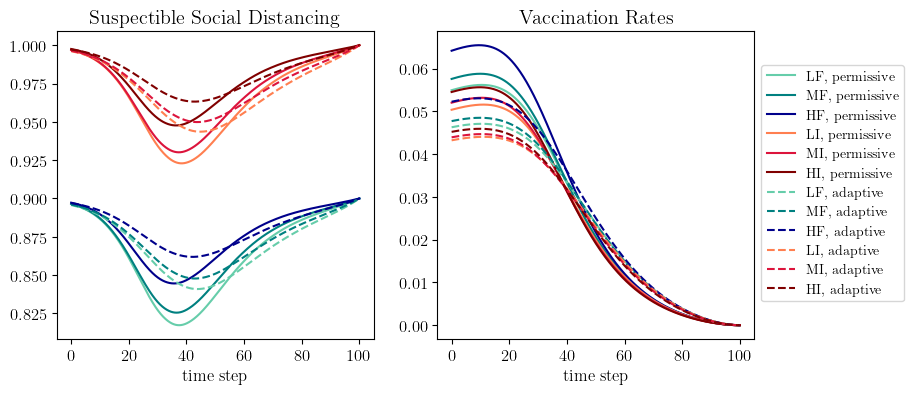

In [1467]:
fig, ax= plt.subplots(1, 2, figsize=(9, 4))

for j in np.arange(2):
    for i in np.arange(6):
        alpha_S_block_i = policy_debug[j][2][i,:]
        ax[0].plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        nu_block_i = policy_debug[j][5][i,:]
        ax[1].plot(t_grid, nu_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])

ax[0].set_title("Suspectible Social Distancing")
ax[0].set_xlabel('time step')
# ax[0].set_ylabel('proportion')
ax[1].set_title("Vaccination Rates")
ax[1].set_xlabel('time step')

handles, labels = ax[0].get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)
# fig.set_title("State Density by groups and policies")
title = "e1_p10"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


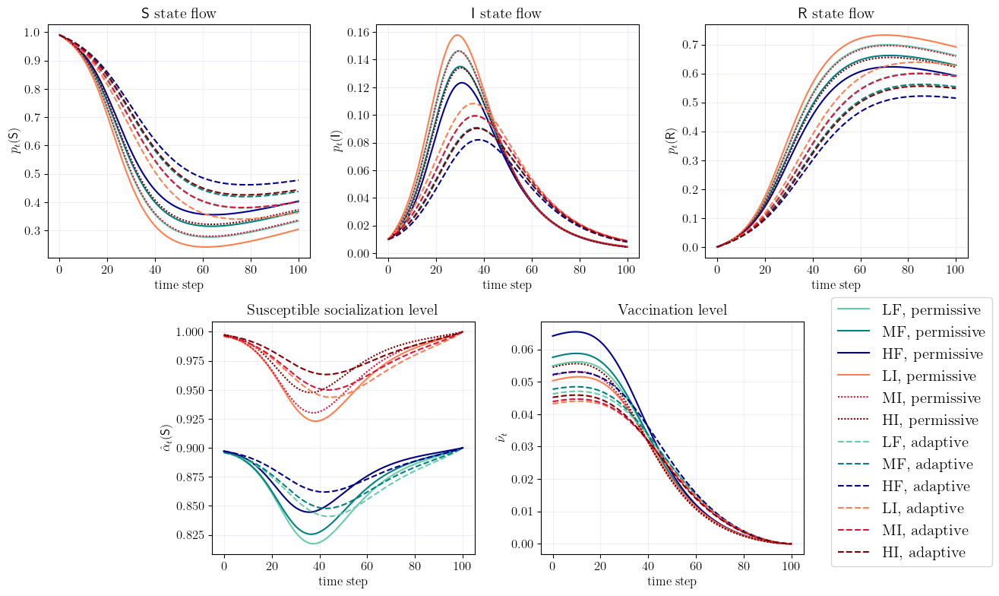

In [1468]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(13, 8))
gs = GridSpec(2, 6, figure=fig, height_ratios=[1, 1])

ax1 = fig.add_subplot(gs[0, 0:2])
ax1.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax2 = fig.add_subplot(gs[0, 2:4])
ax2.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax3 = fig.add_subplot(gs[0, 4:6])
ax3.grid(True, color='lavender', linestyle='-', linewidth=0.5)

ax4 = fig.add_subplot(gs[1, 1:3])
ax4.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax5 = fig.add_subplot(gs[1, 3:5])
ax5.grid(True, color='lavender', linestyle='-', linewidth=0.5)

for j in np.arange(2):
    for i in np.arange(6):
        if ((i == 4) or (i == 5)) and (j == 0):
            # line_styles[j] = ":"
            p_S_block_i = policy_debug[j][1][i,:]
            p_I_block_i = policy_debug[j][1][6 + i,:]
            p_R_block_i = policy_debug[j][1][12 + i,:]
            ax1.plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            ax2.plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            ax3.plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            continue
        p_S_block_i = policy_debug[j][1][i,:]
        p_I_block_i = policy_debug[j][1][6 + i,:]
        p_R_block_i = policy_debug[j][1][12 + i,:]
        ax1.plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        ax2.plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        ax3.plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
ax1.set_title(r"$\mathsf{S}$ state flow")
ax1.set_xlabel('time step')
ax1.set_ylabel(r'$p_{t}(\mathsf{S})$')
ax2.set_title(r"$\mathsf{I}$ state flow")
ax2.set_xlabel('time step')
ax2.set_ylabel(r'$p_{t}(\mathsf{I})$')
ax3.set_title(r"$\mathsf{R}$ state flow")
ax3.set_xlabel('time step')
ax3.set_ylabel(r'$p_{t}(\mathsf{R})$')

for j in np.arange(2):
    for i in np.arange(6):
        if ((i == 4) or (i == 5)) and (j == 0):
            # line_styles[j] = ":"
            alpha_S_block_i = policy_debug[j][2][i,:]
            ax4.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            nu_block_i = policy_debug[j][5][i,:]
            ax5.plot(t_grid, nu_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            continue
        alpha_S_block_i = policy_debug[j][2][i,:]
        ax4.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        nu_block_i = policy_debug[j][5][i,:]
        ax5.plot(t_grid, nu_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        # p_I_block_i_cum_sum = np.cumsum(policy_debug[j][1][6 + i,:]) * Delta_t
        # ax[2].plot(t_grid, p_I_block_i_cum_sum, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])

ax4.set_ylabel(r'$\hat{\alpha}_t(\mathsf{S})$')
ax4.set_title("Susceptible socialization level")
ax4.set_xlabel('time step')
# ax[0].set_ylabel('proportion')
ax5.set_title("Vaccination level")
ax5.set_xlabel('time step')
ax5.set_ylabel(r'$\hat{\nu}_t$')

handles, labels = ax1.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.84, 0.28),
           frameon=True,
           fontsize=15)


plt.tight_layout(h_pad=1.0)
title = "official_a2"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


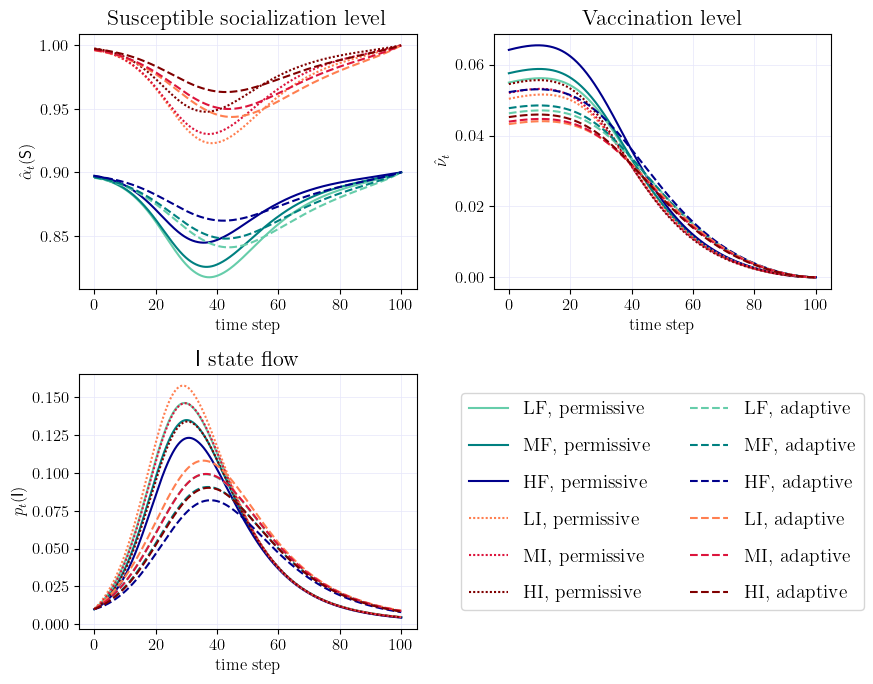

In [1469]:
fig, ax = plt.subplots(2, 2, figsize=(9, 7))

ax[0,0].grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax[0,1].grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax[1,0].grid(True, color='lavender', linestyle='-', linewidth=0.5)

for j in np.arange(2):
    for i in np.arange(6):
        if ((i == 3) or (i == 4) or (i == 5)) and (j == 0):
            # line_styles[j] = ":"
            p_S_block_i = policy_debug[j][1][i,:]
            p_I_block_i = policy_debug[j][1][6 + i,:]
            p_R_block_i = policy_debug[j][1][12 + i,:]
            # ax1.plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            ax[1,0].plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            # ax3.plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            continue
        p_S_block_i = policy_debug[j][1][i,:]
        p_I_block_i = policy_debug[j][1][6 + i,:]
        p_R_block_i = policy_debug[j][1][12 + i,:]
        # ax1.plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        ax[1,0].plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        # ax3.plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
ax[1,0].set_title(r"$\mathsf{I}$ state flow", fontsize=16)
ax[1,0].set_xlabel('time step')
ax[1,0].set_ylabel(r'$p_{t}(\mathsf{I})$')


for j in np.arange(2):
    for i in np.arange(6):
        if ((i == 3) or (i == 4) or (i == 5)) and (j == 0):
            # line_styles[j] = ":"
            alpha_S_block_i = policy_debug[j][2][i,:]
            ax[0,0].plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            nu_block_i = policy_debug[j][5][i,:]
            ax[0,1].plot(t_grid, nu_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=(0, (1, 1)))
            continue
        alpha_S_block_i = policy_debug[j][2][i,:]
        ax[0,0].plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        nu_block_i = policy_debug[j][5][i,:]
        ax[0,1].plot(t_grid, nu_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])

ax[0,0].set_ylabel(r'$\hat{\alpha}_t(\mathsf{S})$')
ax[0,0].set_title("Susceptible socialization level", fontsize=16)
ax[0,0].set_xlabel('time step')
# ax[0].set_ylabel('proportion')
ax[0,1].set_title("Vaccination level", fontsize=16)
ax[0,1].set_xlabel('time step')
ax[0,1].set_ylabel(r'$\hat{\nu}_t$')

handles, labels = ax[0,0].get_legend_handles_labels()

ax[1, 1].axis('off')

ax[1, 1].legend(handles, labels,
                loc='center',
                frameon=True,
                fontsize=14,
                ncol=2,
                labelspacing=1.0)


plt.tight_layout(h_pad=1.0)
title = "official_a2_nov26"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')
plt.show()

In [1470]:
alpha_S_adaptive_LF = policy_debug[1][2][0,:]
alpha_S_adaptive_MF = policy_debug[1][2][1,:]
alpha_S_adaptive_HF = policy_debug[1][2][2,:]
alpha_S_adaptive_LI = policy_debug[1][2][3,:]
alpha_S_adaptive_MI = policy_debug[1][2][4,:]
alpha_S_adaptive_HI = policy_debug[1][2][5,:]

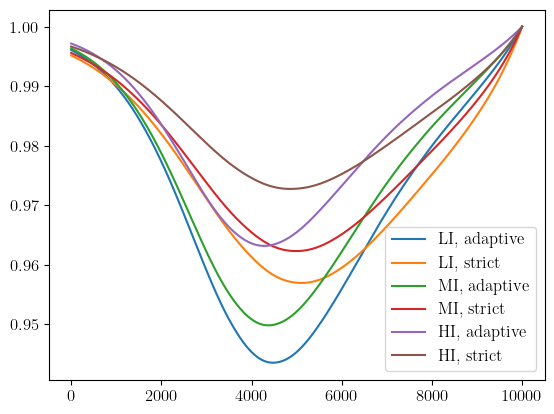

In [1471]:
plt.plot(alpha_S_adaptive_LI, label = "LI, adaptive")
plt.plot(alpha_S_strict_LI, label = "LI, strict")
plt.plot(alpha_S_adaptive_MI, label = "MI, adaptive")
plt.plot(alpha_S_strict_MI, label = "MI, strict")
plt.plot(alpha_S_adaptive_HI, label = "HI, adaptive")
plt.plot(alpha_S_strict_HI, label = "HI, strict")
plt.legend()

In [1472]:
p_I_adaptive_LF = policy_debug[1][1][6 + 0,:]
p_I_adaptive_MF = policy_debug[1][1][6 + 1,:]
p_I_adaptive_HF = policy_debug[1][1][6 + 2,:]
p_I_adaptive_LI = policy_debug[1][1][6 + 3,:]
p_I_adaptive_MI = policy_debug[1][1][6 + 4,:]
p_I_adaptive_HI = policy_debug[1][1][6 + 5,:]

p_I_by_policy = {
    "permissive": [p_I_permissive_LF, p_I_permissive_MF, p_I_permissive_HF, p_I_permissive_LI, p_I_permissive_MI, p_I_permissive_HI],
    "strict": [p_I_strict_LF, p_I_strict_MF, p_I_strict_HF, p_I_strict_LI, p_I_strict_MI, p_I_strict_HI],
    "adaptive": [p_I_adaptive_LF, p_I_adaptive_MF, p_I_adaptive_HF, p_I_adaptive_LI, p_I_adaptive_MI, p_I_adaptive_HI]
}

three_policy_names = ['permissive', 'strict', 'adaptive']

In [1473]:
for i in range(n_blocks):
    p_I_permissive_group = p_I_by_policy['permissive'][i]
    p_I_adaptive_group = p_I_by_policy['adaptive'][i]
    p_I_strict_group = p_I_by_policy['strict'][i]
    peak_diff_adaptive = np.max(p_I_permissive_group) - np.max(p_I_adaptive_group)
    peak_diff_strict = np.max(p_I_permissive_group) - np.max(p_I_strict_group)
    print(f'{block_names[i]} infection peak difference w/ adaptive: {peak_diff_adaptive}, infection peak difference w/ strict: {peak_diff_strict}')

LF infection peak difference w/ adaptive: 0.04717737362874251, infection peak difference w/ strict: 0.09409583473904451
MF infection peak difference w/ adaptive: 0.04426382696007604, infection peak difference w/ strict: 0.08774093898774742
HF infection peak difference w/ adaptive: 0.04128696325735075, infection peak difference w/ strict: 0.08095680444649643
LI infection peak difference w/ adaptive: 0.04958694094075036, infection peak difference w/ strict: 0.07839046405935493
MI infection peak difference w/ adaptive: 0.04676158125250329, infection peak difference w/ strict: 0.07365476721739496
HI infection peak difference w/ adaptive: 0.04382208336063223, infection peak difference w/ strict: 0.0687456957777093


In [1474]:
for i in range(n_blocks):
    alpha_S_permissive_group = policy_debug[0][2][i,:]
    alpha_S_adaptive_group = policy_debug[1][2][i,:]
    alpha_peak_diff = np.min(alpha_S_adaptive_group) - np.min(alpha_S_permissive_group) # (alpha_S_strict_group - alpha_S_permissive_group)[np.argmax(alpha_S_strict_group - alpha_S_permissive_group)]
    # percentage_candidates = (alpha_S_strict_group - alpha_S_permissive_group) / alpha_S_permissive_group
    alpha_peak_increase_percentage = (np.min(alpha_S_adaptive_group) - np.min(alpha_S_permissive_group)) / np.min(alpha_S_permissive_group)
    print(f'{block_names[i]} socialization peak difference: {alpha_peak_diff}, peak increase by {alpha_peak_increase_percentage}')

LF socialization peak difference: 0.023583428251072847, peak increase by 0.028854888372837915
MF socialization peak difference: 0.022264792494566032, peak increase by 0.0269715622478451
HF socialization peak difference: 0.01733356847937184, peak increase by 0.02052393804164613
LI socialization peak difference: 0.020653528442791558, peak increase by 0.02237850247989349
MI socialization peak difference: 0.01972683608285908, peak increase by 0.02120893348298844
HI socialization peak difference: 0.015544534840604363, peak increase by 0.01640329899059491


In [1475]:
for i in range(n_blocks):
    nu_permissive_group = policy_debug[0][5][i,:]
    nu_adaptive_group = policy_debug[1][5][i,:]
    nu_peak_diff = np.max(nu_permissive_group) - np.max(nu_adaptive_group)# (nu_permissive_group - nu_strict_group)[np.argmax(nu_permissive_group - nu_strict_group)]
    # percentage_candidates = (nu_permissive_group[:6000] - nu_strict_group[:6000]) / nu_permissive_group[:6000]
    nu_peak_decrease_percentage = nu_peak_diff / np.max(nu_permissive_group) # percentage_candidates[np.argmax(percentage_candidates)]
    print(f'{block_names[i]} max vaxx difference: {nu_peak_diff}, max decrease by {nu_peak_decrease_percentage}')

LF max vaxx difference: 0.009093309878992505, max decrease by 0.16185144267572593
MF max vaxx difference: 0.010295583403154472, max decrease by 0.175126154395276
HF max vaxx difference: 0.012411721816454932, max decrease by 0.18959311222474198
LI max vaxx difference: 0.007533664711428807, max decrease by 0.1460636778094185
MI max vaxx difference: 0.008492025432693125, max decrease by 0.15969871389806006
HI max vaxx difference: 0.009712714052674896, max decrease by 0.1745741398539597


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


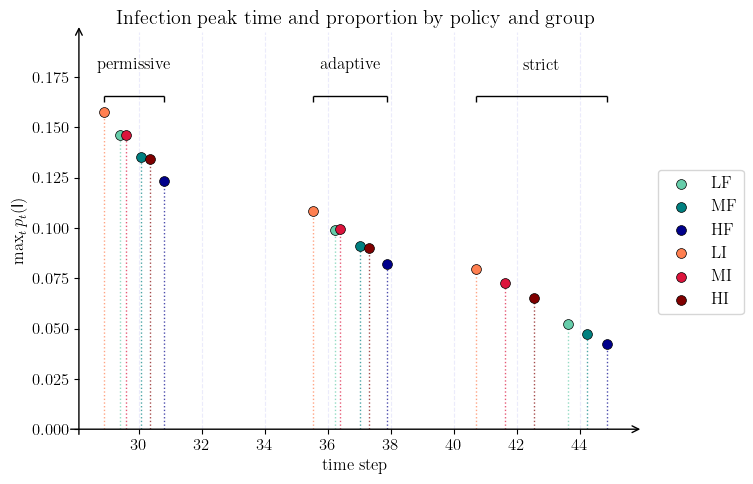

In [1476]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.transforms as mtransforms

n_policy = 3
n_group = 6

policy_names = ["permissive", "strict", "adaptive"]

temp_colors = ['mediumaquamarine', 'teal', 'darkblue',
               'coral', 'crimson', 'maroon']

fig, ax = plt.subplots(figsize=(8, 5))

peaks_t = [[] for _ in range(n_policy)]
peaks_v = [[] for _ in range(n_policy)]
max_peak = 0.0

for p in range(n_policy):
    for g in range(len(block_names)):
        I_curve = p_I_by_policy[three_policy_names[p]][g]
        peak_idx = np.argmax(I_curve)
        t_peak = t_grid[peak_idx]
        v_peak = I_curve[peak_idx]

        peaks_t[p].append(t_peak)
        peaks_v[p].append(v_peak)
        max_peak = max(max_peak, v_peak)
        ax.vlines(t_peak, 0, v_peak,
                  linestyles="dotted",
                  linewidth=1.0,
                  color=temp_colors[g],
                  alpha=0.7)
        ax.scatter(t_peak, v_peak,
                   s=50,
                   color=temp_colors[g],
                   edgecolor="black",
                   linewidth=0.5,
                   label=block_names[g] if p == 0 else "_nolegend_",
                   zorder=3)

y_bracket = max_peak * 1.05
y_text = max_peak * 1.12

for p in range(n_policy):
    t_min = min(peaks_t[p])
    t_max = max(peaks_t[p])
    t_center = 0.5 * (t_min + t_max)

    ax.hlines(y_bracket, t_min, t_max, color="black", linewidth=1.0)

    ax.vlines(t_min, y_bracket, y_bracket - 0.02 * max_peak,
              color="black", linewidth=1.0)
    ax.vlines(t_max, y_bracket, y_bracket - 0.02 * max_peak,
              color="black", linewidth=1.0)

    ax.text(t_center, y_text, policy_names[p],
            ha="center", va="bottom", fontsize=12)

ax.set_xlabel("time step")
ax.set_ylabel(r"$\max_t p_{t}(\mathsf{I})$")

ax.set_ylim(bottom=0, top=max_peak * 1.25)

ax.grid(axis="x", linestyle="--", alpha=0.8, color = 'lavender')

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

ax.spines["left"].set_visible(False)
ax.spines["bottom"].set_visible(False)

ax.annotate(
    "", xy=(1.02, 0), xytext=(-0.02, 0),
    xycoords="axes fraction",
    arrowprops=dict(arrowstyle="->", linewidth=1)
)

ax.annotate(
    "", xy=(0, 1.02), xytext=(0, -0.02),
    xycoords="axes fraction",
    arrowprops=dict(arrowstyle="->", linewidth=1)
)

ax.xaxis.set_ticks_position("bottom")
ax.yaxis.set_ticks_position("left")
ax.set_title("Infection peak time and proportion by policy and group")

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels,
           loc="center right",
           bbox_to_anchor=(0.95, 0.5),
           frameon=True)

fig.tight_layout()
fig.subplots_adjust(right=0.8)

title = "extra_a1"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')
plt.show()


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


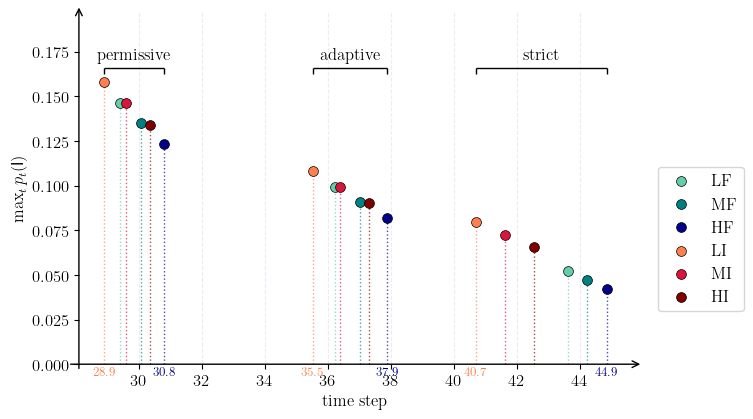

In [1477]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.transforms as mtransforms

n_policy = 3
n_group = 6

policy_names = ["permissive", "strict", "adaptive"]

temp_colors = ['mediumaquamarine', 'teal', 'darkblue',
               'coral', 'crimson', 'maroon']

fig, ax = plt.subplots(figsize=(8, 5))

peaks_t = [[] for _ in range(n_policy)]
peaks_v = [[] for _ in range(n_policy)]
peaks_g = [[] for _ in range(n_policy)]
max_peak = 0.0

for p in range(n_policy):
    for g in range(len(block_names)):
        I_curve = p_I_by_policy[three_policy_names[p]][g]
        peak_idx = np.argmax(I_curve)
        t_peak = t_grid[peak_idx]
        v_peak = I_curve[peak_idx]

        peaks_t[p].append(t_peak)
        peaks_v[p].append(v_peak)
        peaks_g[p].append(g)         
        max_peak = max(max_peak, v_peak)

        ax.vlines(t_peak, 0, v_peak,
                  linestyles="dotted",
                  linewidth=1.0,
                  color=temp_colors[g],
                  alpha=0.7)
        ax.scatter(t_peak, v_peak,
                   s=50,
                   color=temp_colors[g],
                   edgecolor="black",
                   linewidth=0.5,
                   label=block_names[g] if p == 0 else "_nolegend_",
                   zorder=3)

y_bracket = max_peak * 1.05
y_text = max_peak * 1.12

for p in range(n_policy):
    t_arr = np.array(peaks_t[p])
    t_min = t_arr.min()
    t_max = t_arr.max()
    t_center = 0.5 * (t_min + t_max)

    ax.hlines(y_bracket, t_min, t_max,
              color="black", linewidth=1.0)

    ax.vlines(t_min, y_bracket, y_bracket - 0.02 * max_peak,
              color="black", linewidth=1.0)
    ax.vlines(t_max, y_bracket, y_bracket - 0.02 * max_peak,
              color="black", linewidth=1.0)

    ax.text(t_center, y_text-0.008, policy_names[p],
            ha="center", va="bottom", fontsize=12, color="black")

trans = mtransforms.blended_transform_factory(ax.transData, ax.transAxes)
y_axis_text = -0.005

for p in range(n_policy):
    t_arr = np.array(peaks_t[p])
    g_arr = np.array(peaks_g[p])

    idx_min = np.argmin(t_arr)
    t_min = t_arr[idx_min]
    g_min = g_arr[idx_min]
    color_left = temp_colors[g_min]

    ax.text(t_min, y_axis_text,
            f"{t_min:.1f}",
            transform=trans,
            ha="center", va="top",
            fontsize=9,
            color=color_left)

    idx_max = np.argmax(t_arr)
    t_max = t_arr[idx_max]
    g_max = g_arr[idx_max]
    color_right = temp_colors[g_max]

    ax.text(t_max, y_axis_text,
            f"{t_max:.1f}",
            transform=trans,
            ha="center", va="top",
            fontsize=9,
            color=color_right)

ax.set_xlabel("time step")
ax.set_ylabel(r"$\max_t p_{t}(\mathsf{I})$")

ax.set_ylim(bottom=0, top=max_peak * 1.25)

ax.grid(axis="x", linestyle="--", alpha=0.8, color = 'lavender')

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.spines["bottom"].set_visible(False)

ax.annotate(
    "", xy=(1.02, 0), xytext=(-0.02, 0),
    xycoords="axes fraction",
    arrowprops=dict(arrowstyle="->", linewidth=1)
)
ax.annotate(
    "", xy=(0, 1.02), xytext=(0, -0.02),
    xycoords="axes fraction",
    arrowprops=dict(arrowstyle="->", linewidth=1)
)

ax.xaxis.set_ticks_position("bottom")
ax.yaxis.set_ticks_position("left")
# ax.set_title("Infection peak time and proportion by policy and group")

# group legend
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels,
           loc="center right",
           bbox_to_anchor=(0.95, 0.5),
           frameon=True)

fig.tight_layout()
fig.subplots_adjust(right=0.8, bottom=0.25) 

title = "extra_a1"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')
plt.show()

In [1478]:
(p_I_permissive_LI - p_I_permissive_HF)[np.argmax(p_I_permissive_LI - p_I_permissive_HF)]

0.038597398130997176

In [1479]:
(p_I_adaptive_LI - p_I_adaptive_HF)[np.argmax(p_I_adaptive_LI - p_I_adaptive_HF)]

0.02835518024358913

In [1480]:
(p_I_strict_LI - p_I_strict_HF)[np.argmax(p_I_strict_LI - p_I_strict_HF)]

0.03853057080237009

In [1481]:
np.max(p_I_permissive_LI) - np.max(p_I_permissive_HF)

0.03451178325610574

In [1482]:
np.max(p_I_adaptive_LI) - np.max(p_I_adaptive_HF)

0.026211805572706123

In [1483]:
np.max(p_I_strict_LI) - np.max(p_I_strict_HF)

0.03707812364324724

In [1484]:
(p_I_permissive_LF - p_I_permissive_HF)[np.argmax(p_I_permissive_LF - p_I_permissive_HF)]

0.026040508662917253

In [1485]:
(p_I_permissive_LI - p_I_permissive_HI)[np.argmax(p_I_permissive_LI - p_I_permissive_HI)]

0.02744271086960992

In [1486]:
(p_I_adaptive_LF - p_I_adaptive_HF)[np.argmax(p_I_adaptive_LF - p_I_adaptive_HF)]

0.018646549910459928

In [1487]:
(p_I_adaptive_LI - p_I_adaptive_HI)[np.argmax(p_I_adaptive_LI - p_I_adaptive_HI)]

0.019888060066721364

In [1488]:
(p_I_strict_LF - p_I_strict_HF)[np.argmax(p_I_strict_LF - p_I_strict_HF)]

0.010259169586554366

In [1489]:
(p_I_strict_LI - p_I_strict_HI)[np.argmax(p_I_strict_LI - p_I_strict_HI)]

0.015236268742782659

In [1490]:
block_names = ['LF', 'MF', 'HF', 'LI', 'MI', 'HI']
colors = ['mediumaquamarine', 'teal', 'darkblue', 'coral', 'crimson', 'maroon']
state_names = ['S', 'I', 'R']
line_styles = ["-", ":", "--"]

In [1491]:
# reduction in social levels across policy
(alpha_S_permissive_HF - alpha_S_permissive_LF)[np.argmax(alpha_S_permissive_HF - alpha_S_permissive_LF)]

0.028271175595984466

In [1492]:
(alpha_S_adaptive_HF - alpha_S_adaptive_LF)[np.argmax(alpha_S_adaptive_HF - alpha_S_adaptive_LF)]

0.021435505170167457

In [1493]:
(alpha_S_strict_HF - alpha_S_strict_LF)[np.argmax(alpha_S_strict_HF - alpha_S_strict_LF)]

0.019826513767181142

In [1494]:
# reduction in social levels across policy
(alpha_S_permissive_HI - alpha_S_permissive_LI)[np.argmax(alpha_S_permissive_HI - alpha_S_permissive_LI)]

0.025956839903362727

In [1495]:
(alpha_S_adaptive_HI - alpha_S_adaptive_LI)[np.argmax(alpha_S_adaptive_HI - alpha_S_adaptive_LI)]

0.02018187815795225

In [1496]:
(alpha_S_strict_HI - alpha_S_strict_LI)[np.argmax(alpha_S_strict_HI - alpha_S_strict_LI)]

0.016092749750072466

In [1497]:
nu_adaptive_LF = policy_debug[1][5][0,:]
nu_adaptive_MF = policy_debug[1][5][1,:]
nu_adaptive_HF = policy_debug[1][5][2,:]
nu_adaptive_LI = policy_debug[1][5][3,:]
nu_adaptive_MI = policy_debug[1][5][4,:]
nu_adaptive_HI = policy_debug[1][5][5,:]

In [1498]:
(nu_permissive_HF - nu_permissive_LI)[np.argmax(nu_permissive_HF - nu_permissive_LI)]

0.013977683822011387

In [1499]:
(nu_adaptive_HF - nu_adaptive_LI)[np.argmax(nu_adaptive_HF - nu_adaptive_LI)]

0.009078477071766296

In [1500]:
(nu_strict_HI - nu_strict_LF)[np.argmax(nu_strict_HI - nu_strict_LF)]

0.008603286203233623

In [1501]:
(nu_permissive_HF - nu_permissive_LF)[np.argmax(nu_permissive_HF - nu_permissive_LF)]

0.009342115706717315

In [1502]:
(nu_adaptive_HF - nu_adaptive_LF)[np.argmax(nu_adaptive_HF - nu_adaptive_LF)]

0.006006947751064119

In [1503]:
(nu_strict_HF - nu_strict_LF)[np.argmax(nu_strict_HF - nu_strict_LF)]

0.0023479859917076434

In [1504]:
(nu_permissive_HI - nu_permissive_LI)[np.argmax(nu_permissive_HI - nu_permissive_LI)]

0.0041702130519797945

In [1505]:
(nu_adaptive_HI - nu_adaptive_LI)[np.argmax(nu_adaptive_HI - nu_adaptive_LI)]

0.001980317994870466

In [1506]:
(nu_strict_HI - nu_strict_LI)[np.argmax(nu_strict_HI - nu_strict_LI)]

0.0008247939844324148

### G2: Sensitivity Analysis on kappa

In [1507]:
kappa_debug = {}

lambda_s_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_i_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_r_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_duration = np.zeros(0)

In [1508]:
kappa = np.array([0.03, 0.03, 0.03, 0.03, 0.03, 0.03])

kappa_debug[0] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  45.10239253946166 u conv: 1588.0928125140915
iter:  10 p conv:  0.8379413840109882 u conv: 9.32268298986906
iter:  20 p conv:  0.0008195564047341369 u conv: 0.02007259540929142
iter:  30 p conv:  1.982213586073193e-07 u conv: 2.4061124740224128e-06


In [1509]:
kappa = np.array([0.1, 0.1, 0.1, 0.1, 0.1, 0.1])

kappa_debug[1] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  45.10239253946166 u conv: 1588.0928125140915
iter:  10 p conv:  0.1541469067570807 u conv: 1.5701880437152334
iter:  20 p conv:  0.0002775500268986362 u conv: 0.0033139024891594357
iter:  30 p conv:  4.039745075117735e-07 u conv: 4.978459993630822e-06


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


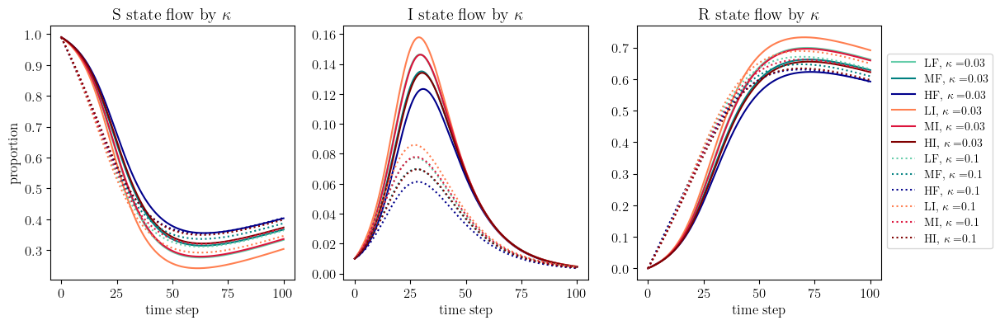

In [1510]:
kappa_pool = [0.03, 0.1]
fig, ax= plt.subplots(1, 3, figsize=(13, 4))
n_candidates = len(kappa_debug)

for j in np.arange(n_candidates):
    for i in np.arange(6):
        p_S_block_i = kappa_debug[j][1][i,:]
        p_I_block_i = kappa_debug[j][1][6 + i,:]
        p_R_block_i = kappa_debug[j][1][12 + i,:]
        ax[0].plot(t_grid, p_S_block_i, label = f"{block_names[i]}, $\kappa=${kappa_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax[1].plot(t_grid, p_I_block_i, label = f"{block_names[i]}, $\kappa=${kappa_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax[2].plot(t_grid, p_R_block_i, label = f"{block_names[i]}, $\kappa=${kappa_pool[j]}", c=colors[i], linestyle=line_styles[j])
ax[0].set_title("S state flow by $\kappa$")
ax[0].set_xlabel('time step')
ax[0].set_ylabel('proportion')
ax[1].set_title("I state flow by $\kappa$")
ax[1].set_xlabel('time step')
# ax[1].set_ylabel('proportion')
ax[2].set_title("R state flow by $\kappa$")
ax[2].set_xlabel('time step')
# ax[2].set_ylabel('proportion')

handles, labels = ax[0].get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)
title = "e2_p1"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


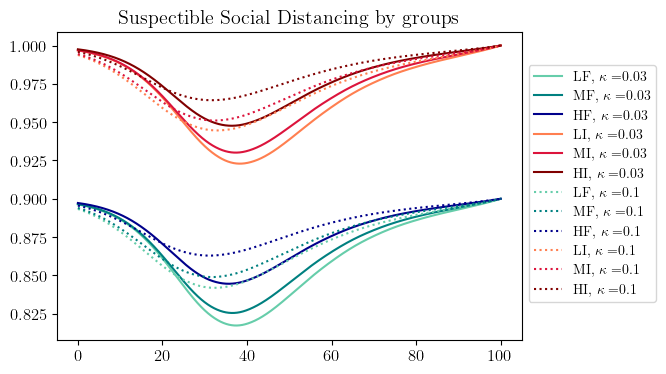

In [1511]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))

for j in np.arange(n_candidates):
    for i in np.arange(6):
        alpha_S_block_i = kappa_debug[j][2][i,:]
        ax.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, $\kappa=${kappa_pool[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax.set_title("Suspectible Social Distancing by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)

title = "e2_p2"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


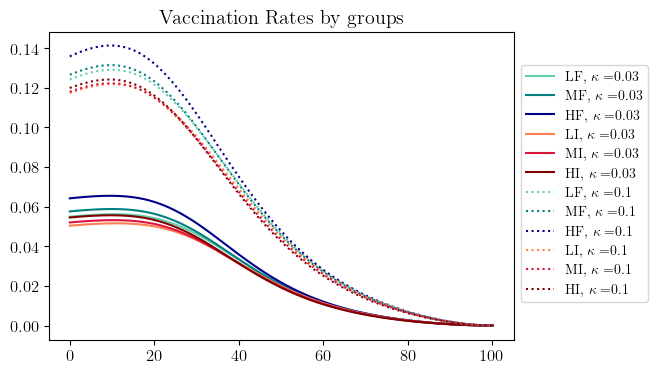

In [1512]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))

for j in np.arange(n_candidates):
    for i in np.arange(6):
        nu_block_i = kappa_debug[j][5][i,:]
        ax.plot(t_grid, nu_block_i, label = f"{block_names[i]}, $\kappa=${kappa_pool[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax.set_title("Vaccination Rates by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)

title = "e2_p3"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


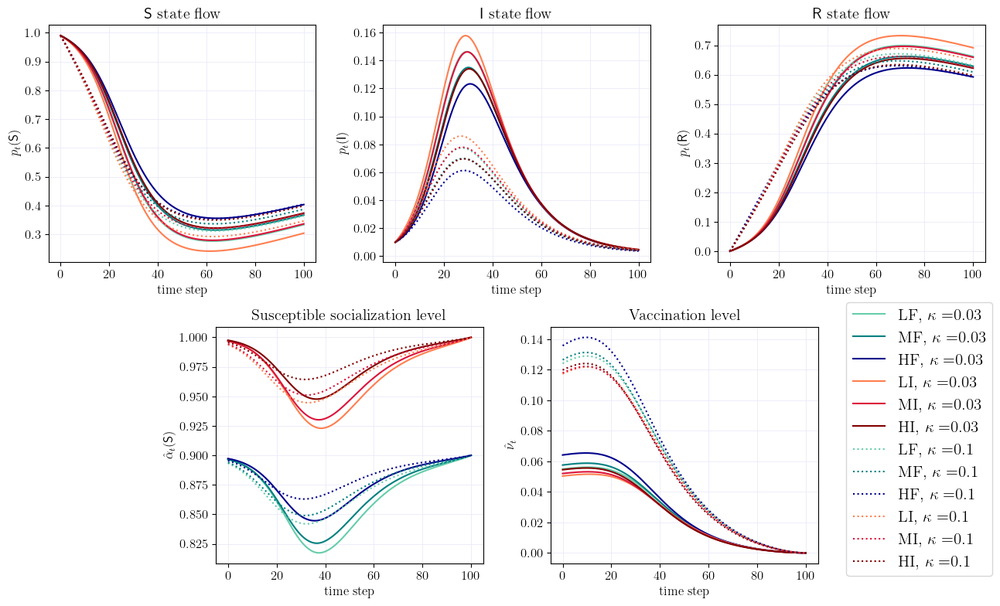

In [1513]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(13, 8))
gs = GridSpec(2, 6, figure=fig, height_ratios=[1, 1])

ax1 = fig.add_subplot(gs[0, 0:2])
ax1.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax2 = fig.add_subplot(gs[0, 2:4])
ax2.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax3 = fig.add_subplot(gs[0, 4:6])
ax3.grid(True, color='lavender', linestyle='-', linewidth=0.5)

ax4 = fig.add_subplot(gs[1, 1:3])
ax4.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax5 = fig.add_subplot(gs[1, 3:5])
ax5.grid(True, color='lavender', linestyle='-', linewidth=0.5)

for j in np.arange(n_candidates):
    for i in np.arange(6):
        p_S_block_i = kappa_debug[j][1][i,:]
        p_I_block_i = kappa_debug[j][1][6 + i,:]
        p_R_block_i = kappa_debug[j][1][12 + i,:]
        ax1.plot(t_grid, p_S_block_i, label = f"{block_names[i]}, $\kappa=${kappa_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax2.plot(t_grid, p_I_block_i, label = f"{block_names[i]}, $\kappa=${kappa_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax3.plot(t_grid, p_R_block_i, label = f"{block_names[i]}, $\kappa=${kappa_pool[j]}", c=colors[i], linestyle=line_styles[j])

ax1.set_title(r"$\mathsf{S}$ state flow")
ax1.set_xlabel('time step')
ax1.set_ylabel(r'$p_{t}(\mathsf{S})$')
ax2.set_title(r"$\mathsf{I}$ state flow")
ax2.set_xlabel('time step')
ax2.set_ylabel(r'$p_{t}(\mathsf{I})$')
ax3.set_title(r"$\mathsf{R}$ state flow")
ax3.set_xlabel('time step')
ax3.set_ylabel(r'$p_{t}(\mathsf{R})$')

for j in np.arange(n_candidates):
    for i in np.arange(6):
        alpha_S_block_i = kappa_debug[j][2][i,:]
        ax4.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, $\kappa=${kappa_pool[j]}", c=colors[i], linestyle=line_styles[j])

for j in np.arange(n_candidates):
    for i in np.arange(6):
        nu_block_i = kappa_debug[j][5][i,:]
        ax5.plot(t_grid, nu_block_i, label = f"{block_names[i]}, $\kappa=${kappa_pool[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")

ax4.set_ylabel(r'$\hat{\alpha}_t(\mathsf{S})$')
ax4.set_title("Susceptible socialization level")
ax4.set_xlabel('time step')
# ax[0].set_ylabel('proportion')
ax5.set_title("Vaccination level")
ax5.set_xlabel('time step')
ax5.set_ylabel(r'$\hat{\nu}_t$')

handles, labels = ax1.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.84, 0.28),
           frameon=True,
           fontsize=15)


plt.tight_layout(h_pad=1.0)
title = "supp_kappa"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')
plt.show()

### G3: Sensitivity analysis on $\xi_{\mathrm{I}}$

In [1514]:
xi_debug = {}

lambda_s_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_i_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_r_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_duration = np.zeros(0)
kappa = np.array([0.03, 0.03, 0.03, 0.03, 0.03, 0.03])

# block_names = ['LF', 'MF', 'HF', 'LI', 'MI', 'HI']
# colors = ['teal', 'forestgreen', 'olive', 'darkblue', 'coral', 'maroon']
# state_names = ['S', 'I', 'R']
# policy_names = ['mild', 'harsh', 'adaptive']
# line_styles = ["-", ":", "--"]

In [1515]:
xi_i = 0.97

xi_debug[0] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  45.10239253946166 u conv: 1588.0928125140915
iter:  10 p conv:  0.8379413840109882 u conv: 9.32268298986906
iter:  20 p conv:  0.0008195564047341369 u conv: 0.02007259540929142
iter:  30 p conv:  1.982213586073193e-07 u conv: 2.4061124740224128e-06


In [1516]:
xi_i = 0.9

xi_debug[1] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  43.55020419254192 u conv: 1586.1799036833281
iter:  10 p conv:  0.9558124285102092 u conv: 8.113971173362502
iter:  20 p conv:  0.001148141061923551 u conv: 0.019119539320295278
iter:  30 p conv:  8.871718624670585e-07 u conv: 8.671353381594722e-06


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


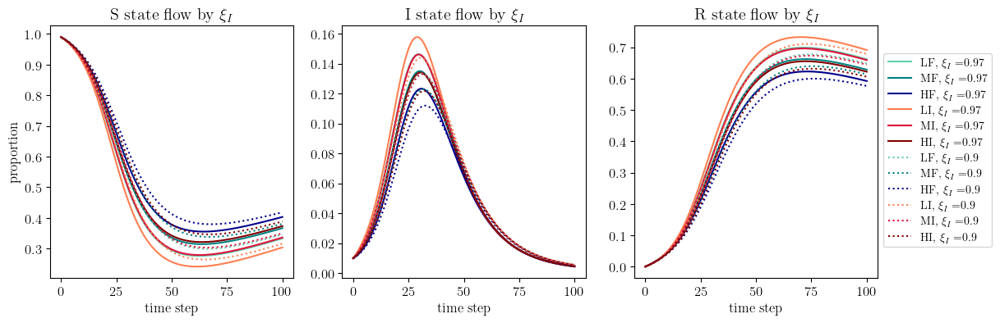

In [1517]:
xi_pool = [0.97, 0.9] # [0.9, 0.95, 0.97]
fig, ax= plt.subplots(1, 3, figsize=(13, 4))
n_candidates = len(xi_debug)

for j in np.arange(n_candidates):
    for i in np.arange(6):
        p_S_block_i = xi_debug[j][1][i,:]
        p_I_block_i = xi_debug[j][1][6 + i,:]
        p_R_block_i = xi_debug[j][1][12 + i,:]
        ax[0].plot(t_grid, p_S_block_i, label = f"{block_names[i]}, $\\xi_I=${xi_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax[1].plot(t_grid, p_I_block_i, label = f"{block_names[i]}, $\\xi_I=${xi_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax[2].plot(t_grid, p_R_block_i, label = f"{block_names[i]}, $\\xi_I=${xi_pool[j]}", c=colors[i], linestyle=line_styles[j])
ax[0].set_title(r"S state flow by $\xi_I$")
ax[0].set_xlabel('time step')
ax[0].set_ylabel('proportion')
ax[1].set_title(r"I state flow by $\xi_I$")
ax[1].set_xlabel('time step')
# ax[1].set_ylabel('proportion')
ax[2].set_title(r"R state flow by $\xi_I$")
ax[2].set_xlabel('time step')
# ax[2].set_ylabel('proportion')

handles, labels = ax[0].get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)

title = "e3_p1"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


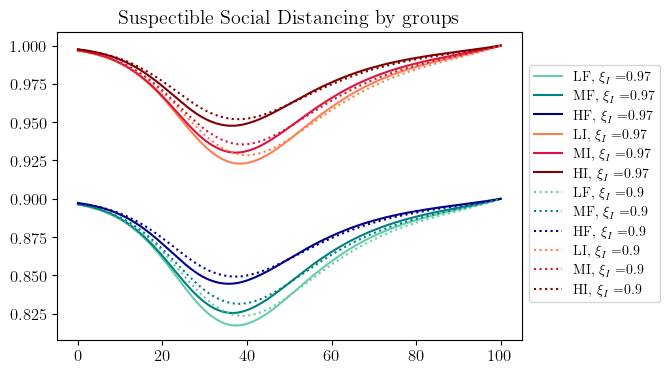

In [1518]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))

for j in np.arange(n_candidates):
    for i in np.arange(6):
        alpha_S_block_i = xi_debug[j][2][i,:]
        ax.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, $\\xi_I=${xi_pool[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax.set_title("Suspectible Social Distancing by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)

title = "e3_p2"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

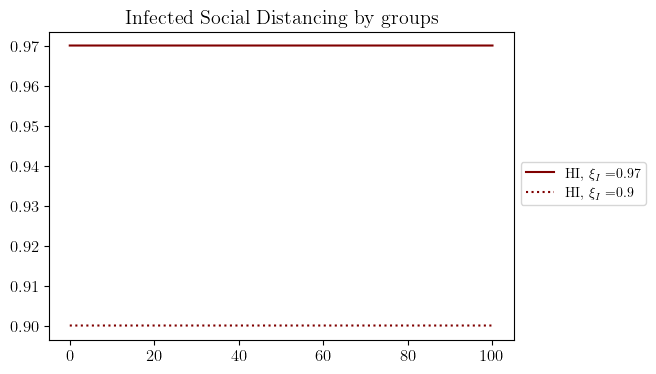

In [1519]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))

for j in np.arange(n_candidates):
    for i in np.arange(5,6):
        alpha_S_block_i = xi_debug[j][3][i,:]
        ax.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, $\\xi_I=${xi_pool[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax.set_title("Infected Social Distancing by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


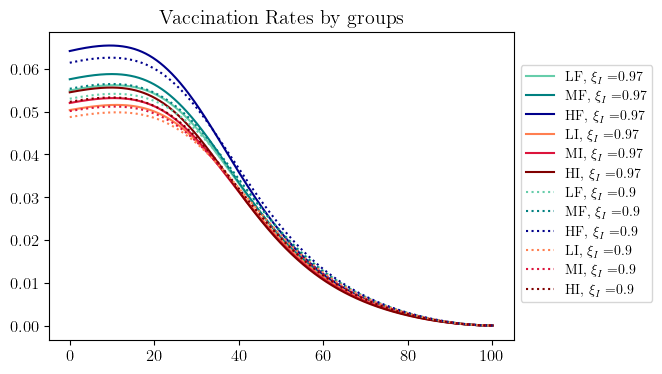

In [1520]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))

for j in np.arange(n_candidates):
    for i in np.arange(6):
        nu_block_i = xi_debug[j][5][i,:]
        ax.plot(t_grid, nu_block_i, label = f"{block_names[i]}, $\\xi_I=${xi_pool[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax.set_title("Vaccination Rates by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)

title = "e3_p3"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


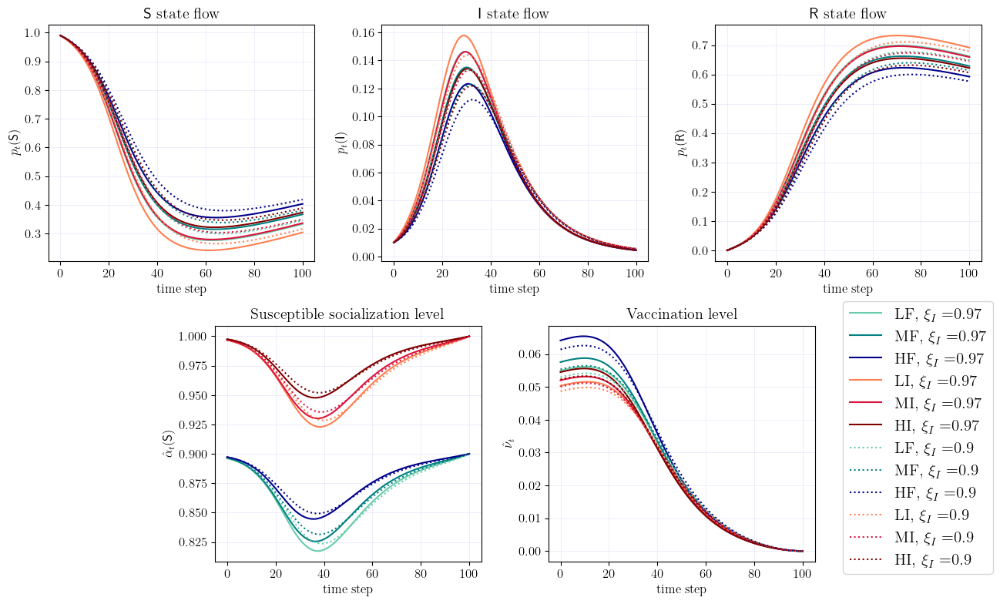

In [1521]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(13, 8))
gs = GridSpec(2, 6, figure=fig, height_ratios=[1, 1])

ax1 = fig.add_subplot(gs[0, 0:2])
ax1.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax2 = fig.add_subplot(gs[0, 2:4])
ax2.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax3 = fig.add_subplot(gs[0, 4:6])
ax3.grid(True, color='lavender', linestyle='-', linewidth=0.5)

ax4 = fig.add_subplot(gs[1, 1:3])
ax4.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax5 = fig.add_subplot(gs[1, 3:5])
ax5.grid(True, color='lavender', linestyle='-', linewidth=0.5)

for j in np.arange(n_candidates):
    for i in np.arange(6):
        p_S_block_i = xi_debug[j][1][i,:]
        p_I_block_i = xi_debug[j][1][6 + i,:]
        p_R_block_i = xi_debug[j][1][12 + i,:]
        ax1.plot(t_grid, p_S_block_i, label = f"{block_names[i]}, $\\xi_I=${xi_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax2.plot(t_grid, p_I_block_i, label = f"{block_names[i]}, $\\xi_I=${xi_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax3.plot(t_grid, p_R_block_i, label = f"{block_names[i]}, $\\xi_I=${xi_pool[j]}", c=colors[i], linestyle=line_styles[j])

ax1.set_title(r"$\mathsf{S}$ state flow")
ax1.set_xlabel('time step')
ax1.set_ylabel(r'$p_{t}(\mathsf{S})$')
ax2.set_title(r"$\mathsf{I}$ state flow")
ax2.set_xlabel('time step')
ax2.set_ylabel(r'$p_{t}(\mathsf{I})$')
ax3.set_title(r"$\mathsf{R}$ state flow")
ax3.set_xlabel('time step')
ax3.set_ylabel(r'$p_{t}(\mathsf{R})$')

for j in np.arange(n_candidates):
    for i in np.arange(6):
        alpha_S_block_i = xi_debug[j][2][i,:]
        ax4.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, $\\xi_I=${xi_pool[j]}", c=colors[i], linestyle=line_styles[j])

for j in np.arange(n_candidates):
    for i in np.arange(6):
        nu_block_i = xi_debug[j][5][i,:]
        ax5.plot(t_grid, nu_block_i, label = f"{block_names[i]}, $\\xi_I=${xi_pool[j]}", c=colors[i], linestyle=line_styles[j])

ax4.set_ylabel(r'$\hat{\alpha}_t(\mathsf{S})$')
ax4.set_title("Susceptible socialization level")
ax4.set_xlabel('time step')
# ax[0].set_ylabel('proportion')
ax5.set_title("Vaccination level")
ax5.set_xlabel('time step')
ax5.set_ylabel(r'$\hat{\nu}_t$')

handles, labels = ax1.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.84, 0.28),
           frameon=True,
           fontsize=15)


plt.tight_layout(h_pad=1.0)
title = "supp_xi"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')
plt.show()

### G4: Sensitivity analysis on vaccination cost $c_{\nu}$

In [1522]:
cnu_debug = {}

lambda_s_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_i_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_r_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_duration = np.zeros(0)
xi_i = 0.97

In [1523]:
# base
# c_nu = np.array([1.2, 1., 0.5, 1.2, 1., 0.5])
c_nu = np.array([1.4, 1.2, 0.8, 1.6, 1.4, 1.0])

cnu_debug[0] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  45.10239253946166 u conv: 1588.0928125140915
iter:  10 p conv:  0.8379413840109882 u conv: 9.32268298986906
iter:  20 p conv:  0.0008195564047341369 u conv: 0.02007259540929142
iter:  30 p conv:  1.982213586073193e-07 u conv: 2.4061124740224128e-06


In [1524]:
# very low for everyone
c_nu = np.array([0.1, 0.1, 0.1, 0.1, 0.1, 0.1])

cnu_debug[1] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  45.10239253946166 u conv: 1588.0928125140915
iter:  10 p conv:  0.13272536679564934 u conv: 1.3133277032809785
iter:  20 p conv:  0.00021715107771583516 u conv: 0.0026897411807247566
iter:  30 p conv:  5.963710109262386e-07 u conv: 7.037879586819705e-06


In [1525]:
# low for everyone
c_nu = np.array([0.8, 0.8, 0.8, 0.8, 0.8, 0.8])

cnu_debug[2] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  45.10239253946166 u conv: 1588.0928125140915
iter:  10 p conv:  0.758308465607934 u conv: 8.288940021272296
iter:  20 p conv:  0.0006174919507547322 u conv: 0.01356617574450694
iter:  30 p conv:  1.8866694987065527e-07 u conv: 1.1426988298488274e-06


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


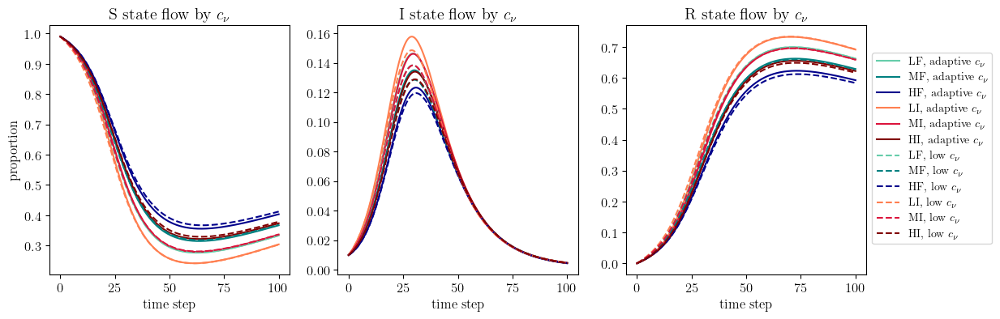

In [1526]:
cnu_pool = [r"adaptive $c_{\nu}$", r"middle $c_{\nu}$", r"low $c_{\nu}$"]
fig, ax= plt.subplots(1, 3, figsize=(13, 4))
n_candidates = len(cnu_debug)

for j in [0,2]:
    for i in np.arange(6):
        p_S_block_i = cnu_debug[j][1][i,:]
        p_I_block_i = cnu_debug[j][1][6 + i,:]
        p_R_block_i = cnu_debug[j][1][12 + i,:]
        ax[0].plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {cnu_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax[1].plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {cnu_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax[2].plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {cnu_pool[j]}", c=colors[i], linestyle=line_styles[j])
ax[0].set_title(r"S state flow by $c_{\nu}$")
ax[0].set_xlabel('time step')
ax[0].set_ylabel('proportion')
ax[1].set_title(r"I state flow by $c_{\nu}$")
ax[1].set_xlabel('time step')
# ax[1].set_ylabel('proportion')
ax[2].set_title(r"R state flow by $c_{\nu}$")
ax[2].set_xlabel('time step')
# ax[2].set_ylabel('proportion')

handles, labels = ax[0].get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)

title = "e4_p1"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


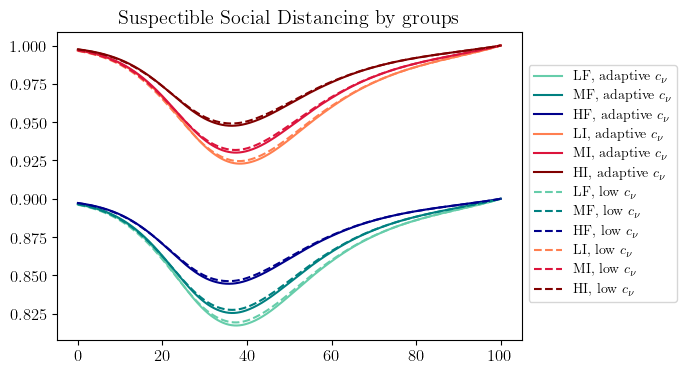

In [1527]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))

for j in [0,2]:
    for i in np.arange(6):
        alpha_S_block_i = cnu_debug[j][2][i,:]
        ax.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {cnu_pool[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax.set_title("Suspectible Social Distancing by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)

title = "e4_p2"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


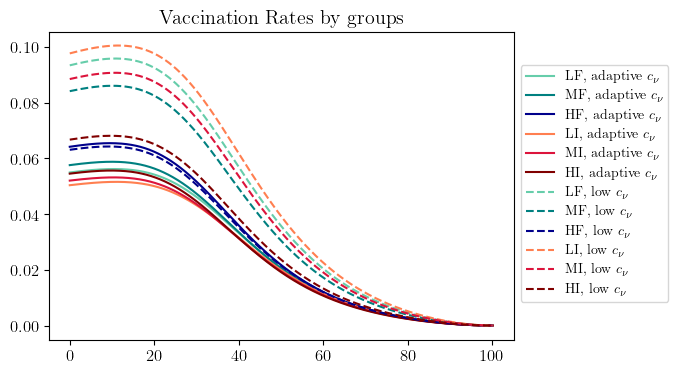

In [1528]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))

for j in [0,2]:
    for i in np.arange(6):
        nu_block_i = cnu_debug[j][5][i,:]
        ax.plot(t_grid, nu_block_i, label = f"{block_names[i]}, {cnu_pool[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax.set_title("Vaccination Rates by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)

title = "e4_p3"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


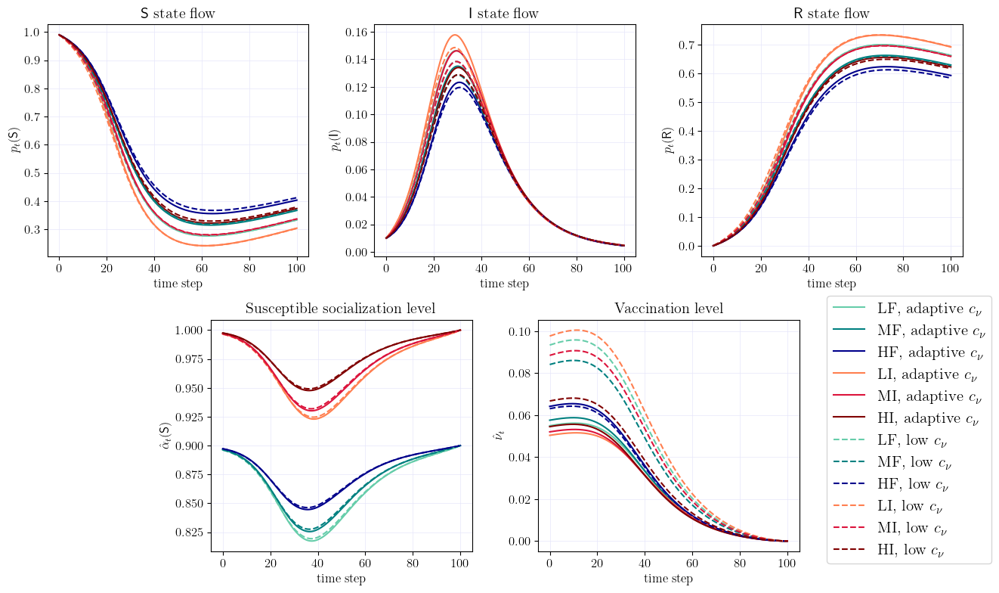

In [1529]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(13, 8))
gs = GridSpec(2, 6, figure=fig, height_ratios=[1, 1])

ax1 = fig.add_subplot(gs[0, 0:2])
ax1.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax2 = fig.add_subplot(gs[0, 2:4])
ax2.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax3 = fig.add_subplot(gs[0, 4:6])
ax3.grid(True, color='lavender', linestyle='-', linewidth=0.5)

ax4 = fig.add_subplot(gs[1, 1:3])
ax4.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax5 = fig.add_subplot(gs[1, 3:5])
ax5.grid(True, color='lavender', linestyle='-', linewidth=0.5)

for j in [0,2]:
    for i in np.arange(6):
        p_S_block_i = cnu_debug[j][1][i,:]
        p_I_block_i = cnu_debug[j][1][6 + i,:]
        p_R_block_i = cnu_debug[j][1][12 + i,:]
        ax1.plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {cnu_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax2.plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {cnu_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax3.plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {cnu_pool[j]}", c=colors[i], linestyle=line_styles[j])
ax1.set_title(r"$\mathsf{S}$ state flow")
ax1.set_xlabel('time step')
ax1.set_ylabel(r'$p_{t}(\mathsf{S})$')
ax2.set_title(r"$\mathsf{I}$ state flow")
ax2.set_xlabel('time step')
ax2.set_ylabel(r'$p_{t}(\mathsf{I})$')
ax3.set_title(r"$\mathsf{R}$ state flow")
ax3.set_xlabel('time step')
ax3.set_ylabel(r'$p_{t}(\mathsf{R})$')

for j in [0,2]:
    for i in np.arange(6):
        alpha_S_block_i = cnu_debug[j][2][i,:]
        ax4.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {cnu_pool[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
# ax4.set_title("Suspectible Social Distancing by groups")

for j in [0,2]:
    for i in np.arange(6):
        nu_block_i = cnu_debug[j][5][i,:]
        ax5.plot(t_grid, nu_block_i, label = f"{block_names[i]}, {cnu_pool[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax4.set_ylabel(r'$\hat{\alpha}_t(\mathsf{S})$')
ax4.set_title("Susceptible socialization level")
ax4.set_xlabel('time step')
# ax[0].set_ylabel('proportion')
ax5.set_title("Vaccination level")
ax5.set_xlabel('time step')
ax5.set_ylabel(r'$\hat{\nu}_t$')

handles, labels = ax1.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.84, 0.28),
           frameon=True,
           fontsize=15)


plt.tight_layout(h_pad=1.0)
title = "official_a3"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


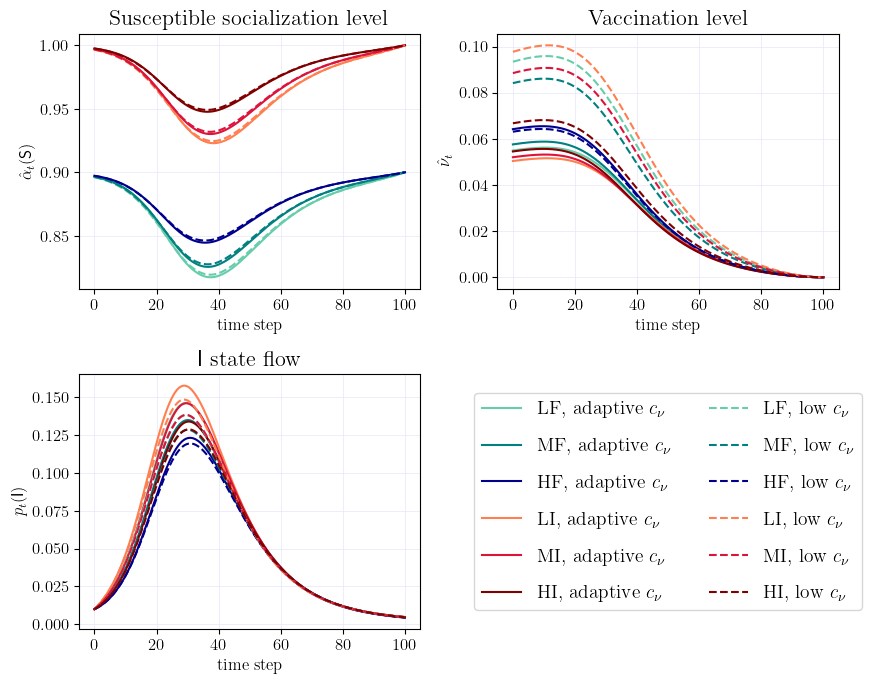

In [1531]:
fig, ax = plt.subplots(2, 2, figsize=(9, 7))

ax[0,0].grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax[0,1].grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax[1,0].grid(True, color='lavender', linestyle='-', linewidth=0.5)

for j in [0,2]:
    for i in np.arange(6):
        p_S_block_i = cnu_debug[j][1][i,:]
        p_I_block_i = cnu_debug[j][1][6 + i,:]
        p_R_block_i = cnu_debug[j][1][12 + i,:]
        # ax1.plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {cnu_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax[1,0].plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {cnu_pool[j]}", c=colors[i], linestyle=line_styles[j])
        # ax3.plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {cnu_pool[j]}", c=colors[i], linestyle=line_styles[j])
ax[1,0].set_title(r"$\mathsf{I}$ state flow", fontsize=16)
ax[1,0].set_xlabel('time step')
ax[1,0].set_ylabel(r'$p_{t}(\mathsf{I})$')


for j in [0,2]:
    for i in np.arange(6):
        alpha_S_block_i = cnu_debug[j][2][i,:]
        ax[0,0].plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {cnu_pool[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
# ax4.set_title("Suspectible Social Distancing by groups")

for j in [0,2]:
    for i in np.arange(6):
        nu_block_i = cnu_debug[j][5][i,:]
        ax[0,1].plot(t_grid, nu_block_i, label = f"{block_names[i]}, {cnu_pool[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax[0,0].set_ylabel(r'$\hat{\alpha}_t(\mathsf{S})$')
ax[0,0].set_title("Susceptible socialization level", fontsize=16)
ax[0,0].set_xlabel('time step')
# ax[0].set_ylabel('proportion')
ax[0,1].set_title("Vaccination level", fontsize=16)
ax[0,1].set_xlabel('time step')
ax[0,1].set_ylabel(r'$\hat{\nu}_t$')

handles, labels = ax[0,0].get_legend_handles_labels()

ax[1, 1].axis('off')

ax[1, 1].legend(handles, labels,
                loc='center',
                frameon=True,
                fontsize=14,
                ncol=2,
                labelspacing=1.0)


plt.tight_layout(h_pad=1.0)
title = "official_a3_nov26"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')
plt.show()

In [1532]:
for i in range(n_blocks):
    p_I_block_i_adaptive_cnu = cnu_debug[0][1][6 + i,:]
    p_I_block_i_low_cnu = cnu_debug[2][1][6 + i,:]
    p_diff = (p_I_block_i_adaptive_cnu - p_I_block_i_low_cnu)[np.argmax(p_I_block_i_adaptive_cnu - p_I_block_i_low_cnu)]
    print(f'{block_names[i]} max infection difference: {p_diff}')

LF max infection difference: 0.007922256742409234
MF max infection difference: 0.006441252247220225
HF max infection difference: 0.0037875353029828973
LI max infection difference: 0.009236255557250966
MI max infection difference: 0.007762815344858065
HI max infection difference: 0.005184509146865468


In [1533]:
for i in range(n_blocks):
    p_I_block_i_adaptive_cnu = cnu_debug[0][1][6 + i,:]
    p_I_block_i_low_cnu = cnu_debug[2][1][6 + i,:]
    p_diff = np.max(p_I_block_i_adaptive_cnu) - np.max(p_I_block_i_low_cnu)# (p_I_block_i_adaptive_cnu - p_I_block_i_low_cnu)[np.argmax(p_I_block_i_adaptive_cnu - p_I_block_i_low_cnu)]
    print(f'{block_names[i]} infection peak difference: {p_diff}')

LF infection peak difference: 0.007918975772685771
MF infection peak difference: 0.006441225429939773
HF infection peak difference: 0.003750649165346037
LI infection peak difference: 0.009227308576152171
MI infection peak difference: 0.007759987847909877
HI infection peak difference: 0.0051746382806432956


In [1534]:
p_I_block_i_adaptive_cnu_HF = cnu_debug[0][1][6 + 2,:]
p_I_block_i_adaptive_cnu_LI = cnu_debug[0][1][6 + 3,:]
p_I_block_i_low_cnu_HF = cnu_debug[2][1][6 + 2,:]
p_I_block_i_low_cnu_LI = cnu_debug[2][1][6 + 3,:]

p_diff_cnu_1 = (p_I_block_i_adaptive_cnu_LI - p_I_block_i_adaptive_cnu_HF)[np.argmax(p_I_block_i_adaptive_cnu_LI - p_I_block_i_adaptive_cnu_HF)]
p_diff_cnu_2 = (p_I_block_i_low_cnu_LI - p_I_block_i_low_cnu_HF)[np.argmax(p_I_block_i_low_cnu_LI - p_I_block_i_low_cnu_HF)]
print(f"LI-HF Gap of p(I) under adaptive c_nu: {p_diff_cnu_1}")
print(f"LI-HF Gap of p(I) under low c_nu: {p_diff_cnu_2}")

LI-HF Gap of p(I) under adaptive c_nu: 0.038597398130997176
LI-HF Gap of p(I) under low c_nu: 0.033721209884608694


In [1535]:
for i in range(n_blocks):
    nu_block_i_adaptive_cnu = cnu_debug[0][5][i,:]
    nu_block_i_low_cnu = cnu_debug[2][5][i,:]
    nu_diff = (np.max(nu_block_i_low_cnu) - np.max(nu_block_i_adaptive_cnu)) / np.max(nu_block_i_adaptive_cnu) # (nu_block_i_low_cnu - nu_block_i_adaptive_cnu)[np.argmax(nu_block_i_low_cnu - nu_block_i_adaptive_cnu)]
    print(f'{block_names[i]} vax peak difference: {nu_diff}, increase by {np.max(nu_block_i_low_cnu) - np.max(nu_block_i_adaptive_cnu)}')

LF vax peak difference: 0.7060442358766268, increase by 0.03966772812748948
MF vax peak difference: 0.4640706262735402, increase by 0.027282491608701963
HF vax peak difference: -0.018271184243894262, increase by -0.0011961239173266525
LI vax peak difference: 0.9489607619374423, increase by 0.04894544839591674
MI vax peak difference: 0.7063511794522681, increase by 0.03756042884697464
HI vax peak difference: 0.22422707268465256, increase by 0.012475235116015851


In [1536]:
nu_block_i_adaptive_cnu_HF = cnu_debug[0][5][2,:]
nu_block_i_adaptive_cnu_LI = cnu_debug[0][5][3,:]
nu_block_i_low_cnu_HF = cnu_debug[2][5][2,:]
nu_block_i_low_cnu_LI = cnu_debug[2][5][3,:]

nu_diff_cnu_1 = (nu_block_i_adaptive_cnu_HF - nu_block_i_adaptive_cnu_LI)[np.argmax(nu_block_i_adaptive_cnu_HF - nu_block_i_adaptive_cnu_LI)]
nu_diff_cnu_2 = (nu_block_i_low_cnu_LI - nu_block_i_low_cnu_HF)[np.argmax(nu_block_i_low_cnu_LI - nu_block_i_low_cnu_HF)]
print(f"LI-HF NU Gap under adaptive c_nu: {nu_diff_cnu_1}")
print(f"LI-HF NU Gap under low c_nu: {nu_diff_cnu_2}")

LI-HF NU Gap under adaptive c_nu: 0.013977683822011387
LI-HF NU Gap under low c_nu: 0.036674705405604274


### G5: Sensitivity Analysis on treatment cost $c_I$

In [1537]:
cinf_debug = {}

lambda_s_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_i_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_r_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_duration = np.zeros(0)
c_nu = np.array([1.4, 1.2, 0.8, 1.6, 1.4, 1.0]) #np.array([1.2, 1., 0.5, 1.2, 1., 0.5])

In [1538]:
# base
c_inf = np.array([1.05, 1, 0.8, 1.05, 1, 0.8]) # np.array([1.2, 1., 0.6, 1.2, 1., 0.6])

cinf_debug[0] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  45.10239253946166 u conv: 1588.0928125140915
iter:  10 p conv:  0.8379413840109882 u conv: 9.32268298986906
iter:  20 p conv:  0.0008195564047341369 u conv: 0.02007259540929142
iter:  30 p conv:  1.982213586073193e-07 u conv: 2.4061124740224128e-06


In [1540]:
# low for everyone
c_inf =  np.array([0.8, 0.8, 0.8, 0.8, 0.8, 0.8])

cinf_debug[1] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  45.10239253946166 u conv: 1327.824497034594
iter:  10 p conv:  0.8655847811950546 u conv: 7.982858865892806
iter:  20 p conv:  0.0008140967159785604 u conv: 0.016638231584684738
iter:  30 p conv:  1.7904457845525668e-07 u conv: 1.6310786493239667e-06


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


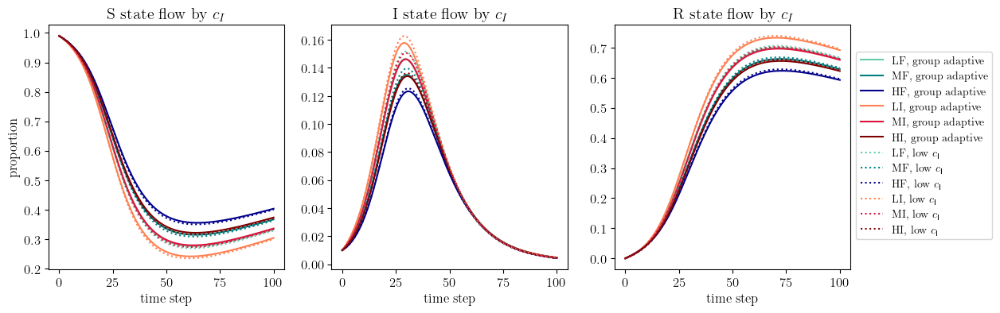

In [1541]:
cinf_pool = ["group adaptive", r"low $c_{\mathsf{I}}$"]
fig, ax= plt.subplots(1, 3, figsize=(13, 4))
n_candidates = len(cinf_debug)

for j in np.arange(n_candidates):
    for i in np.arange(6):
        p_S_block_i = cinf_debug[j][1][i,:]
        p_I_block_i = cinf_debug[j][1][6 + i,:]
        p_R_block_i = cinf_debug[j][1][12 + i,:]
        ax[0].plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {cinf_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax[1].plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {cinf_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax[2].plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {cinf_pool[j]}", c=colors[i], linestyle=line_styles[j])
ax[0].set_title(r"S state flow by $c_I$")
ax[0].set_xlabel('time step')
ax[0].set_ylabel('proportion')
ax[1].set_title(r"I state flow by $c_I$")
ax[1].set_xlabel('time step')
# ax[1].set_ylabel('proportion')
ax[2].set_title(r"R state flow by $c_I$")
ax[2].set_xlabel('time step')
# ax[2].set_ylabel('proportion')

handles, labels = ax[0].get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)

title = "e5_p1"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


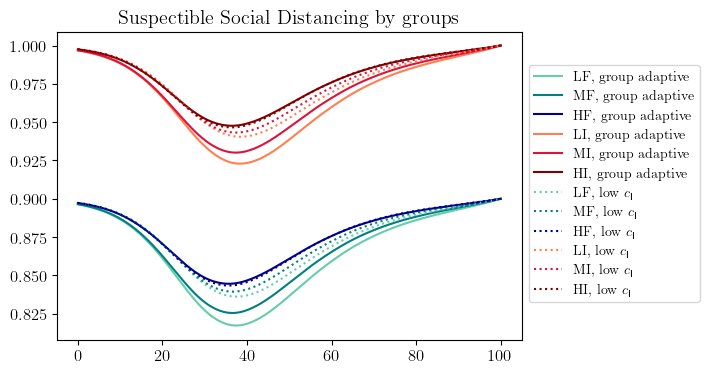

In [1542]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))

for j in np.arange(n_candidates):
    for i in np.arange(6):
        alpha_S_block_i = cinf_debug[j][2][i,:]
        ax.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {cinf_pool[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax.set_title("Suspectible Social Distancing by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)

title = "e5_p2"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


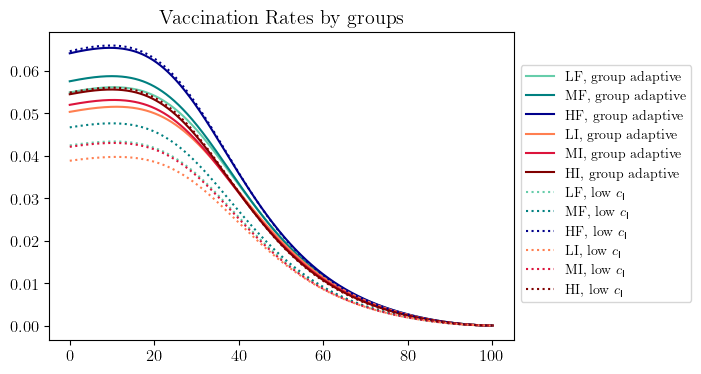

In [1543]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))

for j in np.arange(n_candidates):
    for i in np.arange(6):
        nu_block_i = cinf_debug[j][5][i,:]
        ax.plot(t_grid, nu_block_i, label = f"{block_names[i]}, {cinf_pool[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax.set_title("Vaccination Rates by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)

title = "e5_p3"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


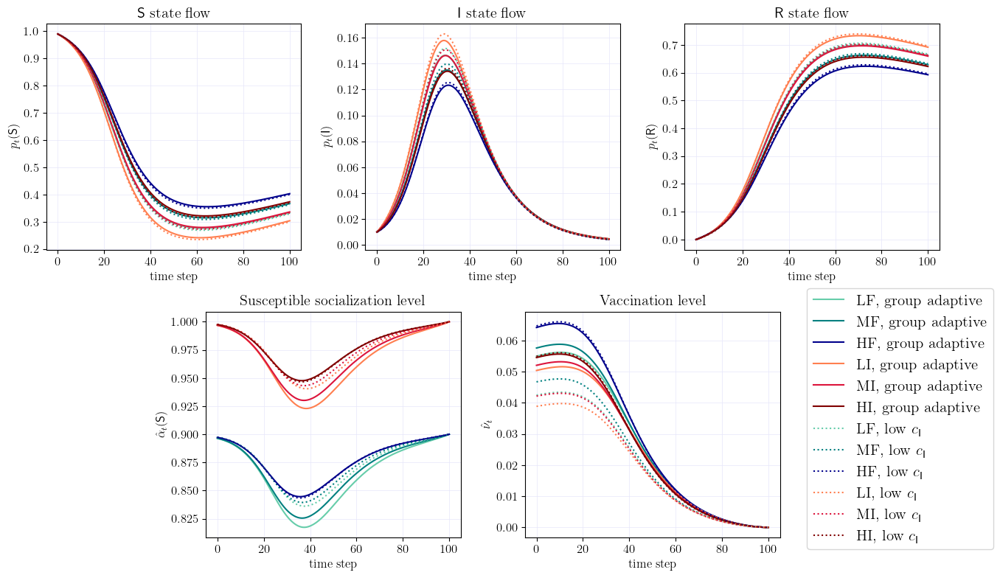

In [1544]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(13, 8))
gs = GridSpec(2, 6, figure=fig, height_ratios=[1, 1])

ax1 = fig.add_subplot(gs[0, 0:2])
ax1.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax2 = fig.add_subplot(gs[0, 2:4])
ax2.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax3 = fig.add_subplot(gs[0, 4:6])
ax3.grid(True, color='lavender', linestyle='-', linewidth=0.5)

ax4 = fig.add_subplot(gs[1, 1:3])
ax4.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax5 = fig.add_subplot(gs[1, 3:5])
ax5.grid(True, color='lavender', linestyle='-', linewidth=0.5)

for j in np.arange(n_candidates):
    for i in np.arange(6):
        p_S_block_i = cinf_debug[j][1][i,:]
        p_I_block_i = cinf_debug[j][1][6 + i,:]
        p_R_block_i = cinf_debug[j][1][12 + i,:]
        ax1.plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {cinf_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax2.plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {cinf_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax3.plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {cinf_pool[j]}", c=colors[i], linestyle=line_styles[j])
ax1.set_title(r"$\mathsf{S}$ state flow")
ax1.set_xlabel('time step')
ax1.set_ylabel(r'$p_{t}(\mathsf{S})$')
ax2.set_title(r"$\mathsf{I}$ state flow")
ax2.set_xlabel('time step')
ax2.set_ylabel(r'$p_{t}(\mathsf{I})$')
ax3.set_title(r"$\mathsf{R}$ state flow")
ax3.set_xlabel('time step')
ax3.set_ylabel(r'$p_{t}(\mathsf{R})$')

for j in np.arange(n_candidates):
    for i in np.arange(6):
        alpha_S_block_i = cinf_debug[j][2][i,:]
        ax4.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {cinf_pool[j]}", c=colors[i], linestyle=line_styles[j])

for j in np.arange(n_candidates):
    for i in np.arange(6):
        nu_block_i = cinf_debug[j][5][i,:]
        ax5.plot(t_grid, nu_block_i, label = f"{block_names[i]}, {cinf_pool[j]}", c=colors[i], linestyle=line_styles[j])
ax4.set_ylabel(r'$\hat{\alpha}_t(\mathsf{S})$')
ax4.set_title("Susceptible socialization level")
ax4.set_xlabel('time step')
ax5.set_title("Vaccination level")
ax5.set_xlabel('time step')
ax5.set_ylabel(r'$\hat{\nu}_t$')

handles, labels = ax1.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.84, 0.28),
           frameon=True,
           fontsize=15)


plt.tight_layout(h_pad=1.0)
title = "supp_c_inf"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')
plt.show()

### G6: Attempt on waning rate

In [1545]:
eta_debug = {}

lambda_s_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_i_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_r_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_duration = np.zeros(0)
c_inf = np.array([1.05, 1, 0.8, 1.05, 1, 0.8]) # np.array([1.2, 1., 0.1, 1.2, 1., 0.1])

In [1546]:
eta = np.array([1/250, 1/250, 1/250, 1/250, 1/250, 1/250])

eta_debug[0] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  45.10239253946166 u conv: 1588.0928125140915
iter:  10 p conv:  0.8379413840109882 u conv: 9.32268298986906
iter:  20 p conv:  0.0008195564047341369 u conv: 0.02007259540929142
iter:  30 p conv:  1.982213586073193e-07 u conv: 2.4061124740224128e-06


In [1547]:
eta = np.array([1/100, 1/100, 1/100, 1/100, 1/100, 1/100])

eta_debug[1] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  37.78866817164187 u conv: 1613.655668482248
iter:  10 p conv:  0.9488824887850036 u conv: 11.94060593808309
iter:  20 p conv:  0.002944700120360429 u conv: 0.06767131691976527
iter:  30 p conv:  1.0554833428919698e-06 u conv: 1.0601055383854238e-05
iter:  40 p conv:  3.850473418873348e-09 u conv: 8.765126416505627e-08


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


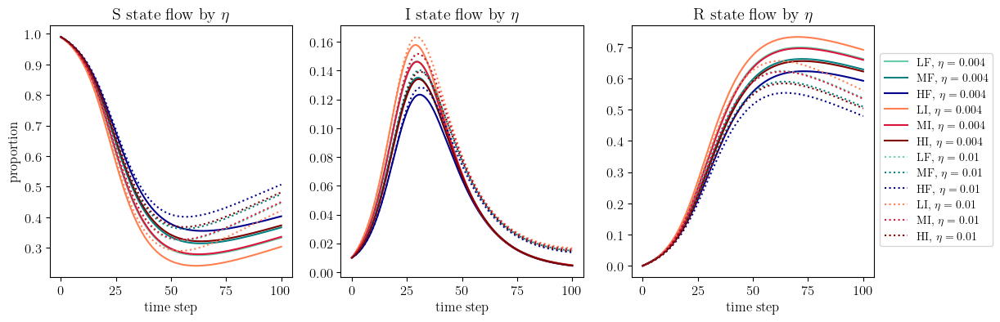

In [1548]:
eta_pool = [r"$\eta=0.004$", r"$\eta=0.01$"]
fig, ax= plt.subplots(1, 3, figsize=(13, 4))
n_candidates = len(eta_debug)

for j in np.arange(n_candidates):
    for i in np.arange(6):
        p_S_block_i = eta_debug[j][1][i,:]
        p_I_block_i = eta_debug[j][1][6 + i,:]
        p_R_block_i = eta_debug[j][1][12 + i,:]
        ax[0].plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {eta_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax[1].plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {eta_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax[2].plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {eta_pool[j]}", c=colors[i], linestyle=line_styles[j])
ax[0].set_title(f"S state flow by $\eta$")
ax[0].set_xlabel('time step')
ax[0].set_ylabel('proportion')
ax[1].set_title(f"I state flow by $\eta$")
ax[1].set_xlabel('time step')
ax[2].set_title(f"R state flow by $\eta$")
ax[2].set_xlabel('time step')

handles, labels = ax[0].get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)

title = "e6_p1"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


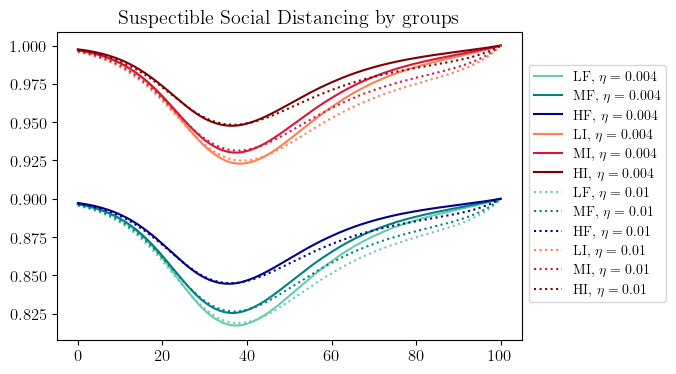

In [1549]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))

for j in np.arange(n_candidates):
    for i in np.arange(6):
        alpha_S_block_i = eta_debug[j][2][i,:]
        ax.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {eta_pool[j]}", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax.set_title("Suspectible Social Distancing by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)

title = "e6_p2"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


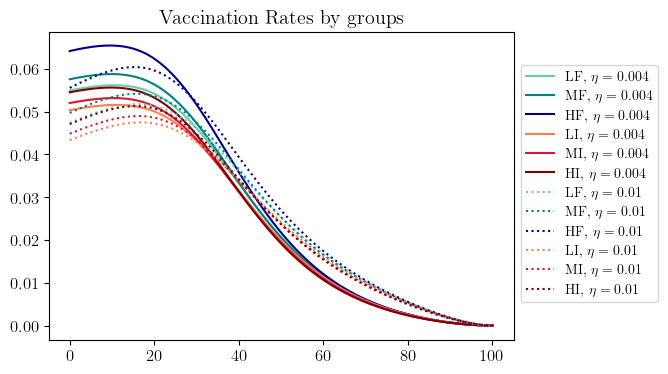

In [1550]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))

for j in np.arange(n_candidates):
    for i in np.arange(6):
        nu_block_i = eta_debug[j][5][i,:]
        ax.plot(t_grid, nu_block_i, label = f"{block_names[i]}, {eta_pool[j]}", c=colors[i], linestyle=line_styles[j])
ax.set_title("Vaccination Rates by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)

title = "e6_p3"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


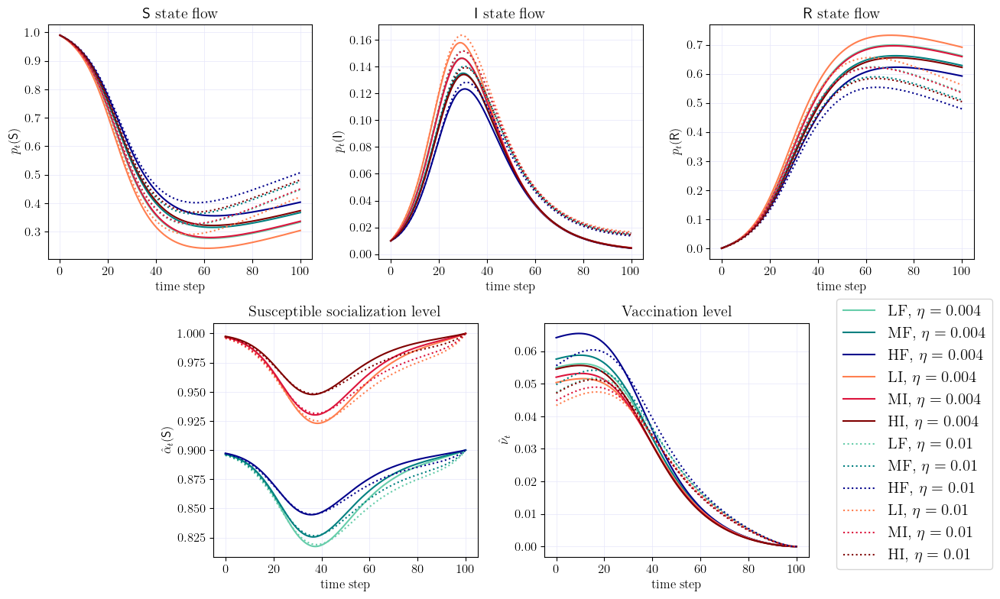

In [1551]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(13, 8))
gs = GridSpec(2, 6, figure=fig, height_ratios=[1, 1])

ax1 = fig.add_subplot(gs[0, 0:2])
ax1.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax2 = fig.add_subplot(gs[0, 2:4])
ax2.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax3 = fig.add_subplot(gs[0, 4:6])
ax3.grid(True, color='lavender', linestyle='-', linewidth=0.5)

ax4 = fig.add_subplot(gs[1, 1:3])
ax4.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax5 = fig.add_subplot(gs[1, 3:5])
ax5.grid(True, color='lavender', linestyle='-', linewidth=0.5)

for j in np.arange(n_candidates):
    for i in np.arange(6):
        p_S_block_i = eta_debug[j][1][i,:]
        p_I_block_i = eta_debug[j][1][6 + i,:]
        p_R_block_i = eta_debug[j][1][12 + i,:]
        ax1.plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {eta_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax2.plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {eta_pool[j]}", c=colors[i], linestyle=line_styles[j])
        ax3.plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {eta_pool[j]}", c=colors[i], linestyle=line_styles[j])
ax1.set_title(r"$\mathsf{S}$ state flow")
ax1.set_xlabel('time step')
ax1.set_ylabel(r'$p_{t}(\mathsf{S})$')
ax2.set_title(r"$\mathsf{I}$ state flow")
ax2.set_xlabel('time step')
ax2.set_ylabel(r'$p_{t}(\mathsf{I})$')
ax3.set_title(r"$\mathsf{R}$ state flow")
ax3.set_xlabel('time step')
ax3.set_ylabel(r'$p_{t}(\mathsf{R})$')

for j in np.arange(n_candidates):
    for i in np.arange(6):
        alpha_S_block_i = eta_debug[j][2][i,:]
        ax4.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {eta_pool[j]}", c=colors[i], linestyle=line_styles[j])

for j in np.arange(n_candidates):
    for i in np.arange(6):
        nu_block_i = eta_debug[j][5][i,:]
        ax5.plot(t_grid, nu_block_i, label = f"{block_names[i]}, {eta_pool[j]}", c=colors[i], linestyle=line_styles[j])
ax4.set_ylabel(r'$\hat{\alpha}_t(\mathsf{S})$')
ax4.set_title("Susceptible socialization level")
ax4.set_xlabel('time step')
ax5.set_title("Vaccination level")
ax5.set_xlabel('time step')
ax5.set_ylabel(r'$\hat{\nu}_t$')

handles, labels = ax1.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.84, 0.28),
           frameon=True,
           fontsize=15)


plt.tight_layout(h_pad=1.0)
title = "supp_eta"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')
plt.show()

In [1552]:
eta = np.array([1/250, 1/250, 1/250, 1/250, 1/250, 1/250])

### R1: Grid Search on $(\lambda_S, \lambda_I) \in [0,1]^2$ — Bounding $\hat{\alpha}(\mathsf{S})$ and $\hat{\nu}$

In [1414]:
import contextlib, io

# 6-block setup for R1
n_blocks = 6
n_states = 3

beta_r1      = np.array([0.4, 0.35, 0.3, 0.4, 0.35, 0.3])
kappa_r1     = np.array([0.03]*6)
gamma_r1     = np.array([1/7]*6)
eta_r1       = np.array([1/250]*6)
block_dens_r1 = [0.1473, 0.1509, 0.1859, 0.1751, 0.1655, 0.1753]
c_inf_r1     = np.array([1.05, 1.0, 0.8, 1.05, 1.0, 0.8])
c_nu_r1      = np.array([1.4, 1.2, 0.8, 1.6, 1.4, 1.0])
c_lambda_r1  = np.array([1.]*6)
xi_i_r1      = 0.97
p_0_r1       = np.array([[0.99]]*6 + [[0.01]]*6 + [[0.00]]*6)
u_T_r1       = np.zeros((n_blocks * n_states, 1))
lambda_type_r1 = 1
death_r1     = 0
c_dead_r1    = np.array([1., 1.])
rho_r1       = np.array([1.0, 1.0])
graphon_r1   = np.array([[1.0, 0.95, 0.95, 0.95, 0.9, 0.9],
                         [0.95, 1.0, 0.95, 0.9, 0.95, 0.9],
                         [0.95, 0.95, 1.0, 0.9, 0.9, 0.95],
                         [0.95, 0.9, 0.9, 1.0, 0.95, 0.95],
                         [0.9, 0.95, 0.9, 0.95, 1.0, 0.95],
                         [0.9, 0.9, 0.95, 0.95, 0.95, 1.0]])

n_grid        = 10
lambda_s_vals = np.linspace(0.1, 1.0, n_grid)
lambda_i_vals = np.linspace(0.1, 1.0, n_grid)

max_alpha_S = np.full((n_grid, n_grid), np.nan)
min_alpha_S = np.full((n_grid, n_grid), np.nan)
max_nu      = np.full((n_grid, n_grid), np.nan)
min_nu      = np.full((n_grid, n_grid), np.nan)


In [1415]:
for i_s, ls in enumerate(tqdm(lambda_s_vals, desc='grid search (lambda_S)')):
    for i_i, li in enumerate(lambda_i_vals):
        lmb_s = [ls] * n_blocks
        lmb_i = [li] * n_blocks
        lmb_r = [1.0] * n_blocks
        with contextlib.redirect_stdout(io.StringIO()):
            res = stoch_block_fixed(
                n_blocks, n_states, Nt, lmb_s, lmb_i, lmb_r,
                graphon_r1, beta_r1, kappa_r1, gamma_r1, rho_r1,
                c_lambda_r1, c_inf_r1, c_dead_r1, c_nu_r1, xi_i_r1, eta_r1,
                t_grid, T, p_0_r1, u_T_r1, n_print,
                f'r1_{i_s}_{i_i}', block_dens_r1, lambda_type_r1, None, death_r1
            )
        alpha_s_res = res[2]  # shape (n_blocks, Nt)
        nu_res      = res[5]  # shape (n_blocks, Nt)
        max_alpha_S[i_s, i_i] = np.max(alpha_s_res)
        min_alpha_S[i_s, i_i] = np.min(alpha_s_res)
        max_nu[i_s, i_i]      = np.max(nu_res)
        min_nu[i_s, i_i]      = np.min(nu_res)

print(f"alpha_S range across full grid: [{np.nanmin(min_alpha_S):.4f},  {np.nanmax(max_alpha_S):.4f}]")
print(f"nu      range across full grid: [{np.nanmin(min_nu):.6f}, {np.nanmax(max_nu):.4f}]")


grid search (lambda_S): 100%|██████████| 10/10 [01:58<00:00, 11.82s/it]

alpha_S range across full grid: [0.0734,  1.0000]
nu      range across full grid: [0.000000, 0.0740]


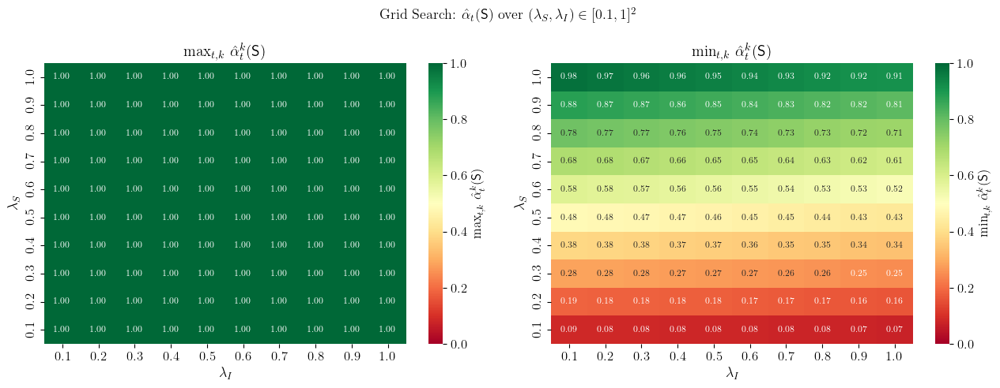

In [1416]:
x_ticks = [f'{v:.1f}' for v in lambda_i_vals]
y_ticks = [f'{v:.1f}' for v in lambda_s_vals]

fig, axes = plt.subplots(1, 2, figsize=(13, 5))

sns.heatmap(max_alpha_S, ax=axes[0],
            xticklabels=x_ticks, yticklabels=y_ticks,
            cmap='RdYlGn', vmin=0, vmax=1, annot=True, fmt='.2f', annot_kws={'size': 8},
            cbar_kws={'label': r'$\max_{t,k}\,\hat{\alpha}_t^k(\mathsf{S})$'})
axes[0].set_title(r'$\max_{t,k}\,\hat{\alpha}_t^k(\mathsf{S})$', fontsize=14)
axes[0].set_xlabel(r'$\lambda_I$', fontsize=13)
axes[0].set_ylabel(r'$\lambda_S$', fontsize=13)
axes[0].invert_yaxis()

sns.heatmap(min_alpha_S, ax=axes[1],
            xticklabels=x_ticks, yticklabels=y_ticks,
            cmap='RdYlGn', vmin=0, vmax=1, annot=True, fmt='.2f', annot_kws={'size': 8},
            cbar_kws={'label': r'$\min_{t,k}\,\hat{\alpha}_t^k(\mathsf{S})$'})
axes[1].set_title(r'$\min_{t,k}\,\hat{\alpha}_t^k(\mathsf{S})$', fontsize=14)
axes[1].set_xlabel(r'$\lambda_I$', fontsize=13)
axes[1].set_ylabel(r'$\lambda_S$', fontsize=13)
axes[1].invert_yaxis()

plt.suptitle(r'Grid Search: $\hat{\alpha}_t(\mathsf{S})$ over $(\lambda_S, \lambda_I) \in [0.1,1]^2$', fontsize=13)
plt.tight_layout()
plt.savefig('Plots/r1_alpha_S_heatmap.eps', bbox_inches='tight', format='eps')
plt.show()


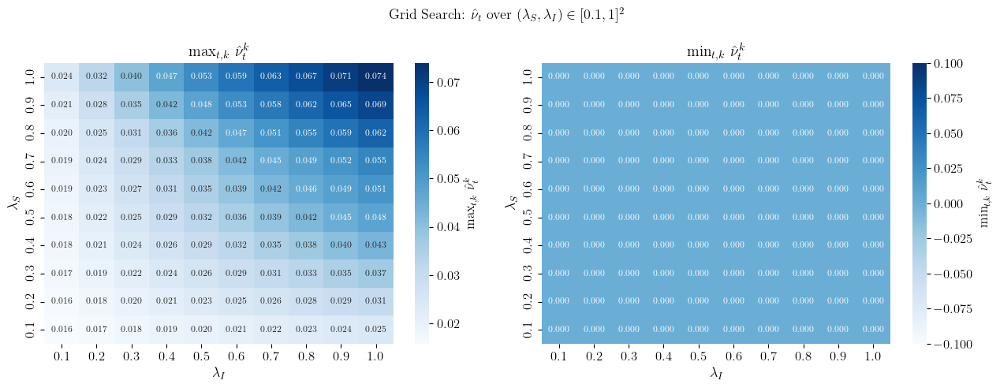

In [1417]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

sns.heatmap(max_nu, ax=axes[0],
            xticklabels=x_ticks, yticklabels=y_ticks,
            cmap='Blues', annot=True, fmt='.3f', annot_kws={'size': 8},
            cbar_kws={'label': r'$\max_{t,k}\,\hat{\nu}_t^k$'})
axes[0].set_title(r'$\max_{t,k}\,\hat{\nu}_t^k$', fontsize=14)
axes[0].set_xlabel(r'$\lambda_I$', fontsize=13)
axes[0].set_ylabel(r'$\lambda_S$', fontsize=13)
axes[0].invert_yaxis()

sns.heatmap(min_nu, ax=axes[1],
            xticklabels=x_ticks, yticklabels=y_ticks,
            cmap='Blues', annot=True, fmt='.3f', annot_kws={'size': 8},
            cbar_kws={'label': r'$\min_{t,k}\,\hat{\nu}_t^k$'})
axes[1].set_title(r'$\min_{t,k}\,\hat{\nu}_t^k$', fontsize=14)
axes[1].set_xlabel(r'$\lambda_I$', fontsize=13)
axes[1].set_ylabel(r'$\lambda_S$', fontsize=13)
axes[1].invert_yaxis()

plt.suptitle(r'Grid Search: $\hat{\nu}_t$ over $(\lambda_S, \lambda_I) \in [0.1,1]^2$', fontsize=13)
plt.tight_layout()
plt.savefig('Plots/r1_nu_heatmap.eps', bbox_inches='tight', format='eps')
plt.show()


fine grid search lambda_S: 100%|██████████| 41/41 [37:47<00:00, 55.30s/it]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


alpha_S range across fine grid: [-0.018026, 1.000000]
nu range across fine grid: [-0.000187, 0.030747]
Admissible grid points: 1530 / 1681
Non-admissible grid points: 151


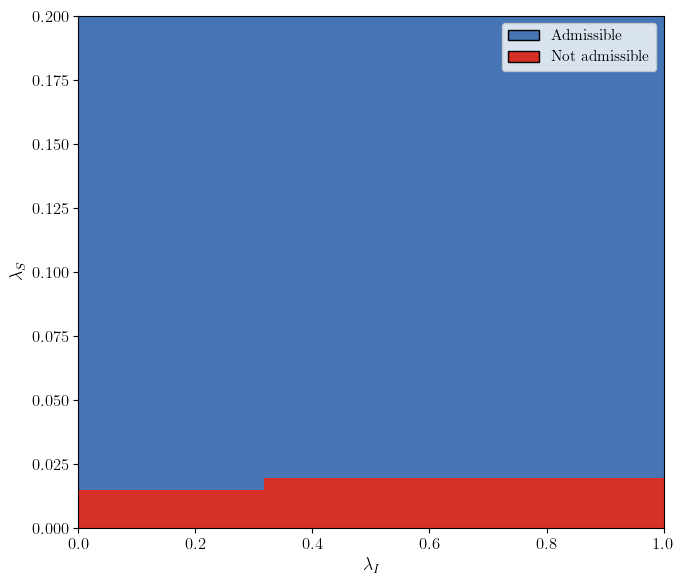

In [ ]:
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Patch

# --------------------------------------------------
# Fine grid search over (lambda_S, lambda_I)
# --------------------------------------------------
n_grid_fine = 41   # use 51 if runtime is acceptable
lambda_s_vals_fine = np.linspace(0.0, 0.2, n_grid_fine)
lambda_i_vals_fine = np.linspace(0.0, 1.0, n_grid_fine)

tol = 1e-10

min_alpha_S_fine = np.full((n_grid_fine, n_grid_fine), np.nan)
min_nu_fine      = np.full((n_grid_fine, n_grid_fine), np.nan)
max_alpha_S_fine = np.full((n_grid_fine, n_grid_fine), np.nan)
max_nu_fine      = np.full((n_grid_fine, n_grid_fine), np.nan)

admissible_mask = np.zeros((n_grid_fine, n_grid_fine), dtype=int)

for i_s, ls in enumerate(tqdm(lambda_s_vals_fine, desc="fine grid search lambda_S")):
    for i_i, li in enumerate(lambda_i_vals_fine):

        lmb_s = [ls] * n_blocks
        lmb_i = [li] * n_blocks
        lmb_r = [0.9] * n_blocks

        with contextlib.redirect_stdout(io.StringIO()):
            res = stoch_block_fixed(
                n_blocks, n_states, Nt,
                lmb_s, lmb_i, lmb_r,
                graphon_r1, beta_r1, kappa_r1, gamma_r1, rho_r1,
                c_lambda_r1, c_inf_r1, c_dead_r1, c_nu_r1, xi_i_r1, eta_r1,
                t_grid, T, p_0_r1, u_T_r1, n_print,
                f"r1_fine_{i_s}_{i_i}",
                block_dens_r1, lambda_type_r1, None, death_r1
            )

        alpha_s_res = res[2]
        nu_res      = res[5]

        min_alpha_S_fine[i_s, i_i] = np.min(alpha_s_res)
        max_alpha_S_fine[i_s, i_i] = np.max(alpha_s_res)
        min_nu_fine[i_s, i_i]      = np.min(nu_res)
        max_nu_fine[i_s, i_i]      = np.max(nu_res)

        admissible_mask[i_s, i_i] = int(
            (min_alpha_S_fine[i_s, i_i] >= -tol)
            and
            (min_nu_fine[i_s, i_i] >= -tol)
        )

print("alpha_S range across fine grid:",
      f"[{np.nanmin(min_alpha_S_fine):.6f}, {np.nanmax(max_alpha_S_fine):.6f}]")
print("nu range across fine grid:",
      f"[{np.nanmin(min_nu_fine):.6f}, {np.nanmax(max_nu_fine):.6f}]")

print("Admissible grid points:",
      np.sum(admissible_mask), "/", admissible_mask.size)

print("Non-admissible grid points:",
      admissible_mask.size - np.sum(admissible_mask))


# --------------------------------------------------
# Red/blue admissibility heatmap
# --------------------------------------------------
cmap_adm = ListedColormap(["#d73027", "#4575b4"])  # red = bad, blue = good
norm_adm = BoundaryNorm([-0.5, 0.5, 1.5], cmap_adm.N)

fig, ax = plt.subplots(1, 1, figsize=(7, 6))

im = ax.imshow(
    admissible_mask,
    origin="lower",
    aspect="auto",
    cmap=cmap_adm,
    norm=norm_adm,
    extent=[
        lambda_i_vals_fine[0], lambda_i_vals_fine[-1],
        lambda_s_vals_fine[0], lambda_s_vals_fine[-1]
    ]
)

ax.set_xlabel(r"$\lambda_I$", fontsize=13)
ax.set_ylabel(r"$\lambda_S$", fontsize=13)
# ax.set_title(
#     r"Admissibility over $(\lambda_S,\lambda_I)$: "
#     r"$\hat{\alpha}(\mathsf S)\ge 0$, $\hat{\nu}\ge 0$",
#     fontsize=13
# )

ax.grid(False)

legend_elements = [
    Patch(facecolor="#4575b4", edgecolor="black", label="Admissible"),
    Patch(facecolor="#d73027", edgecolor="black", label="Not admissible"),
]
ax.legend(handles=legend_elements, loc="upper right", frameon=True, fontsize=11)

plt.tight_layout()
plt.savefig("Plots/r1_admissible_region_lambdaS_lambdaI.eps", bbox_inches="tight", format="eps")
plt.show()

In [1419]:
# --------------------------------------------------
# Sanity check:
# 100% followers and lambda_S = lambda_I = 0
# --------------------------------------------------

# Group order: ['LF', 'MF', 'HF', 'LI', 'MI', 'HI']
follower_idx = [0, 1, 2]
indiff_idx   = [3, 4, 5]

block_dens_allF = np.zeros(n_blocks)
block_dens_allF[follower_idx] = np.asarray(block_dens_r1)[follower_idx]
block_dens_allF = block_dens_allF / block_dens_allF.sum()

lambda_s_zero = [0.0] * n_blocks
lambda_i_zero = [0.0] * n_blocks
lambda_r_zero = [0.9] * n_blocks

with contextlib.redirect_stdout(io.StringIO()):
    res_allF_zero = stoch_block_fixed(
        n_blocks, n_states, Nt,
        lambda_s_zero, lambda_i_zero, lambda_r_zero,
        graphon_r1, beta_r1, kappa_r1, gamma_r1, rho_r1,
        c_lambda_r1, c_inf_r1, c_dead_r1, c_nu_r1, xi_i_r1, eta_r1,
        t_grid, T, p_0_r1, u_T_r1, n_print,
        "r1_all_followers_lambdaS0_lambdaI0",
        block_dens_allF, lambda_type_r1, None, death_r1
    )

alpha_s_allF = res_allF_zero[2]
nu_allF      = res_allF_zero[5]

print("Follower-group max |alpha_S|:",
      np.max(np.abs(alpha_s_allF[follower_idx, :])))
print("Follower-group max |nu|:",
      np.max(np.abs(nu_allF[follower_idx, :])))

print("Follower-group alpha_S range:",
      np.min(alpha_s_allF[follower_idx, :]),
      np.max(alpha_s_allF[follower_idx, :]))

print("Follower-group nu range:",
      np.min(nu_allF[follower_idx, :]),
      np.max(nu_allF[follower_idx, :]))

# Optional strict numerical check
check_tol = 1e-6
assert np.max(np.abs(alpha_s_allF[follower_idx, :])) < check_tol
assert np.max(np.abs(nu_allF[follower_idx, :])) < check_tol

print("Sanity check passed: alpha_S and nu are numerically zero for follower groups.")

Follower-group max |alpha_S|: 0.0
Follower-group max |nu|: 0.0
Follower-group alpha_S range: 0.0 0.0
Follower-group nu range: 0.0 0.0
Sanity check passed: alpha_S and nu are numerically zero for follower groups.


### R2: Sensitivity Analysis on Follower/Indifferent Proportion

In [ ]:
import contextlib, io

# ── baseline block densities (G7 6-block setup) ──────────────────────────
n_blocks = 6
n_states = 3

# ── parameters (identical to G7 mixed-population run) ────────────────────
beta_r2     = np.array([0.4, 0.35, 0.3, 0.4, 0.35, 0.3])
kappa_r2    = np.array([0.03]*6)
gamma_r2    = np.array([1/7]*6)
eta_r2      = np.array([1/250]*6)
c_inf_r2    = np.array([1.05, 1.0, 0.8, 1.05, 1.0, 0.8])
c_nu_r2     = np.array([1.4,  1.2, 0.8,  1.6, 1.4, 1.0])
c_lambda_r2 = np.array([1.]*6)
xi_i_r2     = 0.97
graphon_r2  = np.array([[1.00, 0.95, 0.95, 0.95, 0.90, 0.90],
                          [0.95, 1.00, 0.95, 0.90, 0.95, 0.90],
                          [0.95, 0.95, 1.00, 0.90, 0.90, 0.95],
                          [0.95, 0.90, 0.90, 1.00, 0.95, 0.95],
                          [0.90, 0.95, 0.90, 0.95, 1.00, 0.95],
                          [0.90, 0.90, 0.95, 0.95, 0.95, 1.00]])
p_0_r2 = np.array([[0.99]]*6 + [[0.01]]*6 + [[0.00]]*6)
u_T_r2 = np.zeros((n_blocks * n_states, 1))

In [ ]:
_bd_f     = np.array([0.1473, 0.1509, 0.1859])   # LF, MF, HF
_bd_i     = np.array([0.1751, 0.1655, 0.1753])   # LI, MI, HI
_bd_f_tot = _bd_f.sum()
_bd_i_tot = _bd_i.sum()

def bd_r2(f):
    return list(f * _bd_f / _bd_f_tot) + list((1 - f) * _bd_i / _bd_i_tot)

higher_follower_prop =  bd_r2(0.7)
lower_follower_prop = bd_r2(0.3)

In [ ]:
prop_debug = {}

prop_debug[0] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

prop_debug[1] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  lower_follower_prop, lambda_type, lambda_duration, death)

prop_debug[2] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  higher_follower_prop, lambda_type, lambda_duration, death)

iter:  0 p conv:  45.10239253946166 u conv: 1588.0928125140915
iter:  10 p conv:  0.8379413840109882 u conv: 9.32268298986906
iter:  20 p conv:  0.0008195564047341369 u conv: 0.02007259540929142
iter:  30 p conv:  1.982213586073193e-07 u conv: 2.4061124740224128e-06
iter:  0 p conv:  45.69068306338307 u conv: 1588.8239817975095
iter:  10 p conv:  0.7521157073336688 u conv: 10.114039731360862
iter:  20 p conv:  0.0007414594486943422 u conv: 0.018492520465311357
iter:  30 p conv:  5.022251937139491e-07 u conv: 8.86260755853046e-06
iter:  0 p conv:  44.41338979205653 u conv: 1587.242876139392
iter:  10 p conv:  0.9455654494374996 u conv: 8.211964328918386
iter:  20 p conv:  0.0011264308871837268 u conv: 0.019529307282246985
iter:  30 p conv:  8.33958013274814e-07 u conv: 8.674486544693884e-06


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


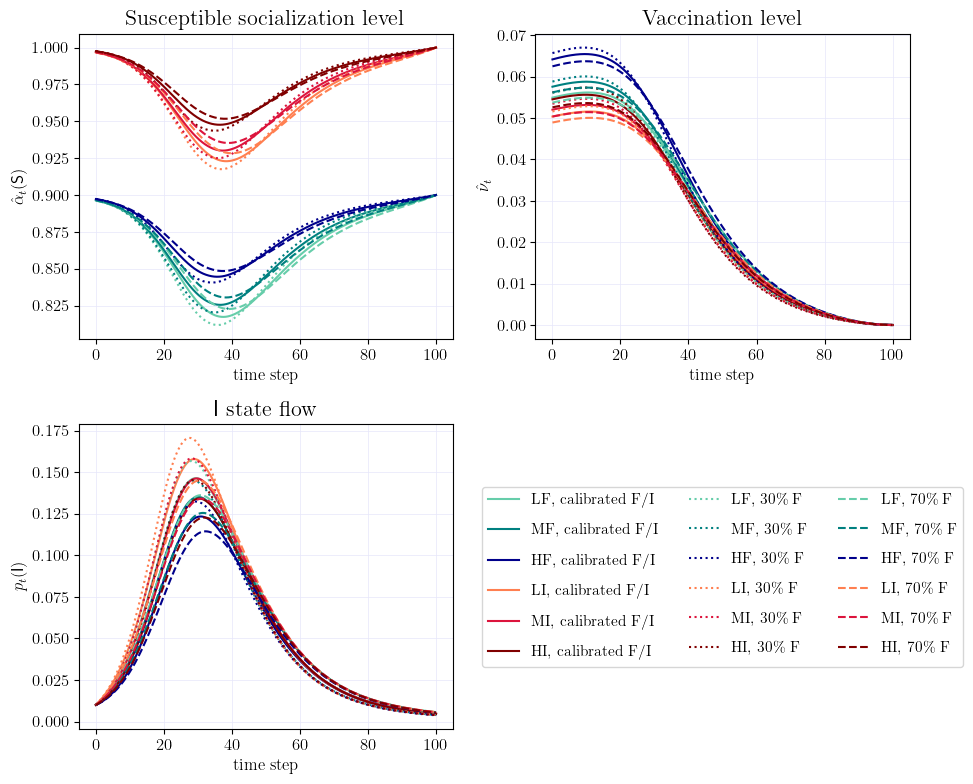

In [ ]:
prop_names = ['calibrated F/I', '30\% F', '70\% F']

fig, ax = plt.subplots(2, 2, figsize=(10, 8))

ax[0,0].grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax[0,1].grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax[1,0].grid(True, color='lavender', linestyle='-', linewidth=0.5)

for j in np.arange(3):
    for i in np.arange(6):
        p_S_block_i = prop_debug[j][1][i,:]
        p_I_block_i = prop_debug[j][1][6 + i,:]
        p_R_block_i = prop_debug[j][1][12 + i,:]
        # ax1.plot(t_grid, p_S_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
        ax[1,0].plot(t_grid, p_I_block_i, label = f"{block_names[i]}, {prop_names[j]}", c=colors[i], linestyle=line_styles[j])
        # ax3.plot(t_grid, p_R_block_i, label = f"{block_names[i]}, {policy_names[j]}", c=colors[i], linestyle=line_styles[j])
ax[1,0].set_title(r"$\mathsf{I}$ state flow", fontsize=16)
ax[1,0].set_xlabel('time step')
ax[1,0].set_ylabel(r'$p_{t}(\mathsf{I})$')


for j in np.arange(3):
    for i in np.arange(6):
        alpha_S_block_i = prop_debug[j][2][i,:]
        ax[0,0].plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, {prop_names[j]}", c=colors[i], linestyle=line_styles[j])
        nu_block_i = prop_debug[j][5][i,:]
        ax[0,1].plot(t_grid, nu_block_i, label = f"{block_names[i]}, {prop_names[j]}", c=colors[i], linestyle=line_styles[j])

ax[0,0].set_ylabel(r'$\hat{\alpha}_t(\mathsf{S})$')
ax[0,0].set_title("Susceptible socialization level", fontsize=16)
ax[0,0].set_xlabel('time step')
# ax[0].set_ylabel('proportion')
ax[0,1].set_title("Vaccination level", fontsize=16)
ax[0,1].set_xlabel('time step')
ax[0,1].set_ylabel(r'$\hat{\nu}_t$')

handles, labels = ax[0,0].get_legend_handles_labels()

ax[1, 1].axis('off')

ax[1, 1].legend(handles, labels,
                loc='center',
                frameon=True,
                fontsize=11,
                ncol=3,
                labelspacing=1.0)


plt.tight_layout(h_pad=1.0)
title = "r2_follower_prop_3"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')
plt.show()

In [ ]:
# ── sweep f from 0 (all-indifferent) to 1 (all-follower), 11 points ──────
f_sweep  = np.linspace(0, 1, 101)
sens_r2 = {}

for f in tqdm(f_sweep, desc='R2 f-sweep'):
    with contextlib.redirect_stdout(io.StringIO()):
        sens_r2[f] = stoch_block_fixed(
            n_blocks, n_states, Nt,
            [0.9]*6, [0.9]*6, [0.9]*6,
            graphon_r2, beta_r2, kappa_r2, gamma_r2,
            rho, c_lambda_r2, c_inf_r2, c_dead, c_nu_r2, xi_i_r2, eta_r2,
            t_grid, T, p_0_r2, u_T_r2, n_print,
            f'G75_f{f:.2f}', bd_r2(f), 1, lambda_duration, 0)


R2 f-sweep: 100%|██████████| 101/101 [01:27<00:00,  1.15it/s]


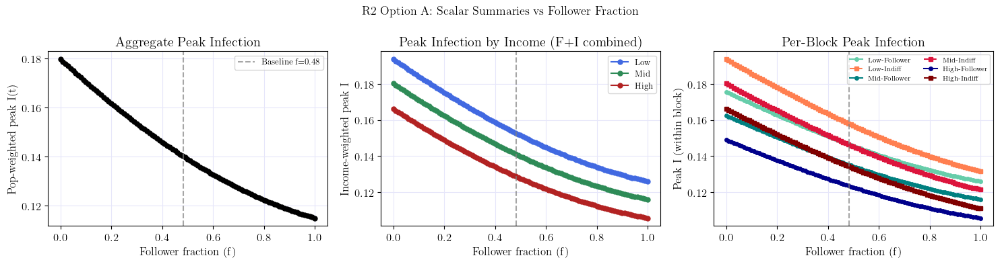

In [ ]:
_inc_labels = ['Low', 'Mid', 'High']
_inc_colors = ['royalblue', 'seagreen', 'firebrick']
_fol_colors = ['mediumaquamarine', 'teal', 'darkblue']
_ind_colors = ['coral', 'crimson', 'maroon']

# Collect per-block scalars
peak_pI = np.zeros((len(f_sweep), 6))
peak_nu = np.zeros((len(f_sweep), 6))
min_alp = np.zeros((len(f_sweep), 6))

for fi, f in enumerate(f_sweep):
    res = sens_r2[f]
    p, alp, nu = res[1], res[2], res[5]
    for k in range(6):
        peak_pI[fi, k] = np.max(p[6 + k, :])
        peak_nu[fi, k] = np.max(nu[k, :])
        min_alp[fi, k] = np.min(alp[k, :])

# Population-weighted aggregate: peak of sum_k bd_k * pI_k(t)
agg_peak_pI = np.array([
    np.max(np.sum(np.array(bd_r2(f))[:, None] * sens_r2[f][1][6:12, :], axis=0))
    for f in f_sweep
])

# Income-level: weighted-avg peak pI (combine follower + indifferent within each income level)
income_peak_pI = np.zeros((len(f_sweep), 3))
for fi, f in enumerate(f_sweep):
    bd = np.array(bd_r2(f))
    for k in range(3):
        wt = bd[k] + bd[k+3]
        if wt > 1e-12:
            income_peak_pI[fi, k] = (bd[k]*peak_pI[fi,k] + bd[k+3]*peak_pI[fi,k+3]) / wt

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
fig.suptitle('R2 Option A: Scalar Summaries vs Follower Fraction', fontsize=13)

# Panel 1: aggregate peak infection
axes[0].plot(f_sweep, agg_peak_pI, 'k-o', ms=5)
axes[0].axvline(x=_bd_f_tot, color='gray', ls='--', alpha=0.7,
                label=f'Baseline f={_bd_f_tot:.2f}')
axes[0].set_xlabel('Follower fraction (f)')
axes[0].set_ylabel('Pop-weighted peak I(t)')
axes[0].set_title('Aggregate Peak Infection')
axes[0].legend(fontsize=9)
axes[0].grid(True, color='lavender')

# Panel 2: income-level weighted peak pI (F+I combined within income)
for k in range(3):
    axes[1].plot(f_sweep, income_peak_pI[:, k], '-o', ms=5,
                 color=_inc_colors[k], label=_inc_labels[k])
axes[1].axvline(x=_bd_f_tot, color='gray', ls='--', alpha=0.7)
axes[1].set_xlabel('Follower fraction (f)')
axes[1].set_ylabel('Income-weighted peak I')
axes[1].set_title('Peak Infection by Income (F+I combined)')
axes[1].legend(fontsize=9)
axes[1].grid(True, color='lavender')

# Panel 3: per-block peak pI, followers (solid) vs indifferents (dashed)
for k in range(3):
    axes[2].plot(f_sweep, peak_pI[:, k],   '-o', ms=4,
                 color=_fol_colors[k], label=f'{_inc_labels[k]}-Follower')
    axes[2].plot(f_sweep, peak_pI[:, k+3], '--s', ms=4,
                 color=_ind_colors[k],  label=f'{_inc_labels[k]}-Indiff')
axes[2].axvline(x=_bd_f_tot, color='gray', ls='--', alpha=0.7)
axes[2].set_xlabel('Follower fraction (f)')
axes[2].set_ylabel('Peak I (within block)')
axes[2].set_title('Per-Block Peak Infection')
axes[2].legend(fontsize=7, ncol=2)
axes[2].grid(True, color='lavender')

plt.tight_layout()
plt.show()


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


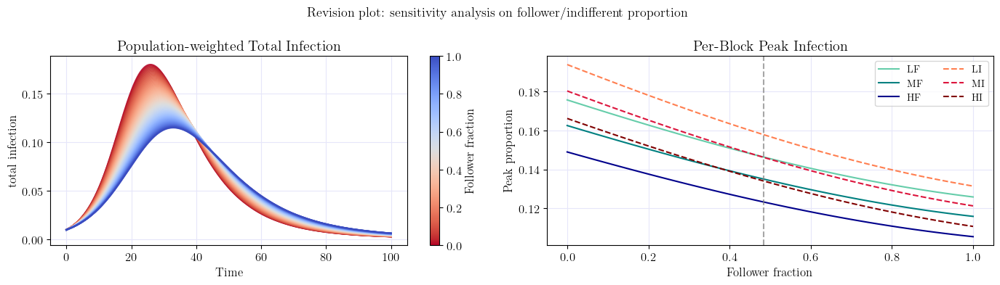

In [ ]:
cmap_fan     = plt.cm.coolwarm_r   # blue = low f (indiff-heavy), red = high f (follower-heavy)
f_colors_fan = [cmap_fan(fi / (len(f_sweep) - 1)) for fi in range(len(f_sweep))]

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
fig.suptitle('Revision plot: sensitivity analysis on follower/indifferent proportion', fontsize=13)

# Left panel: pop-weighted total I(t) for each f
for fi, f in enumerate(f_sweep):
    bd      = np.array(bd_r2(f))
    I_total = np.sum(bd[:, None] * sens_r2[f][1][6:12, :], axis=0)
    # lbl     = f'f={f:.1f}' if fi in (0, 5, 10) else None
    axes[0].plot(t_grid, I_total, color=f_colors_fan[fi], alpha=0.85)

axes[0].set_xlabel('Time')
axes[0].set_ylabel('total infection')
axes[0].set_title('Population-weighted Total Infection')
# axes[0].legend(fontsize=9)
axes[0].grid(True, color='lavender')
sm0 = plt.cm.ScalarMappable(cmap=cmap_fan, norm=plt.Normalize(0, 1))
sm0.set_array([])
plt.colorbar(sm0, ax=axes[0], label='Follower fraction')

inc_labels_short = ['L', 'M', 'H']

# right panel
for k in range(3):
    axes[1].plot(f_sweep, peak_pI[:, k],   '-', ms=4,
                 color=_fol_colors[k], label=f'{inc_labels_short[k]}F')
    
for k in range(3):
    axes[1].plot(f_sweep, peak_pI[:, k+3], '--', ms=4,
                 color=_ind_colors[k],  label=f'{inc_labels_short[k]}I')
axes[1].axvline(x=_bd_f_tot, color='gray', ls='--', alpha=0.7)
axes[1].set_xlabel('Follower fraction')
axes[1].set_ylabel('Peak proportion')
axes[1].set_title('Per-Block Peak Infection')
axes[1].legend(fontsize=10, ncol=2)
axes[1].grid(True, color='lavender')

plt.tight_layout()
plt.savefig('Plots/r2_follower_prop_1.eps', bbox_inches='tight', format='eps')
plt.show()


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


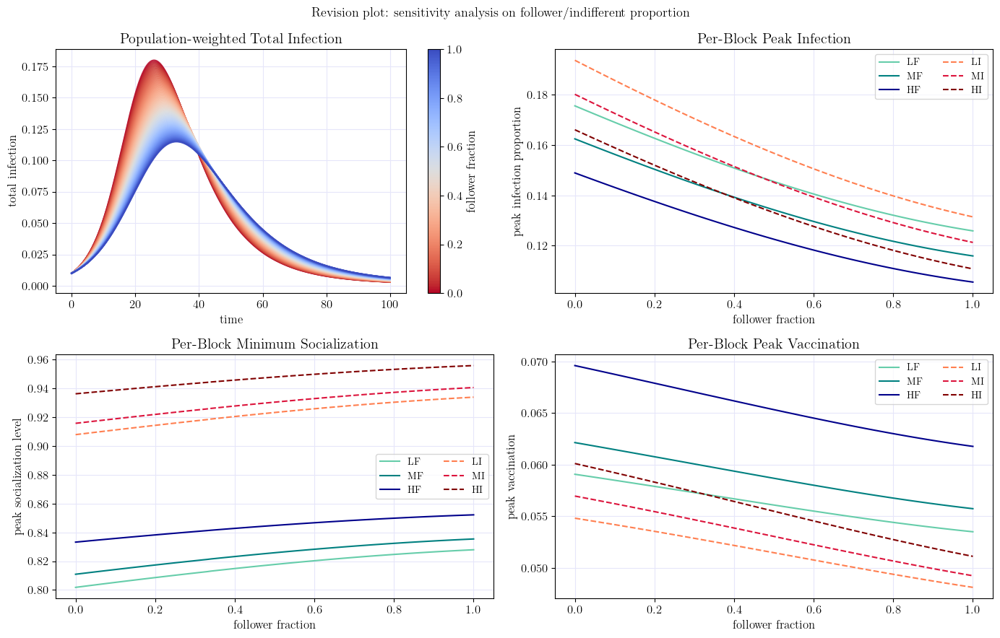

In [ ]:
cmap_fan     = plt.cm.coolwarm_r   # blue = low f (indiff-heavy), red = high f (follower-heavy)
f_colors_fan = [cmap_fan(fi / (len(f_sweep) - 1)) for fi in range(len(f_sweep))]

fig, axes = plt.subplots(2, 2, figsize=(14, 9))
fig.suptitle('Revision plot: sensitivity analysis on follower/indifferent proportion', fontsize=13)

# top Left panel: pop-weighted total I(t) for each f
for fi, f in enumerate(f_sweep):
    bd      = np.array(bd_r2(f))
    I_total = np.sum(bd[:, None] * sens_r2[f][1][6:12, :], axis=0)
    # lbl     = f'f={f:.1f}' if fi in (0, 5, 10) else None
    axes[0,0].plot(t_grid, I_total, color=f_colors_fan[fi], alpha=0.85)

axes[0,0].set_xlabel('time')
axes[0,0].set_ylabel('total infection')
axes[0,0].set_title('Population-weighted Total Infection')
# axes[0].legend(fontsize=9)
axes[0,0].grid(True, color='lavender')
sm0 = plt.cm.ScalarMappable(cmap=cmap_fan, norm=plt.Normalize(0, 1))
sm0.set_array([])
plt.colorbar(sm0, ax=axes[0,0], label='follower fraction')

inc_labels_short = ['L', 'M', 'H']

# top right panel
for k in range(3):
    axes[0,1].plot(f_sweep, peak_pI[:, k],   '-', ms=4,
                 color=_fol_colors[k], label=f'{inc_labels_short[k]}F')
    
for k in range(3):
    axes[0,1].plot(f_sweep, peak_pI[:, k+3], '--', ms=4,
                 color=_ind_colors[k],  label=f'{inc_labels_short[k]}I')
# axes[0,1].axvline(x=_bd_f_tot, color='gray', ls='--', alpha=0.7)
axes[0,1].set_xlabel('follower fraction')
axes[0,1].set_ylabel('peak infection proportion')
axes[0,1].set_title('Per-Block Peak Infection')
axes[0,1].legend(fontsize=10, ncol=2)
axes[0,1].grid(True, color='lavender')

# bottom left panel
for k in range(3):
    axes[1,0].plot(f_sweep, min_alp[:, k],   '-', ms=4,
                 color=_fol_colors[k], label=f'{inc_labels_short[k]}F')
    
for k in range(3):
    axes[1,0].plot(f_sweep, min_alp[:, k+3], '--', ms=4,
                 color=_ind_colors[k],  label=f'{inc_labels_short[k]}I')
# axes[1,0].axvline(x=_bd_f_tot, color='gray', ls='--', alpha=0.7)
axes[1,0].set_xlabel('follower fraction')
axes[1,0].set_ylabel('peak socialization level')
axes[1,0].set_title('Per-Block Minimum Socialization')
axes[1,0].legend(fontsize=10, ncol=2)
axes[1,0].grid(True, color='lavender')

# bottom right panel
for k in range(3):
    axes[1,1].plot(f_sweep, peak_nu[:, k],   '-', ms=4,
                 color=_fol_colors[k], label=f'{inc_labels_short[k]}F')
    
for k in range(3):
    axes[1,1].plot(f_sweep, peak_nu[:, k+3], '--', ms=4,
                 color=_ind_colors[k],  label=f'{inc_labels_short[k]}I')
# axes[1,1].axvline(x=_bd_f_tot, color='gray', ls='--', alpha=0.7)
axes[1,1].set_xlabel('follower fraction')
axes[1,1].set_ylabel('peak vaccination')
axes[1,1].set_title('Per-Block Peak Vaccination')
axes[1,1].legend(fontsize=10, ncol=2)
axes[1,1].grid(True, color='lavender')

plt.tight_layout()
plt.savefig('Plots/r2_follower_prop_2.eps', bbox_inches='tight', format='eps')
plt.show()


### R3: Sensitivity Analysis on networks.

In [1258]:
network_debug = {}

# current one
graphon = np.array([[1.0, 0.95, 0.95, 0.95, 0.9, 0.9],
                    [0.95, 1.0, 0.95, 0.9, 0.95, 0.9],
                    [0.95, 0.95, 1.0, 0.9, 0.9, 0.95],
                    [0.95, 0.9, 0.9, 1.0, 0.95, 0.95],
                    [0.9, 0.95, 0.9, 0.95, 1.0, 0.95],
                    [0.9, 0.9, 0.95, 0.95, 0.95, 1.0]])

network_debug[1] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

# fully connected
graphon_full = np.array([
    [1.00, 1.00, 1.00, 1.00, 1.00, 1.00],
    [1.00, 1.00, 1.00, 1.00, 1.00, 1.00],
    [1.00, 1.00, 1.00, 1.00, 1.00, 1.00],
    [1.00, 1.00, 1.00, 1.00, 1.00, 1.00],
    [1.00, 1.00, 1.00, 1.00, 1.00, 1.00],
    [1.00, 1.00, 1.00, 1.00, 1.00, 1.00],
])
network_debug[0] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon_full, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

# fully connected
graphon_less = np.array([
    [1.00, 0.75, 0.75, 0.75, 0.50, 0.50],
    [0.75, 1.00, 0.75, 0.50, 0.75, 0.50],
    [0.75, 0.75, 1.00, 0.50, 0.50, 0.75],
    [0.75, 0.50, 0.50, 1.00, 0.75, 0.75],
    [0.50, 0.75, 0.50, 0.75, 1.00, 0.75],
    [0.50, 0.50, 0.75, 0.75, 0.75, 1.00],
])
network_debug[2] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon_less, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)


iter:  0 p conv:  45.10239253946166 u conv: 1588.0928125140915
iter:  10 p conv:  0.8379413840109882 u conv: 9.32268298986906
iter:  20 p conv:  0.0008195564047341369 u conv: 0.02007259540929142
iter:  30 p conv:  1.982213586073193e-07 u conv: 2.4061124740224128e-06
iter:  0 p conv:  47.56383772472557 u conv: 1591.2255615989075
iter:  10 p conv:  0.7173801246719625 u conv: 10.59016936682076
iter:  20 p conv:  0.0007248353798042559 u conv: 0.01745263121566858
iter:  30 p conv:  6.04146103244127e-07 u conv: 1.1828492612426312e-05
iter:  0 p conv:  34.95082419067344 u conv: 1576.3316737821622
iter:  10 p conv:  1.8024111707703616 u conv: 9.953670239460765
iter:  20 p conv:  0.008818503480347238 u conv: 0.1096168629290258
iter:  30 p conv:  1.3293860434384832e-05 u conv: 0.00013475200416294126
iter:  40 p conv:  3.7630150683625967e-08 u conv: 2.3005335354277417e-07


In [1259]:
# high homophily
graphon_base = np.array([
    [1.00, 0.95, 0.95, 0.95, 0.90, 0.90],
    [0.95, 1.00, 0.95, 0.90, 0.95, 0.90],
    [0.95, 0.95, 1.00, 0.90, 0.90, 0.95],
    [0.95, 0.90, 0.90, 1.00, 0.95, 0.95],
    [0.90, 0.95, 0.90, 0.95, 1.00, 0.95],
    [0.90, 0.90, 0.95, 0.95, 0.95, 1.00],
])

same_or_perception_val = 0.95
different_both_val = 0.50

graphon_high_homophily_weighted = graphon_base.copy()

# off-diagonal replacement
graphon_high_homophily_weighted[graphon_base == 0.95] = same_or_perception_val
graphon_high_homophily_weighted[graphon_base == 0.90] = different_both_val

# adjust diagonal so that each weighted row sum matches baseline
target_level = graphon_base @ block_dens

for k in range(n_blocks):
    offdiag_level = np.sum(graphon_high_homophily_weighted[k, :] * block_dens) \
                    - graphon_high_homophily_weighted[k, k] * block_dens[k]
    graphon_high_homophily_weighted[k, k] = (
        target_level[k] - offdiag_level
    ) / block_dens[k]

print(np.round(graphon_high_homophily_weighted, 4))
print("baseline weighted row sums:", np.round(graphon_base @ block_dens, 6))
print("new weighted row sums:     ", np.round(graphon_high_homophily_weighted @ block_dens, 6))

[[1.9255 0.95   0.95   0.95   0.5    0.5   ]
 [0.95   1.9288 0.95   0.5    0.95   0.5   ]
 [0.95   0.95   1.7329 0.5    0.5    0.95  ]
 [0.95   0.5    0.5    1.7694 0.95   0.95  ]
 [0.5    0.95   0.5    0.95   1.8053 0.95  ]
 [0.5    0.5    0.95   0.95   0.95   1.6804]]
baseline weighted row sums: [0.940325 0.940025 0.942265 0.941915 0.941615 0.943855]
new weighted row sums:      [0.940325 0.940025 0.942265 0.941915 0.941615 0.943855]


In [1260]:
network_debug[3] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon_high_homophily_weighted, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  45.13067939918152 u conv: 1588.121514504358
iter:  10 p conv:  0.8241536708111782 u conv: 9.333260329049425
iter:  20 p conv:  0.0007869815780805775 u conv: 0.019423413530263334
iter:  30 p conv:  2.0052617486365335e-07 u conv: 2.462181201696493e-06


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


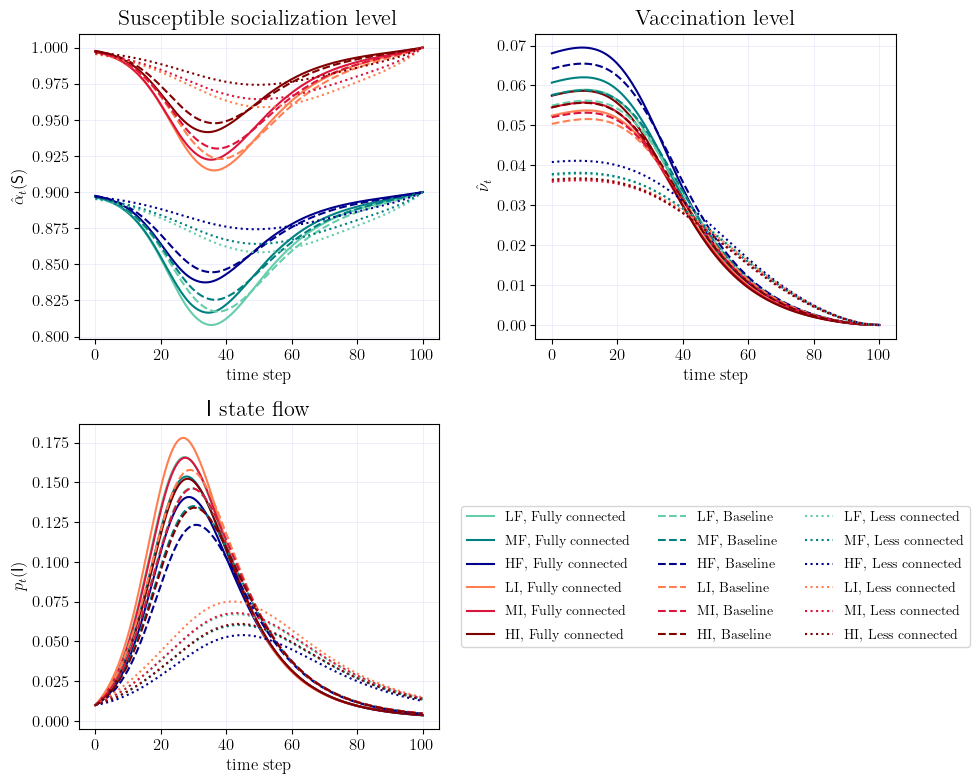

In [1261]:
network_names = ['Fully connected', 'Baseline', 'Less connected', 'High homophily']

fig, ax = plt.subplots(2, 2, figsize=(10, 8))

# grids
ax[0,0].grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax[0,1].grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax[1,0].grid(True, color='lavender', linestyle='-', linewidth=0.5)

# For three network cases, make sure line_styles has length >= 3
# Example:
line_styles_network = ['-', '--', ':']

# -------------------------
# Plot infected state flow
# -------------------------
for j in np.arange(3):
    for i in np.arange(6):
        p_S_block_i = network_debug[j][1][i, :]
        p_I_block_i = network_debug[j][1][6 + i, :]
        p_R_block_i = network_debug[j][1][12 + i, :]

        ax[1,0].plot(
            t_grid,
            p_I_block_i,
            label=f"{block_names[i]}, {network_names[j]}",
            c=colors[i],
            linestyle=line_styles_network[j]
        )

ax[1,0].set_title(r"$\mathsf{I}$ state flow", fontsize=16)
ax[1,0].set_xlabel('time step')
ax[1,0].set_ylabel(r'$p_{t}(\mathsf{I})$')


# -------------------------
# Plot controls: alpha(S), nu
# -------------------------
for j in np.arange(3):
    for i in np.arange(6):
        alpha_S_block_i = network_debug[j][2][i, :]
        ax[0,0].plot(
            t_grid,
            alpha_S_block_i,
            label=f"{block_names[i]}, {network_names[j]}",
            c=colors[i],
            linestyle=line_styles_network[j]
        )

        nu_block_i = network_debug[j][5][i, :]
        ax[0,1].plot(
            t_grid,
            nu_block_i,
            label=f"{block_names[i]}, {network_names[j]}",
            c=colors[i],
            linestyle=line_styles_network[j]
        )

ax[0,0].set_title("Susceptible socialization level", fontsize=16)
ax[0,0].set_xlabel('time step')
ax[0,0].set_ylabel(r'$\hat{\alpha}_t(\mathsf{S})$')

ax[0,1].set_title("Vaccination level", fontsize=16)
ax[0,1].set_xlabel('time step')
ax[0,1].set_ylabel(r'$\hat{\nu}_t$')


# -------------------------
# Legend panel
# -------------------------
handles, labels = ax[0,0].get_legend_handles_labels()

ax[1,1].axis('off')
ax[1,1].legend(
    handles,
    labels,
    loc='center',
    frameon=True,
    fontsize=10,
    ncol=3,
    labelspacing=0.8
)

plt.tight_layout(h_pad=1.0)

title = "r3_network_sensitivity_1"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')
plt.show()

In [ ]:
from matplotlib.lines import Line2D

network_names = {
    0: 'Fully connected',
    1: 'Baseline',
    2: 'Less connected',
    3: 'High homophily'
}

line_styles_network = {
    0: '--',                 # Fully connected
    1: '-',                  # Baseline default
    2: '-.',                 # Less connected
    3: (0, (5, 1, 1, 1))     # High homophily
}

def get_line_style(j, i):
    # Make LF/MF/HF under baseline easier to identify
    if j == 1 and i in [3, 4, 5]:
        return ':'
    return line_styles_network[j]

def plot_network_sensitivity(case_ids, save_title):
    fig, ax = plt.subplots(2, 2, figsize=(10, 8))

    for a in [ax[0,0], ax[0,1], ax[1,0]]:
        a.grid(True, color='lavender', linestyle='-', linewidth=0.5)

    for j in case_ids:
        for i in range(6):
            ls = get_line_style(j, i)

            ax[1,0].plot(
                t_grid,
                network_debug[j][1][6 + i, :],
                c=colors[i],
                linestyle=ls,
                linewidth=1.8
            )

            ax[0,0].plot(
                t_grid,
                network_debug[j][2][i, :],
                c=colors[i],
                linestyle=ls,
                linewidth=1.8
            )

            ax[0,1].plot(
                t_grid,
                network_debug[j][5][i, :],
                c=colors[i],
                linestyle=ls,
                linewidth=1.8
            )

    ax[0,0].set_title("Susceptible socialization level", fontsize=16)
    ax[0,0].set_xlabel('time step')
    ax[0,0].set_ylabel(r'$\hat{\alpha}_t(\mathsf{S})$')

    ax[0,1].set_title("Vaccination level", fontsize=16)
    ax[0,1].set_xlabel('time step')
    ax[0,1].set_ylabel(r'$\hat{\nu}_t$')

    ax[1,0].set_title(r"$\mathsf{I}$ state flow", fontsize=16)
    ax[1,0].set_xlabel('time step')
    ax[1,0].set_ylabel(r'$p_t(\mathsf{I})$')

    ax[1,1].axis('off')

    legend_handles = []
    for j in case_ids:
        for i in range(6):
            legend_handles.append(
                Line2D(
                    [0], [0],
                    color=colors[i],
                    linestyle=get_line_style(j, i),
                    linewidth=2,
                    label=f"{block_names[i]}, {network_names[j]}"
                )
            )

    ax[1,1].legend(
        handles=legend_handles,
        loc='center',
        frameon=True,
        fontsize=11 if len(case_ids) == 2 else 10,
        ncol=len(case_ids),
        labelspacing=0.8,
        handlelength=3.5,
        handletextpad=0.6,
        columnspacing=1.2
    )

    plt.tight_layout(h_pad=1.0)
    plt.savefig(f'Plots/{save_title}.eps', bbox_inches='tight', format='eps')
    plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


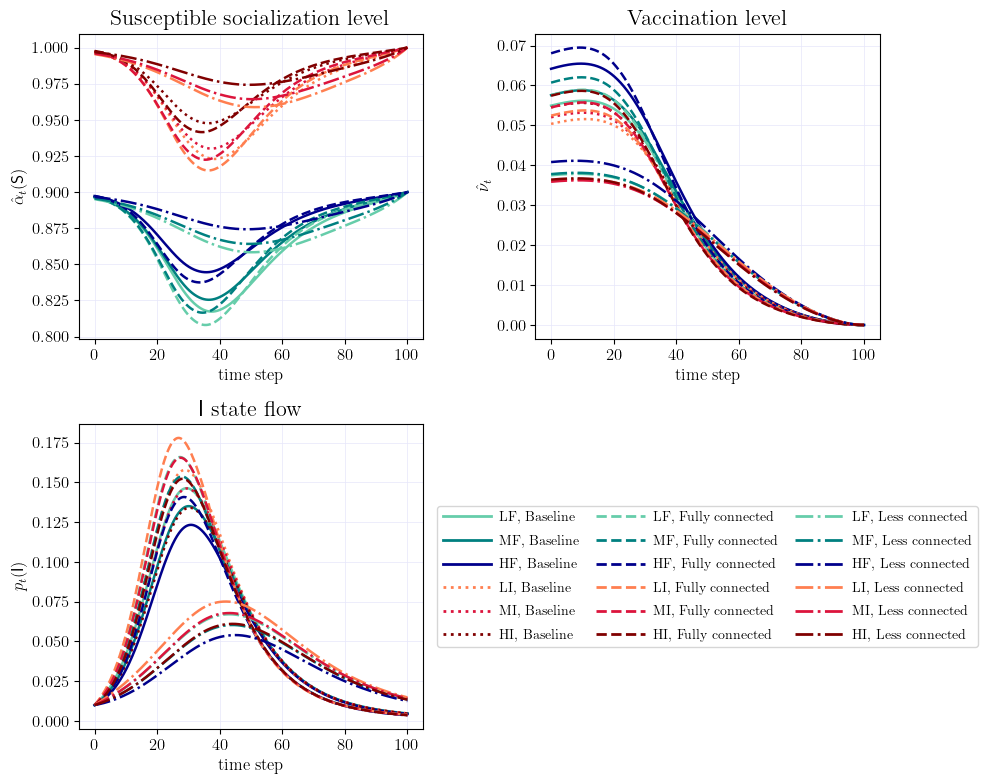

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


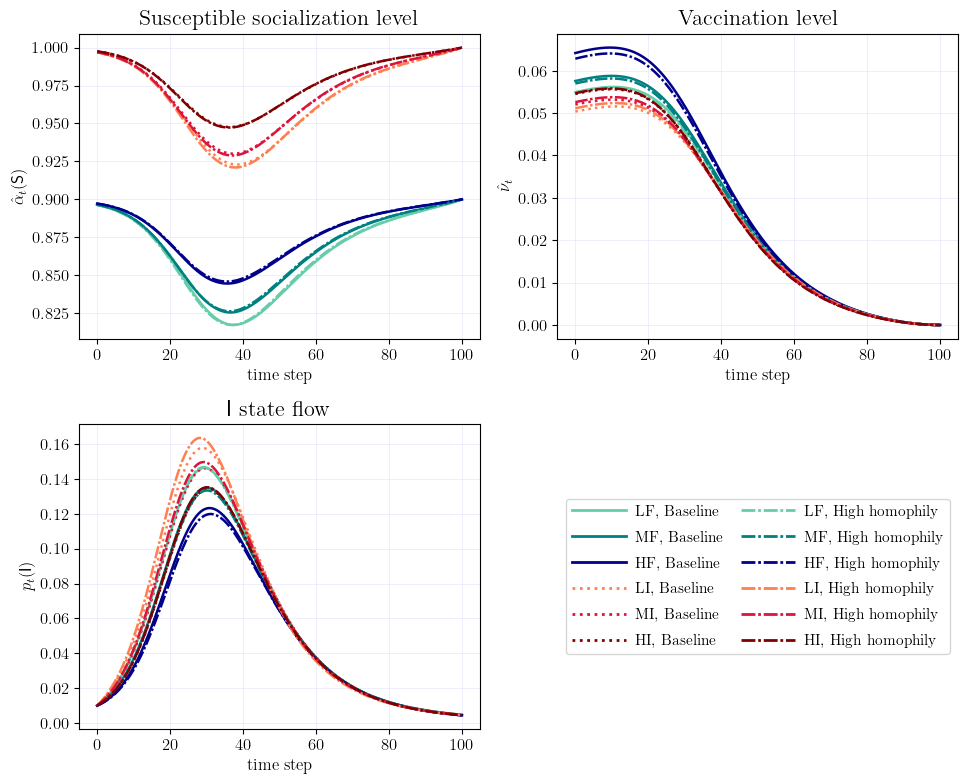

In [1283]:
# Three-case comparison
plot_network_sensitivity(
    case_ids=[1, 0, 2],
    save_title="r3_network_sensitivity_1"
)

# Baseline vs high homophily
plot_network_sensitivity(
    case_ids=[1, 3],
    save_title="r3_network_sensitivity_3"
)

In [1284]:
graphon = np.array([[1.0, 0.95, 0.95, 0.95, 0.9, 0.9],
                    [0.95, 1.0, 0.95, 0.9, 0.95, 0.9],
                    [0.95, 0.95, 1.0, 0.9, 0.9, 0.95],
                    [0.95, 0.9, 0.9, 1.0, 0.95, 0.95],
                    [0.9, 0.95, 0.9, 0.95, 1.0, 0.95],
                    [0.9, 0.9, 0.95, 0.95, 0.95, 1.0]])

### R4: Exploration on epidemic parameters

First note that bogh gamma and eta are decided by the disease and constitution of people, which should not distinct among our groups of interest in this paper. Therefore, while exploring the variation of these parameters, we keep them the same across all economic and authority perception groups. For beta we scale while preserving the internal proportion.

In [739]:
def _as_group_param(x, n_blocks):
    x = np.asarray(x)
    if x.ndim == 0:
        return np.repeat(float(x), n_blocks)
    return x.copy()


def summarize_sweep_output(out, block_dens):
    bd = np.asarray(block_dens)

    p_I = out[1][6:12, :]      # group infected paths
    alpha_S = out[2]           # susceptible socialization paths
    nu = out[5]                # vaccination paths

    I_total = np.sum(bd[:, None] * p_I, axis=0)

    infection_peak = np.max(I_total)
    min_alpha_S = np.min(alpha_S)
    max_nu = np.max(nu)

    return infection_peak, min_alpha_S, max_nu


def plot_3_heatmaps(metric_arrays, x_vals, y_vals, x_label, y_label, title_prefix, save_name):
    fig, axes = plt.subplots(1, 3, figsize=(15, 4.2))

    metric_names = [
        "Infection peak",
        "Minimum socialization",
        "Maximum vaccination"
    ]

    for ax, metric_name in zip(axes, metric_names):
        im = ax.imshow(
            metric_arrays[metric_name],
            origin='lower',
            aspect='auto',
            extent=[x_vals[0], x_vals[-1], y_vals[0], y_vals[-1]]
        )

        ax.set_title(metric_name, fontsize=14)
        ax.set_xlabel(x_label)
        ax.set_ylabel(y_label)
        ax.grid(False)

        cbar = plt.colorbar(im, ax=ax)
        cbar.ax.tick_params(labelsize=9)

    fig.suptitle(title_prefix, fontsize=16)
    plt.tight_layout()
    plt.savefig(f"Plots/{save_name}.eps", bbox_inches='tight', format='eps')
    plt.show()

In [740]:
np.linspace(0.8, 1.20, 21)

array([0.8 , 0.82, 0.84, 0.86, 0.88, 0.9 , 0.92, 0.94, 0.96, 0.98, 1.  ,
       1.02, 1.04, 1.06, 1.08, 1.1 , 1.12, 1.14, 1.16, 1.18, 1.2 ])

In [741]:
beta_sweep = np.linspace(0.7, 1.20, 11)
eta_sweep  = np.linspace(0.7, 1.20, 11) * eta[0]

beta_eta_debug = {}

peak_beta_eta = np.zeros((len(eta_sweep), len(beta_sweep)))
min_alpha_beta_eta = np.zeros((len(eta_sweep), len(beta_sweep)))
max_nu_beta_eta = np.zeros((len(eta_sweep), len(beta_sweep)))

for ie, eta_candi in enumerate(eta_sweep):
    for ib, beta_candi in enumerate(beta_sweep):

        beta_tmp = beta_candi * beta
        eta_tmp = np.array([eta_candi] * n_blocks)

        out = stoch_block_fixed(
            n_blocks, n_states, Nt,
            lambda_s_in, lambda_i_in, lambda_r_in,
            graphon,
            beta_tmp, kappa, gamma, rho,
            c_lambda, c_inf, c_dead, c_nu, xi_i, eta_tmp,
            t_grid, T, p_0, u_T, n_print,
            'Mar{date}_BetaEta_b{b:.2f}_e{e:.2f}'.format(
                date=date, b=beta_candi, e=eta_candi
            ),
            block_dens, lambda_type, lambda_duration, death
        )

        beta_eta_debug[(ib, ie)] = out

        infection_peak, min_alpha_S, max_nu = summarize_sweep_output(out, block_dens)

        peak_beta_eta[ie, ib] = infection_peak
        min_alpha_beta_eta[ie, ib] = min_alpha_S
        max_nu_beta_eta[ie, ib] = max_nu

iter:  0 p conv:  34.06537938067471 u conv: 1569.9986262852497
iter:  10 p conv:  1.7624674933525577 u conv: 11.15309108166556
iter:  20 p conv:  0.00836799145788023 u conv: 0.12466978608585669
iter:  30 p conv:  8.142048745240905e-05 u conv: 0.000882590164908477
iter:  40 p conv:  4.1814886416355013e-07 u conv: 3.1559628097855528e-06
iter:  0 p conv:  36.249775626580664 u conv: 1571.9140358438558
iter:  10 p conv:  1.8011459802921157 u conv: 9.667007286625257
iter:  20 p conv:  0.007882730727899018 u conv: 0.09907274980566687
iter:  30 p conv:  1.9391259404986804e-05 u conv: 0.0001952278033053395
iter:  40 p conv:  5.187844706186988e-08 u conv: 3.2552322163201676e-07
iter:  0 p conv:  38.412488768314674 u conv: 1573.8885056485367
iter:  10 p conv:  1.6527238786110463 u conv: 7.176531673557929
iter:  20 p conv:  0.00615152829759783 u conv: 0.05889465664521407
iter:  30 p conv:  4.950453713640766e-06 u conv: 2.180055840504562e-05
iter:  40 p conv:  2.499362694511682e-08 u conv: 1.753511

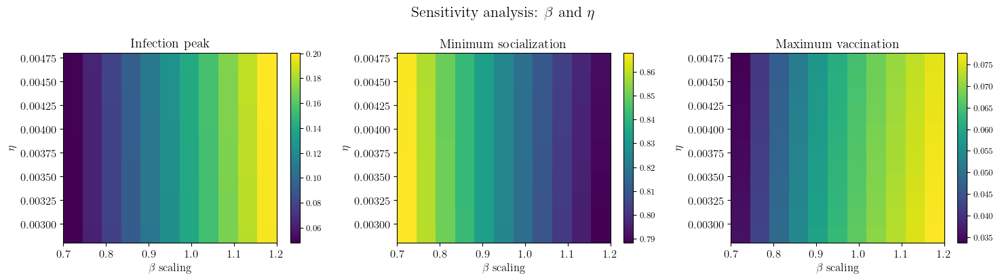

In [742]:
metric_beta_eta = {
    "Infection peak": peak_beta_eta,
    "Minimum socialization": min_alpha_beta_eta,
    "Maximum vaccination": max_nu_beta_eta,
}

plot_3_heatmaps(
    metric_arrays=metric_beta_eta,
    x_vals=beta_sweep,
    y_vals=eta_sweep,
    x_label=r'$\beta$ scaling',
    y_label=r'$\eta$',
    title_prefix=r'Sensitivity analysis: $\beta$ and $\eta$',
    save_name='r4_beta_eta_heatmaps'
)

In [743]:
beta_sweep = np.linspace(0.7, 1.2, 11)
gamma_sweep  = np.linspace(0.7, 1.2, 11) * gamma[0]

beta_gamma_debug = {}

peak_beta_gamma = np.zeros((len(gamma_sweep), len(beta_sweep)))
min_alpha_beta_gamma = np.zeros((len(gamma_sweep), len(beta_sweep)))
max_nu_beta_gamma = np.zeros((len(gamma_sweep), len(beta_sweep)))

for ie, gamma_candi in enumerate(gamma_sweep):
    for ib, beta_candi in enumerate(beta_sweep):

        beta_tmp = beta_candi * beta
        gamma_tmp = np.array([gamma_candi] * n_blocks)

        out = stoch_block_fixed(
            n_blocks, n_states, Nt,
            lambda_s_in, lambda_i_in, lambda_r_in,
            graphon,
            beta_tmp, kappa, gamma_tmp, rho,
            c_lambda, c_inf, c_dead, c_nu, xi_i, eta,
            t_grid, T, p_0, u_T, n_print,
            'Mar{date}_BetaEta_b{b:.2f}_e{e:.2f}'.format(
                date=date, b=beta_candi, e=gamma_candi
            ),
            block_dens, lambda_type, lambda_duration, death
        )

        beta_gamma_debug[(ib, ie)] = out

        infection_peak, min_alpha_S, max_nu = summarize_sweep_output(out, block_dens)

        peak_beta_gamma[ie, ib] = infection_peak
        min_alpha_beta_gamma[ie, ib] = min_alpha_S
        max_nu_beta_gamma[ie, ib] = max_nu

iter:  0 p conv:  32.310935382088104 u conv: 2188.7208181111737
iter:  10 p conv:  0.8593006897385768 u conv: 5.0398543503289615
iter:  20 p conv:  0.0007258340763955078 u conv: 0.005919494517295665
iter:  30 p conv:  5.535743996730865e-07 u conv: 3.6186078012235923e-06
iter:  0 p conv:  34.40130998411053 u conv: 2191.567466104985
iter:  10 p conv:  0.7182734722784723 u conv: 5.100513249916927
iter:  20 p conv:  0.0005570271098829426 u conv: 0.004078002012739235
iter:  30 p conv:  4.348760099010311e-07 u conv: 3.4133359050978197e-06
iter:  0 p conv:  36.471286207139656 u conv: 2194.4932865087494
iter:  10 p conv:  0.6043638593774693 u conv: 6.331682379965018
iter:  20 p conv:  0.00036269997644891794 u conv: 0.005259385491796141
iter:  30 p conv:  4.3869368800443576e-07 u conv: 6.620844804357278e-06
iter:  0 p conv:  38.520948892323155 u conv: 2197.4951681731295
iter:  10 p conv:  0.5203740514297543 u conv: 7.476706703386786
iter:  20 p conv:  0.0002386542079809449 u conv: 0.00555119351

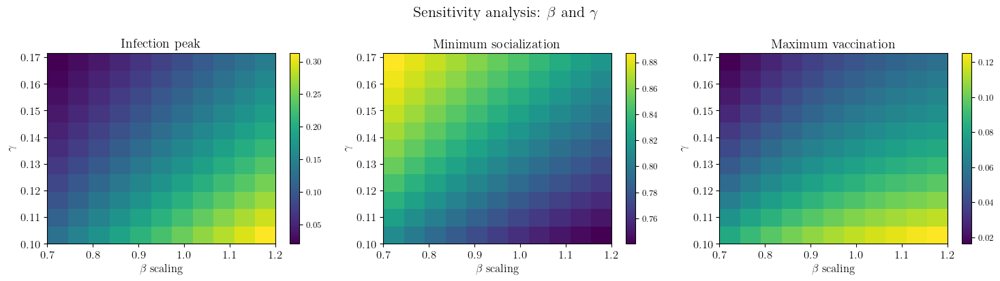

In [744]:
metric_beta_gamma = {
    "Infection peak": peak_beta_gamma,
    "Minimum socialization": min_alpha_beta_gamma,
    "Maximum vaccination": max_nu_beta_gamma,
}

plot_3_heatmaps(
    metric_arrays=metric_beta_gamma,
    x_vals=beta_sweep,
    y_vals=gamma_sweep,
    x_label=r'$\beta$ scaling',
    y_label=r'$\gamma$',
    title_prefix=r'Sensitivity analysis: $\beta$ and $\gamma$',
    save_name='r4_beta_gamma_heatmaps'
)

### R5: sensitivity analysis on $c_{\lambda}$

In [1248]:
clambda_debug = {}

# current one
clambda_debug[0] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

# follower adaptive c_lambda: 
c_lambda_follower_higher = np.array([1.2, 1.2, 1.2, 0.8, 0.8, 0.8])
clambda_debug[1] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda_follower_higher, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

# economic status adaptive c_lambda:
c_lambda_high_inc_higher = np.array([0.8, 1.0, 1.2, 0.8, 1.0, 1.2])
clambda_debug[2] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda_high_inc_higher, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  45.10239253946166 u conv: 1588.0928125140915
iter:  10 p conv:  0.8379413840109882 u conv: 9.32268298986906
iter:  20 p conv:  0.0008195564047341369 u conv: 0.02007259540929142
iter:  30 p conv:  1.982213586073193e-07 u conv: 2.4061124740224128e-06
iter:  0 p conv:  45.10239253946166 u conv: 1588.0928125140915
iter:  10 p conv:  0.840534979606742 u conv: 9.297385095333915
iter:  20 p conv:  0.00085216615120998 u conv: 0.020769962312722132
iter:  30 p conv:  2.263101807793884e-07 u conv: 2.426200226471885e-06
iter:  0 p conv:  45.10239253946166 u conv: 1588.0928125140915
iter:  10 p conv:  0.8397565812061416 u conv: 9.28994802071706
iter:  20 p conv:  0.0008557722310542209 u conv: 0.020853035260290375
iter:  30 p conv:  2.5351905904906204e-07 u conv: 2.8575728794180048e-06


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


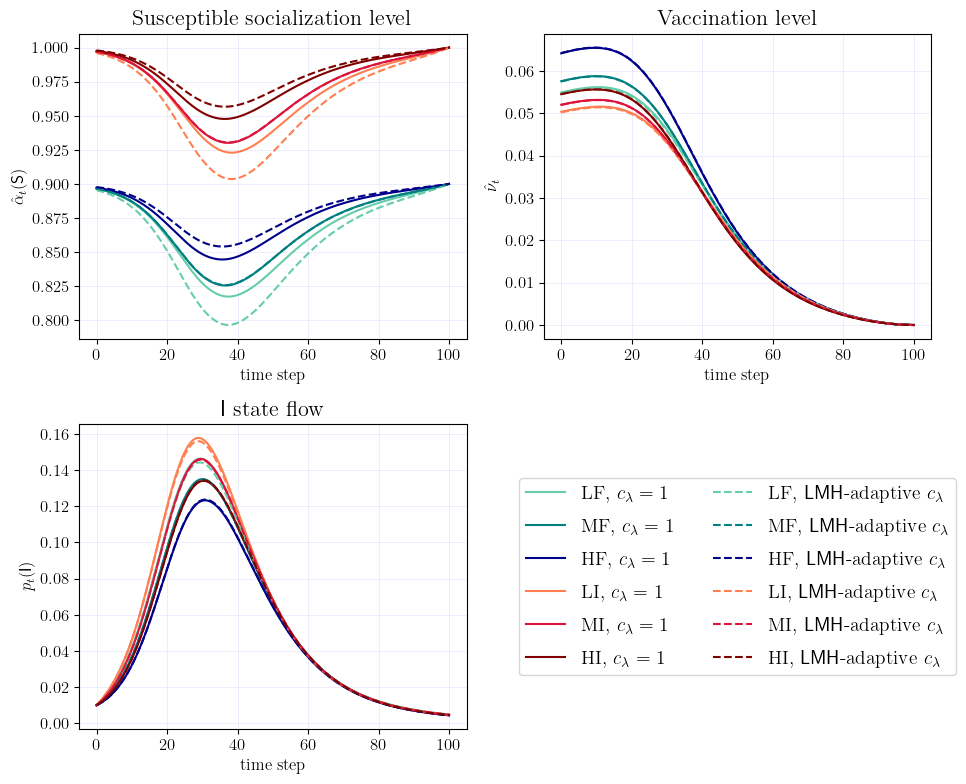

In [1249]:
clambda_names = [
    r'$c_\lambda = 1$',
    r'$\mathsf{FI}$ $c_\lambda$',
    r'$\mathsf{LMH}$-adaptive $c_\lambda$'
]

fig, ax = plt.subplots(2, 2, figsize=(10, 8))

# grids
ax[0,0].grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax[0,1].grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax[1,0].grid(True, color='lavender', linestyle='-', linewidth=0.5)

# two c_lambda cases
line_styles_clambda = ['-', ':', '--']

for j in [0,2]:
    for i in np.arange(6):
        p_S_block_i = clambda_debug[j][1][i, :]
        p_I_block_i = clambda_debug[j][1][6 + i, :]
        p_R_block_i = clambda_debug[j][1][12 + i, :]

        ax[1,0].plot(
            t_grid,
            p_I_block_i,
            label=f"{block_names[i]}, {clambda_names[j]}",
            c=colors[i],
            linestyle=line_styles_clambda[j]
        )

ax[1,0].set_title(r"$\mathsf{I}$ state flow", fontsize=16)
ax[1,0].set_xlabel('time step')
ax[1,0].set_ylabel(r'$p_{t}(\mathsf{I})$')

for j in [0,2]:
    for i in np.arange(6):
        alpha_S_block_i = clambda_debug[j][2][i, :]
        ax[0,0].plot(
            t_grid,
            alpha_S_block_i,
            label=f"{block_names[i]}, {clambda_names[j]}",
            c=colors[i],
            linestyle=line_styles_clambda[j]
        )

        nu_block_i = clambda_debug[j][5][i, :]
        ax[0,1].plot(
            t_grid,
            nu_block_i,
            label=f"{block_names[i]}, {clambda_names[j]}",
            c=colors[i],
            linestyle=line_styles_clambda[j]
        )

ax[0,0].set_title("Susceptible socialization level", fontsize=16)
ax[0,0].set_xlabel('time step')
ax[0,0].set_ylabel(r'$\hat{\alpha}_t(\mathsf{S})$')

ax[0,1].set_title("Vaccination level", fontsize=16)
ax[0,1].set_xlabel('time step')
ax[0,1].set_ylabel(r'$\hat{\nu}_t$')


handles, labels = ax[0,0].get_legend_handles_labels()

ax[1,1].axis('off')
ax[1,1].legend(
    handles,
    labels,
    loc='center',
    frameon=True,
    fontsize=14,
    ncol=2,
    labelspacing=0.8
)

plt.tight_layout(h_pad=1.0)

title = "r5_clambda_sensitivity_1"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


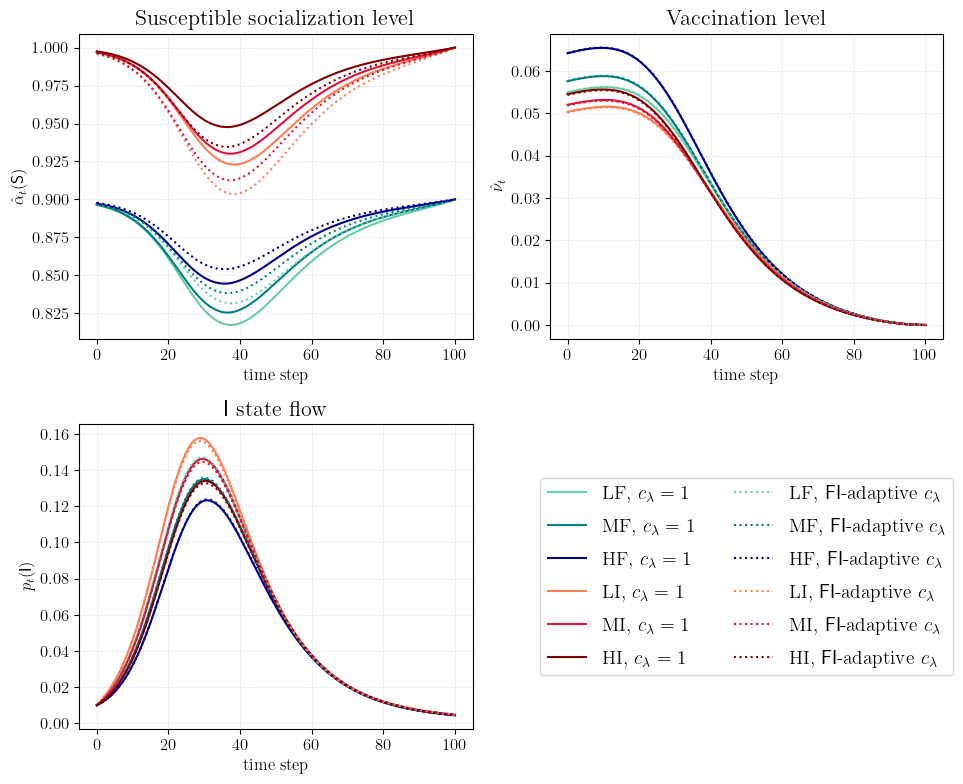

In [1250]:
clambda_names = [
    r'$c_\lambda = 1$',
    r'$\mathsf{FI}$-adaptive $c_\lambda$',
    r'$\mathsf{LMH}$ $c_\lambda$'
]

fig, ax = plt.subplots(2, 2, figsize=(10, 8))

# grids
ax[0,0].grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax[0,1].grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax[1,0].grid(True, color='lavender', linestyle='-', linewidth=0.5)

# two c_lambda cases
line_styles_clambda = ['-', ':', '--']

for j in np.arange(2):
    for i in np.arange(6):
        p_S_block_i = clambda_debug[j][1][i, :]
        p_I_block_i = clambda_debug[j][1][6 + i, :]
        p_R_block_i = clambda_debug[j][1][12 + i, :]

        ax[1,0].plot(
            t_grid,
            p_I_block_i,
            label=f"{block_names[i]}, {clambda_names[j]}",
            c=colors[i],
            linestyle=line_styles_clambda[j]
        )

ax[1,0].set_title(r"$\mathsf{I}$ state flow", fontsize=16)
ax[1,0].set_xlabel('time step')
ax[1,0].set_ylabel(r'$p_{t}(\mathsf{I})$')

for j in np.arange(2):
    for i in np.arange(6):
        alpha_S_block_i = clambda_debug[j][2][i, :]
        ax[0,0].plot(
            t_grid,
            alpha_S_block_i,
            label=f"{block_names[i]}, {clambda_names[j]}",
            c=colors[i],
            linestyle=line_styles_clambda[j]
        )

        nu_block_i = clambda_debug[j][5][i, :]
        ax[0,1].plot(
            t_grid,
            nu_block_i,
            label=f"{block_names[i]}, {clambda_names[j]}",
            c=colors[i],
            linestyle=line_styles_clambda[j]
        )

ax[0,0].set_title("Susceptible socialization level", fontsize=16)
ax[0,0].set_xlabel('time step')
ax[0,0].set_ylabel(r'$\hat{\alpha}_t(\mathsf{S})$')

ax[0,1].set_title("Vaccination level", fontsize=16)
ax[0,1].set_xlabel('time step')
ax[0,1].set_ylabel(r'$\hat{\nu}_t$')


handles, labels = ax[0,0].get_legend_handles_labels()

ax[1,1].axis('off')
ax[1,1].legend(
    handles,
    labels,
    loc='center',
    frameon=True,
    fontsize=14,
    ncol=2,
    labelspacing=0.8
)

plt.tight_layout(h_pad=1.0)

title = "r5_clambda_sensitivity_2"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


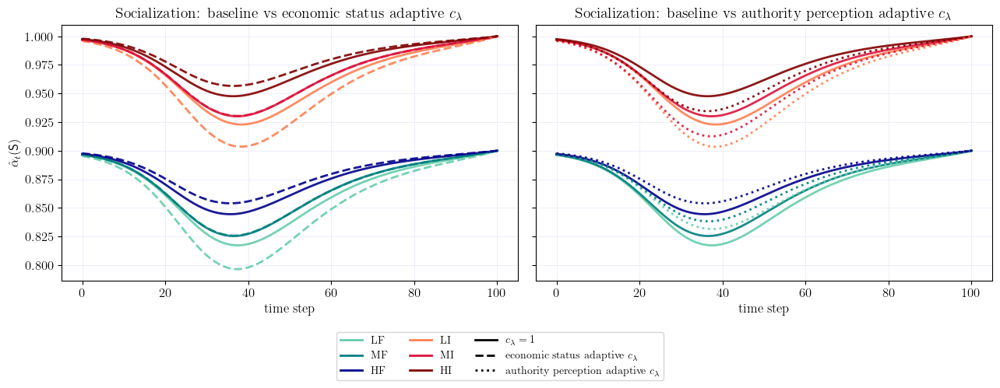

In [1253]:
from matplotlib.lines import Line2D

fig, axes = plt.subplots(1, 2, figsize=(13, 4.8), sharey=True)

plot_specs = [
    {
        "ax": axes[0],
        "cases": [0, 2],
        "labels": [r"$c_\lambda=1$", r"economic status adaptive $c_\lambda$"],
        "linestyles": ["-", "--"],
        "title": r"Socialization: baseline vs economic status adaptive $c_\lambda$",
    },
    {
        "ax": axes[1],
        "cases": [0, 1],
        "labels": [r"$c_\lambda=1$", r"authority perception adaptive $c_\lambda$"],
        "linestyles": ["-", ":"],
        "title": r"Socialization: baseline vs authority perception adaptive $c_\lambda$",
    },
]

for spec in plot_specs:
    ax = spec["ax"]

    for case_idx, case_label, ls in zip(
        spec["cases"], spec["labels"], spec["linestyles"]
    ):
        for i in range(6):
            alpha_S_block_i = clambda_debug[case_idx][2][i, :]

            ax.plot(
                t_grid,
                alpha_S_block_i,
                color=colors[i],
                linestyle=ls,
                linewidth=2,
                alpha=0.9
            )

    ax.set_title(spec["title"], fontsize=14)
    ax.set_xlabel("time step")
    ax.grid(True, color="lavender", linestyle="-", linewidth=0.5)

axes[0].set_ylabel(r"$\hat{\alpha}_t(\mathsf{S})$")

# Group color legend
group_handles = [
    Line2D([0], [0], color=colors[i], linewidth=2, label=block_names[i])
    for i in range(6)
]

# Line-style legend
style_handles = [
    Line2D([0], [0], color="black", linestyle="-", linewidth=2,
           label=r"$c_\lambda=1$"),
    Line2D([0], [0], color="black", linestyle="--", linewidth=2,
           label=r"economic status adaptive $c_\lambda$"),
    Line2D([0], [0], color="black", linestyle=":", linewidth=2,
           label=r"authority perception adaptive $c_\lambda$"),
]

fig.legend(
    handles=group_handles + style_handles,
    loc="lower center",
    ncol=3,
    fontsize=10,
    frameon=True,
    bbox_to_anchor=(0.5, -0.05)
)

plt.tight_layout(rect=[0, 0.10, 1, 1])

title = "r5_clambda_socialization_pairwise"
plt.savefig(f"Plots/{title}.eps", bbox_inches="tight", format="eps")
plt.show()

### R6: quantification of free rider effect on policies

In [1285]:
import numpy as np
import pandas as pd
import os

os.makedirs("Tables", exist_ok=True)

# Actual order: ['LF', 'MF', 'HF', 'LI', 'MI', 'HI']
follower_idx = [0, 1, 2]
indiff_idx = [3, 4, 5]

report_groups = {"LI": 3, "MI": 4, "HI": 5}
all_groups = {"LF": 0, "MF": 1, "HF": 2, "LI": 3, "MI": 4, "HI": 5}

# permissive / strict guideline inputs
permissive_policy = (
    [0.9, 0.9, 0.9, 0.9, 0.9, 0.9],
    [0.9, 0.9, 0.9, 0.9, 0.9, 0.9],
    [0.9, 0.9, 0.9, 0.9, 0.9, 0.9],
)

strict_policy = (
    [0.6, 0.6, 0.6, 0.6, 0.6, 0.6],
    [0.6, 0.6, 0.6, 0.6, 0.6, 0.6],
    [0.6, 0.6, 0.6, 0.6, 0.6, 0.6],
)

# Parameter settings for rows
scenarios = [
    {
        "Setting": "Baseline parameters",
        "c_lambda": np.asarray(c_lambda).copy(),
        "beta": np.asarray(beta).copy(),
        "ci": np.asarray(c_inf).copy(),
        "cnu": np.asarray(c_nu).copy(),
    },
    {
        "Setting": r"$c_\lambda^F=0.8,\ c_\lambda^I=1$",
        "c_lambda": np.array([0.8, 0.8, 0.8, 1.0, 1.0, 1.0]),
        "beta": np.asarray(beta).copy(),
        "ci": np.asarray(c_inf).copy(),
        "cnu": np.asarray(c_nu).copy(),
    },
    {
        "Setting": r"$c_\lambda^F=1.2,\ c_\lambda^I=1$",
        "c_lambda": np.array([1.2, 1.2, 1.2, 1.0, 1.0, 1.0]),
        "beta": np.asarray(beta).copy(),
        "ci": np.asarray(c_inf).copy(),
        "cnu": np.asarray(c_nu).copy(),
    },
    {
        "Setting": r"$\beta^F=0.5$",
        "c_lambda": np.asarray(c_lambda).copy(),
        "beta": np.array([0.5, 0.5, 0.5, 0.4, 0.35, 0.3]),
        "ci": np.asarray(c_inf).copy(),
        "cnu": np.asarray(c_nu).copy(),
    },
    {
        "Setting": r"$\beta^F=0.3$",
        "c_lambda": np.asarray(c_lambda).copy(),
        "beta": np.array([0.3, 0.3, 0.3, 0.4, 0.35, 0.3]),
        "ci": np.asarray(c_inf).copy(),
        "cnu": np.asarray(c_nu).copy(),
    },
    {
        "Setting": r"$c_I^F=0.8$",
        "c_lambda": np.asarray(c_lambda).copy(),
        "beta": np.asarray(beta).copy(),
        "ci": np.array([0.8, 0.8, 0.8, 1.05, 1., 0.8]),
        "cnu": np.asarray(c_nu).copy(),
    },
    {
        "Setting": r"$c_\nu^F=0.8$",
        "c_lambda": np.asarray(c_lambda).copy(),
        "beta": np.asarray(beta).copy(),
        "ci": np.asarray(c_inf).copy(),
        "cnu": np.array([0.8, 0.8, 0.8, 1.6, 1.4, 1.]),
    },
]

def run_one(policy, beta_tmp, c_lambda_tmp, ci_tmp, cnu_tmp, tag):
    lambda_s_tmp, lambda_i_tmp, lambda_r_tmp = policy

    return stoch_block_fixed(
        n_blocks, n_states, Nt,
        lambda_s_tmp, lambda_i_tmp, lambda_r_tmp,
        graphon,
        beta_tmp, kappa, gamma, rho,
        c_lambda_tmp, ci_tmp, c_dead, cnu_tmp, xi_i, eta,
        t_grid, T, p_0, u_T, n_print,
        tag,
        block_dens, lambda_type, lambda_duration, death
    )

free_rider_rows = []
infection_peak_rows = []
free_rider_debug = {}

for sid, scen in enumerate(scenarios):

    beta_tmp = scen["beta"]
    c_lambda_tmp = scen["c_lambda"]
    ci_tmp = scen["ci"]
    cnu_tmp = scen["cnu"]

    out_perm = run_one(
        permissive_policy,
        beta_tmp,
        c_lambda_tmp,
        ci_tmp,
        cnu_tmp,
        f"Mar{date}_FreeRider_s{sid}_Permissive"
    )

    out_strict = run_one(
        strict_policy,
        beta_tmp,
        c_lambda_tmp,
        ci_tmp,
        cnu_tmp,
        f"Mar{date}_FreeRider_s{sid}_Strict"
    )

    free_rider_debug[sid] = {
        "Setting": scen["Setting"],
        "permissive": out_perm,
        "strict": out_strict,
        "beta": beta_tmp,
        "c_lambda": c_lambda_tmp,
        "ci": ci_tmp,
        "cnu": cnu_tmp,
    }

    # --------------------------------------------------
    # Table 1: Free-rider behavioral response for LI, MI, HI
    # --------------------------------------------------
    row_fr = {"Setting": scen["Setting"]}

    # alpha diff = min_t alpha_strict - min_t alpha_permissive
    for gname, gidx in report_groups.items():
        row_fr[rf"{gname} $\Delta\alpha$"] = (
            np.min(out_strict[2][gidx, :])
            -
            np.min(out_perm[2][gidx, :])
        )

    # nu diff = max_t nu_permissive - max_t nu_strict
    # sign reversed so positive values indicate stronger free-rider response
    for gname, gidx in report_groups.items():
        row_fr[rf"{gname} $\Delta\nu$"] = (
            np.max(out_perm[5][gidx, :])
            -
            np.max(out_strict[5][gidx, :])
        )

    free_rider_rows.append(row_fr)

    # --------------------------------------------------
    # Table 2: Infection peak difference for all groups
    # max_t p_I^permissive - max_t p_I^strict
    # --------------------------------------------------
    row_peak = {"Setting": scen["Setting"]}

    for gname, gidx in all_groups.items():
        row_peak[gname] = (
            np.max(out_perm[1][6 + gidx, :])
            -
            np.max(out_strict[1][6 + gidx, :])
        )

    infection_peak_rows.append(row_peak)

# --------------------------------------------------
# Build and save tables
# --------------------------------------------------
free_rider_table = pd.DataFrame(free_rider_rows)
infection_peak_diff_table = pd.DataFrame(infection_peak_rows)

for df in [free_rider_table, infection_peak_diff_table]:
    num_cols = df.columns[1:]
    df[num_cols] = df[num_cols].astype(float).round(4)

display(free_rider_table)
display(infection_peak_diff_table)

iter:  0 p conv:  45.10239253946166 u conv: 1588.0928125140915
iter:  10 p conv:  0.8379413840109882 u conv: 9.32268298986906
iter:  20 p conv:  0.0008195564047341369 u conv: 0.02007259540929142
iter:  30 p conv:  1.982213586073193e-07 u conv: 2.4061124740224128e-06
iter:  0 p conv:  34.000665494393786 u conv: 1575.02018665719
iter:  10 p conv:  1.5730358745792286 u conv: 8.433910125940336
iter:  20 p conv:  0.008649332990969786 u conv: 0.09113979599248392
iter:  30 p conv:  1.4052006623910446e-05 u conv: 8.484775247760781e-05
iter:  40 p conv:  8.262694607979975e-08 u conv: 7.283124744542509e-07
iter:  0 p conv:  45.10239253946166 u conv: 1588.0928125140915
iter:  10 p conv:  0.8263207728175193 u conv: 9.205076446582144
iter:  20 p conv:  0.000852646149834376 u conv: 0.020795380005347443
iter:  30 p conv:  3.1120550659193187e-07 u conv: 3.7009182766017934e-06
iter:  0 p conv:  34.000665494393786 u conv: 1575.02018665719
iter:  10 p conv:  1.5310457763742262 u conv: 8.238269427355563
i

,Setting,LI $\Delta\alpha$,MI $\Delta\alpha$,HI $\Delta\alpha$,LI $\Delta\nu$,MI $\Delta\nu$,HI $\Delta\nu$
0,Baseline parameters,0.0340,0.0322,0.0251,0.0134,0.0149,0.0168
1,"$c_\lambda^F=0.8,\ c_\lambda^I=1$",0.0337,0.0319,0.0249,0.0135,0.0150,0.0168
2,"$c_\lambda^F=1.2,\ c_\lambda^I=1$",0.0343,0.0324,0.0253,0.0134,0.0149,0.0167
3,$\beta^F=0.5$,0.0422,0.0402,0.0316,0.0113,0.0128,0.0147
4,$\beta^F=0.3$,0.0309,0.0292,0.0227,0.0140,0.0154,0.0172
5,$c_I^F=0.8$,0.0344,0.0325,0.0254,0.0134,0.0149,0.0168
6,$c_\nu^F=0.8$,0.0337,0.0319,0.0248,0.0134,0.0148,0.0166


,Setting,LF,MF,HF,LI,MI,HI
0,Baseline parameters,0.0941,0.0877,0.0810,0.0784,0.0737,0.0687
1,"$c_\lambda^F=0.8,\ c_\lambda^I=1$",0.0928,0.0864,0.0798,0.0780,0.0733,0.0684
2,"$c_\lambda^F=1.2,\ c_\lambda^I=1$",0.0949,0.0886,0.0817,0.0786,0.0739,0.0690
3,$\beta^F=0.5$,0.1307,0.1304,0.1300,0.0976,0.0920,0.0863
4,$\beta^F=0.3$,0.0729,0.0727,0.0727,0.0704,0.0661,0.0617
5,$c_I^F=0.8$,0.0965,0.0899,0.0816,0.0789,0.0742,0.0693
6,$c_\nu^F=0.8$,0.0902,0.0848,0.0800,0.0774,0.0727,0.0678


## R7: illustration on HF vaccination behavior upon low vaccination cost regime

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


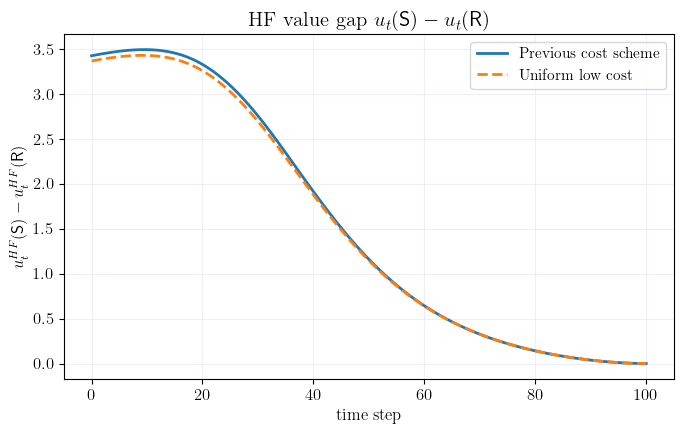

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


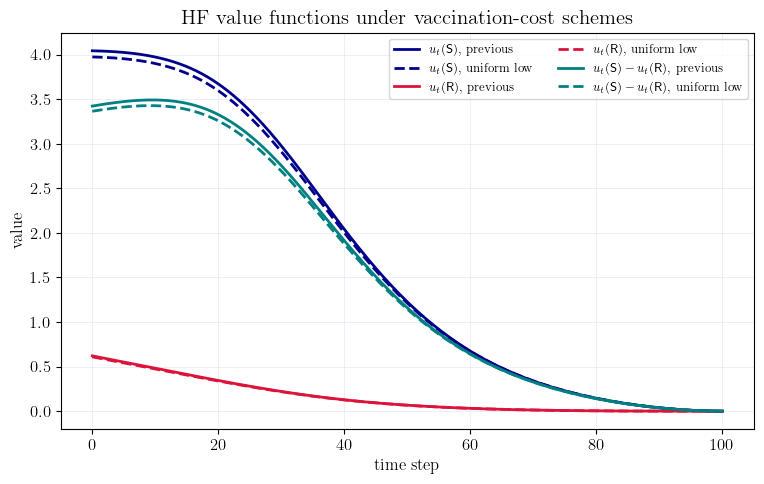

In [1234]:
def get_uS_uR(out, k, n_blocks=6):
    U = out[0]  # after_u
    uS = U[k, :]
    uR = U[2 * n_blocks + k, :]
    return uS, uR, uS - uR

hf_idx = 2
uS_prev, uR_prev, diff_prev = get_uS_uR(cnu_debug[0], hf_idx, n_blocks)
uS_low,  uR_low,  diff_low  = get_uS_uR(cnu_debug[2], hf_idx, n_blocks)

# --------------------------------------------------
# Plot 1: HF comparison of u_S - u_R
# --------------------------------------------------
fig, ax = plt.subplots(1, 1, figsize=(7, 4.5))

ax.plot(t_grid, diff_prev, linestyle='-',  linewidth=2, label='Previous cost scheme')
ax.plot(t_grid, diff_low,  linestyle='--', linewidth=2, label='Uniform low cost')

ax.set_title(r"HF value gap $u_t(\mathsf{S})-u_t(\mathsf{R})$", fontsize=15)
ax.set_xlabel("time step")
ax.set_ylabel(r"$u_t^{HF}(\mathsf{S})-u_t^{HF}(\mathsf{R})$")
ax.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax.legend(fontsize=11)

plt.tight_layout()
plt.savefig("Plots/r7_HF_uS_minus_uR_vacc_cost.eps", bbox_inches='tight', format='eps')
plt.show()

# --------------------------------------------------
# Plot 2: HF comparison of u_S, u_R, and u_S-u_R
# solid = previous, dashed = uniform low
# three colors = u_S, u_R, u_S-u_R
# --------------------------------------------------
fig, ax = plt.subplots(1, 1, figsize=(7.8, 5))

ax.plot(t_grid, uS_prev,   linestyle='-',  linewidth=2, c='darkblue', label=r"$u_t(\mathsf{S})$, previous")
ax.plot(t_grid, uS_low,    linestyle='--', linewidth=2, c='darkblue', label=r"$u_t(\mathsf{S})$, uniform low")

ax.plot(t_grid, uR_prev,   linestyle='-',  linewidth=2, c='crimson', label=r"$u_t(\mathsf{R})$, previous")
ax.plot(t_grid, uR_low,    linestyle='--', linewidth=2, c='crimson', label=r"$u_t(\mathsf{R})$, uniform low")

ax.plot(t_grid, diff_prev, linestyle='-',  linewidth=2, c='teal', label=r"$u_t(\mathsf{S})-u_t(\mathsf{R})$, previous")
ax.plot(t_grid, diff_low,  linestyle='--', linewidth=2, c='teal', label=r"$u_t(\mathsf{S})-u_t(\mathsf{R})$, uniform low")

ax.set_title(r"HF value functions under vaccination-cost schemes", fontsize=15)
ax.set_xlabel("time step")
ax.set_ylabel("value")
ax.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax.legend(fontsize=9, ncol=2)

plt.tight_layout()
plt.savefig("Plots/r7_HF_value_functions_vacc_cost.eps", bbox_inches='tight', format='eps')
plt.show()

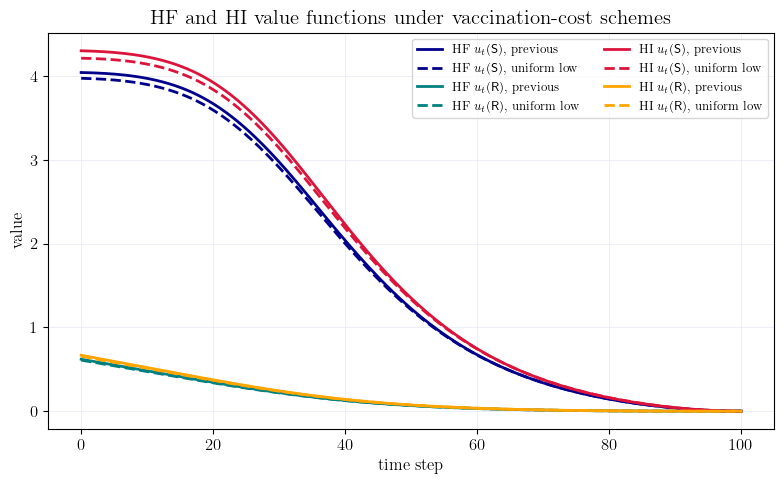

In [ ]:
def get_uS_uR(out, k, n_blocks=6):
    U = out[0]  # after_u
    uS = U[k, :]
    uR = U[2 * n_blocks + k, :]
    return uS, uR

hf_idx = 2
hi_idx = 5

# previous scheme
uS_hf_prev, uR_hf_prev = get_uS_uR(cnu_debug[0], hf_idx, n_blocks)
uS_hi_prev, uR_hi_prev = get_uS_uR(cnu_debug[0], hi_idx, n_blocks)

# uniform low cost scheme
uS_hf_low, uR_hf_low = get_uS_uR(cnu_debug[2], hf_idx, n_blocks)
uS_hi_low, uR_hi_low = get_uS_uR(cnu_debug[2], hi_idx, n_blocks)


fig, ax = plt.subplots(1, 1, figsize=(8, 5))

# HF
ax.plot(t_grid, uS_hf_prev, linestyle='-',  linewidth=2, c='darkblue', label=r'HF $u_t(\mathsf{S})$, previous')
ax.plot(t_grid, uS_hf_low,  linestyle='--', linewidth=2, c='darkblue', label=r'HF $u_t(\mathsf{S})$, uniform low')

ax.plot(t_grid, uR_hf_prev, linestyle='-',  linewidth=2, c='teal', label=r'HF $u_t(\mathsf{R})$, previous')
ax.plot(t_grid, uR_hf_low,  linestyle='--', linewidth=2, c='teal', label=r'HF $u_t(\mathsf{R})$, uniform low')

# HI
ax.plot(t_grid, uS_hi_prev, linestyle='-',  linewidth=2, c='crimson', label=r'HI $u_t(\mathsf{S})$, previous')
ax.plot(t_grid, uS_hi_low,  linestyle='--', linewidth=2, c='crimson', label=r'HI $u_t(\mathsf{S})$, uniform low')

ax.plot(t_grid, uR_hi_prev, linestyle='-',  linewidth=2, c='orange', label=r'HI $u_t(\mathsf{R})$, previous')
ax.plot(t_grid, uR_hi_low,  linestyle='--', linewidth=2, c='orange', label=r'HI $u_t(\mathsf{R})$, uniform low')

ax.set_title(r"HF and HI value functions under vaccination-cost schemes", fontsize=15)
ax.set_xlabel("time step")
ax.set_ylabel("value")
ax.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax.legend(fontsize=9, ncol=2)

plt.tight_layout()
# plt.savefig("Plots/r7_HF_HI_uS_uR_vacc_cost.eps", bbox_inches='tight', format='eps')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


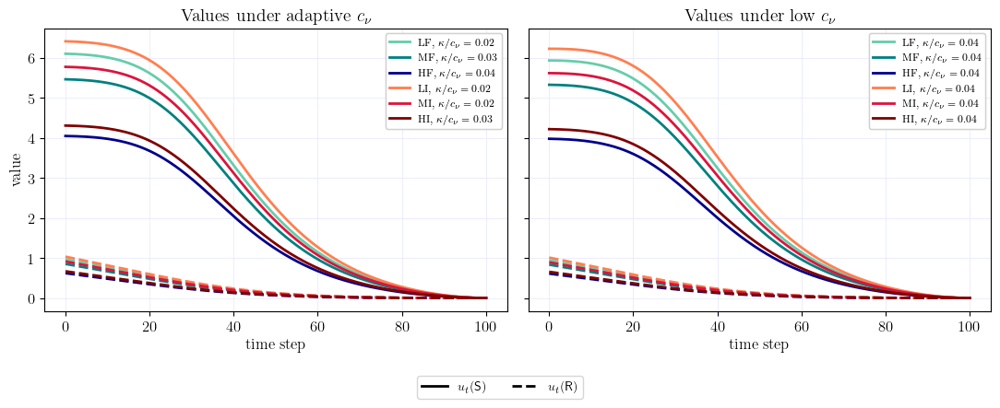

In [1238]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

block_names = ['LF', 'MF', 'HF', 'LI', 'MI', 'HI']

def get_uS_uR(out, k, n_blocks=6):
    U = out[0]
    uS = U[k, :]
    uR = U[2 * n_blocks + k, :]
    return uS, uR

# Make sure these match the actual two c_nu schemes
cnu_prev = np.array([1.4, 1.2, 0.8, 1.6, 1.4, 1.0])
cnu_low  = np.array([0.8] * n_blocks)

outs = [cnu_debug[0], cnu_debug[2]]
cnu_list = [cnu_prev, cnu_low]
titles = [r"Values under adaptive $c_\nu$", r"Values under low $c_\nu$"]

group_colors = colors

fig, axes = plt.subplots(1, 2, figsize=(11, 4.4), sharey=True)

for ax, out, cnu_vals, title in zip(axes, outs, cnu_list, titles):

    group_handles = []

    for k in range(n_blocks):
        uS, uR = get_uS_uR(out, k, n_blocks)
        ratio = kappa[k] / cnu_vals[k]

        ax.plot(
            t_grid, uS,
            color=group_colors[k],
            linestyle='-',
            linewidth=2
        )

        ax.plot(
            t_grid, uR,
            color=group_colors[k],
            linestyle='--',
            linewidth=2
        )

        group_handles.append(
            Line2D(
                [0], [0],
                color=group_colors[k],
                linewidth=2,
                label=rf"{block_names[k]}, $\kappa/c_\nu={ratio:.2f}$"
            )
        )

    ax.set_title(title, fontsize=14)
    ax.set_xlabel("time step")
    ax.grid(True, color='lavender', linestyle='-', linewidth=0.5)

    # group legend inside each panel
    leg1 = ax.legend(
        handles=group_handles,
        loc='upper right',
        fontsize=8,
        frameon=True
    )
    ax.add_artist(leg1)

axes[0].set_ylabel("value")

# line-style legend, shared by both panels
style_handles = [
    Line2D([0], [0], color='black', linestyle='-', linewidth=2,
           label=r"$u_t(\mathsf{S})$"),
    Line2D([0], [0], color='black', linestyle='--', linewidth=2,
           label=r"$u_t(\mathsf{R})$")
]

fig.legend(
    handles=style_handles,
    loc='lower center',
    ncol=2,
    fontsize=10,
    frameon=True,
    bbox_to_anchor=(0.5, -0.02)
)

plt.tight_layout(rect=[0, 0.07, 1, 1])
plt.savefig("Plots/r7_all_groups_uS_uR.eps", bbox_inches='tight', format='eps')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


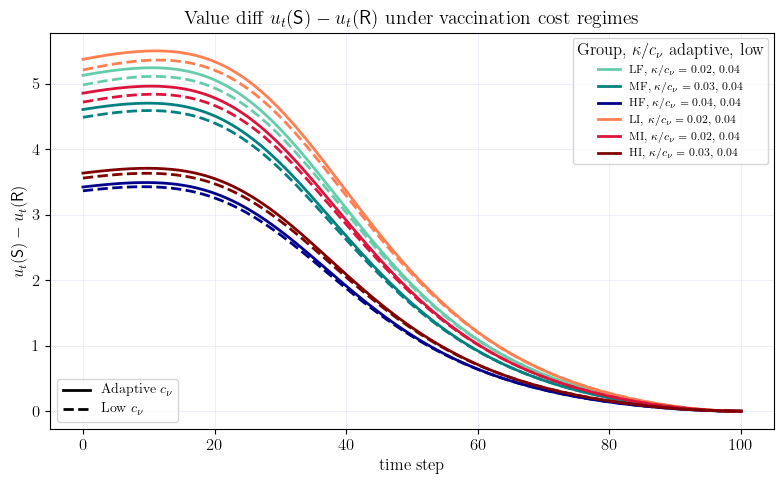

In [1240]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

block_names = ['LF', 'MF', 'HF', 'LI', 'MI', 'HI']

def get_uS_minus_uR(out, k, n_blocks=6):
    U = out[0]
    uS = U[k, :]
    uR = U[2 * n_blocks + k, :]
    return uS - uR

# Make sure these match the actual two c_nu schemes
cnu_adaptive = np.array([1.4, 1.2, 0.8, 1.6, 1.4, 1.0])
cnu_low      = np.array([0.8] * n_blocks)

out_adaptive = cnu_debug[0]
out_low      = cnu_debug[2]

fig, ax = plt.subplots(1, 1, figsize=(8, 5))

group_handles = []

for k in range(n_blocks):

    diff_adaptive = get_uS_minus_uR(out_adaptive, k, n_blocks)
    diff_low      = get_uS_minus_uR(out_low, k, n_blocks)

    ax.plot(
        t_grid,
        diff_adaptive,
        color=colors[k],
        linestyle='-',
        linewidth=2
    )

    ax.plot(
        t_grid,
        diff_low,
        color=colors[k],
        linestyle='--',
        linewidth=2
    )

    ratio_adaptive = kappa[k] / cnu_adaptive[k]
    ratio_low = kappa[k] / cnu_low[k]

    group_handles.append(
        Line2D(
            [0], [0],
            color=colors[k],
            linewidth=2,
            label=rf"{block_names[k]}, "
                  rf"$\kappa/c_\nu={ratio_adaptive:.2f}$, ${ratio_low:.2f}$"
        )
    )

ax.set_title(
    r"Value diff $u_t(\mathsf{S})-u_t(\mathsf{R})$ under vaccination cost regimes",
    fontsize=14
)
ax.set_xlabel("time step")
ax.set_ylabel(r"$u_t(\mathsf{S})-u_t(\mathsf{R})$")
ax.grid(True, color='lavender', linestyle='-', linewidth=0.5)

# Group color legend
leg1 = ax.legend(
    handles=group_handles,
    loc='upper right',
    fontsize=8,
    frameon=True,
    title=r"Group, $\kappa/c_\nu$ adaptive, low"
)
ax.add_artist(leg1)

# Line-style legend
style_handles = [
    Line2D([0], [0], color='black', linestyle='-', linewidth=2,
           label=r"Adaptive $c_\nu$"),
    Line2D([0], [0], color='black', linestyle='--', linewidth=2,
           label=r"Low $c_\nu$")
]

ax.legend(
    handles=style_handles,
    loc='lower left',
    fontsize=10,
    frameon=True
)

plt.tight_layout()
plt.savefig(
    "Plots/r7_all_groups_uS_minus_uR.eps",
    bbox_inches='tight',
    format='eps'
)
plt.show()

## R8: check tradeoff on key model params

sweep strict_lambda: 100%|██████████| 9/9 [00:29<00:00,  3.24s/it]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


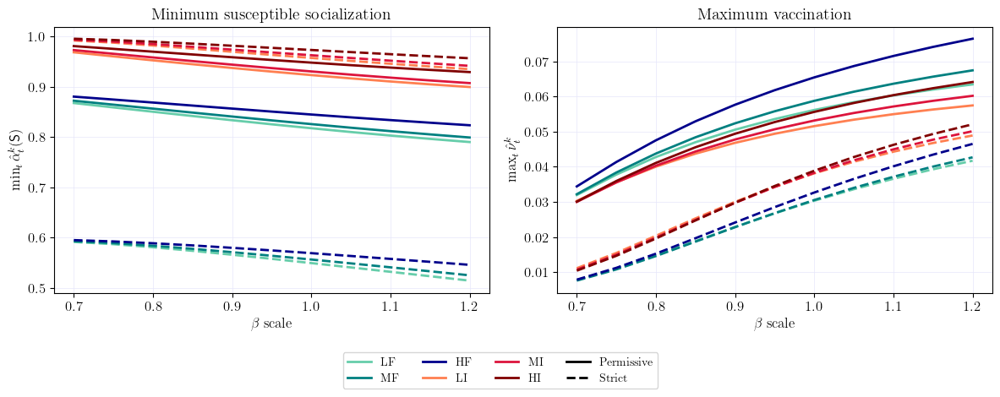

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


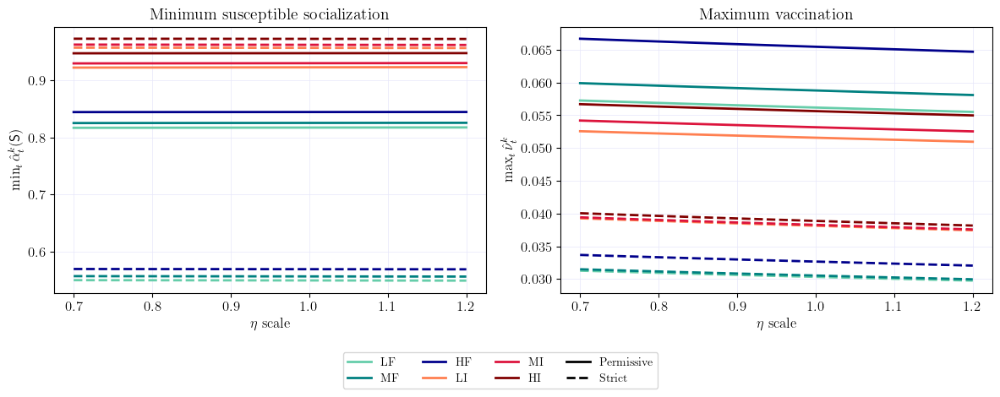

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


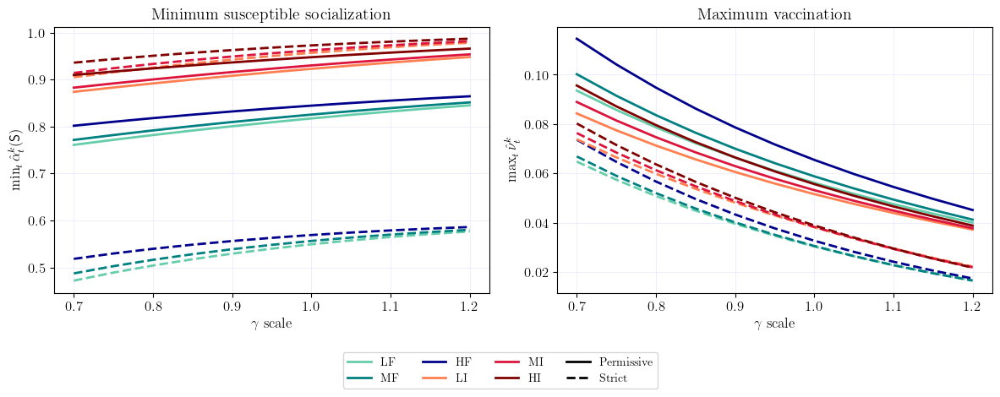

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


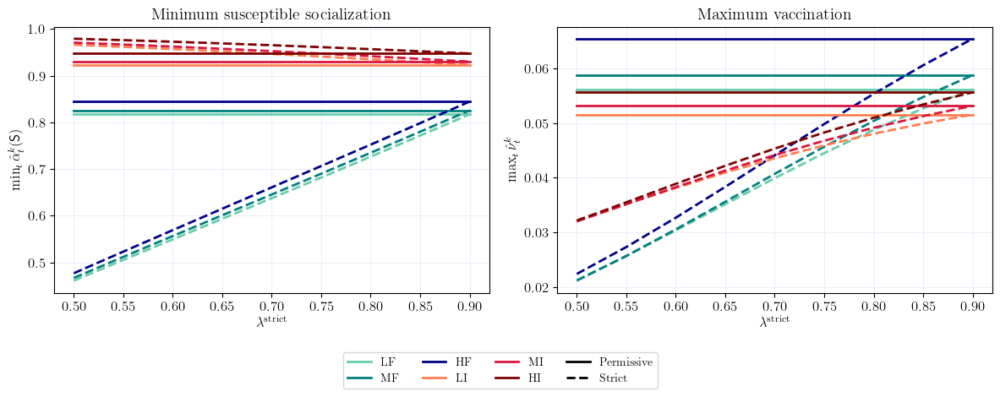

In [1100]:
block_names = ['LF', 'MF', 'HF', 'LI', 'MI', 'HI']

# --------------------------------------------------
# Policies
# --------------------------------------------------
permissive_policy = (
    [0.9] * n_blocks,
    [0.9] * n_blocks,
    [0.9] * n_blocks
)

strict_policy = (
    [0.6] * n_blocks,
    [0.6] * n_blocks,
    [0.6] * n_blocks
)

def make_policy(lambda_value):
    return (
        [lambda_value] * n_blocks,
        [lambda_value] * n_blocks,
        [lambda_value] * n_blocks
    )

# --------------------------------------------------
# Helper: run one equilibrium
# --------------------------------------------------
def run_one(policy, beta_tmp, eta_tmp, gamma_tmp, tag):
    lambda_s_tmp, lambda_i_tmp, lambda_r_tmp = policy

    with contextlib.redirect_stdout(io.StringIO()):
        out = stoch_block_fixed(
            n_blocks, n_states, Nt,
            lambda_s_tmp, lambda_i_tmp, lambda_r_tmp,
            graphon,
            beta_tmp, kappa, gamma_tmp, rho,
            c_lambda, c_inf, c_dead, c_nu, xi_i, eta_tmp,
            t_grid, T, p_0, u_T, n_print,
            tag,
            block_dens, lambda_type, lambda_duration, death
        )
    return out

# --------------------------------------------------
# Sweep runner
# For each sweep value, store:
#   - permissive min alpha(S), max nu
#   - strict     min alpha(S), max nu
# --------------------------------------------------
def run_policy_sweep(sweep_name, sweep_values, update_params_func):
    rows = []

    min_alpha_perm = np.zeros((len(sweep_values), n_blocks))
    min_alpha_strict = np.zeros((len(sweep_values), n_blocks))
    max_nu_perm = np.zeros((len(sweep_values), n_blocks))
    max_nu_strict = np.zeros((len(sweep_values), n_blocks))

    debug = {}

    for idx, val in enumerate(tqdm(sweep_values, desc=f"sweep {sweep_name}")):
        beta_tmp, eta_tmp, gamma_tmp, perm_policy_tmp, strict_policy_tmp = update_params_func(val)

        out_perm = run_one(
            perm_policy_tmp,
            beta_tmp, eta_tmp, gamma_tmp,
            f"Mar{date}_{sweep_name}_{val:.3f}_Permissive"
        )

        out_strict = run_one(
            strict_policy_tmp,
            beta_tmp, eta_tmp, gamma_tmp,
            f"Mar{date}_{sweep_name}_{val:.3f}_Strict"
        )

        min_alpha_perm[idx, :]   = np.min(out_perm[2], axis=1)
        min_alpha_strict[idx, :] = np.min(out_strict[2], axis=1)

        max_nu_perm[idx, :]   = np.max(out_perm[5], axis=1)
        max_nu_strict[idx, :] = np.max(out_strict[5], axis=1)

        debug[val] = {
            "permissive": out_perm,
            "strict": out_strict
        }

        row = {"sweep": sweep_name, "value": val}
        for k, name in enumerate(block_names):
            row[f"{name}_alpha_perm"] = min_alpha_perm[idx, k]
            row[f"{name}_alpha_strict"] = min_alpha_strict[idx, k]
            row[f"{name}_nu_perm"] = max_nu_perm[idx, k]
            row[f"{name}_nu_strict"] = max_nu_strict[idx, k]
        rows.append(row)

    summary_df = pd.DataFrame(rows)

    return {
        "name": sweep_name,
        "values": np.asarray(sweep_values),
        "min_alpha_perm": min_alpha_perm,
        "min_alpha_strict": min_alpha_strict,
        "max_nu_perm": max_nu_perm,
        "max_nu_strict": max_nu_strict,
        "debug": debug,
        "summary": summary_df
    }

# --------------------------------------------------
# Sweep ranges
# You can change these if needed
# --------------------------------------------------
beta_scale_sweep  = np.linspace(0.7, 1.2, 11)
eta_scale_sweep   = np.linspace(0.7, 1.2, 11)
gamma_scale_sweep = np.linspace(0.7, 1.2, 11)

# permissive fixed at 0.9; vary strict guideline value
# 0.6 is included
lambda_strict_sweep = np.linspace(0.5, 0.9, 9)

# --------------------------------------------------
# Run all four sweeps
# --------------------------------------------------
policy_sweep_results = {}

policy_sweep_results["beta"] = run_policy_sweep(
    "beta_scale",
    beta_scale_sweep,
    lambda s: (
        s * np.asarray(beta),
        np.asarray(eta),
        np.asarray(gamma),
        permissive_policy,
        strict_policy
    )
)

policy_sweep_results["eta"] = run_policy_sweep(
    "eta_scale",
    eta_scale_sweep,
    lambda s: (
        np.asarray(beta),
        s * np.asarray(eta),
        np.asarray(gamma),
        permissive_policy,
        strict_policy
    )
)

policy_sweep_results["gamma"] = run_policy_sweep(
    "gamma_scale",
    gamma_scale_sweep,
    lambda s: (
        np.asarray(beta),
        np.asarray(eta),
        s * np.asarray(gamma),
        permissive_policy,
        strict_policy
    )
)

policy_sweep_results["lambda"] = run_policy_sweep(
    "strict_lambda",
    lambda_strict_sweep,
    lambda lam: (
        np.asarray(beta),
        np.asarray(eta),
        np.asarray(gamma),
        permissive_policy,
        make_policy(lam)
    )
)

# Save all summaries
policy_sweep_summary_all = pd.concat(
    [policy_sweep_results[k]["summary"] for k in policy_sweep_results],
    ignore_index=True
)
policy_sweep_summary_all.to_csv(
    "Tables/policy_sensitivity_beta_eta_gamma_lambda.csv",
    index=False
)

# --------------------------------------------------
# Plotting function:
# one figure per sweep
# left: minimum socialization
# right: maximum vaccination
# solid = permissive
# dashed = strict
# --------------------------------------------------
def plot_policy_sweep_figure(res, xlabel, figure_title, save_title):
    xvals = res["values"]

    fig, axes = plt.subplots(1, 2, figsize=(12, 4.8), sharex=True)

    # -------------------------
    # Left panel: socialization
    # -------------------------
    for k in range(n_blocks):
        axes[0].plot(
            xvals,
            res["min_alpha_perm"][:, k],
            color=colors[k],
            linestyle='-',
            linewidth=2
        )
        axes[0].plot(
            xvals,
            res["min_alpha_strict"][:, k],
            color=colors[k],
            linestyle='--',
            linewidth=2
        )

    axes[0].set_title("Minimum susceptible socialization", fontsize=14)
    axes[0].set_xlabel(xlabel)
    axes[0].set_ylabel(r'$\min_t \hat{\alpha}_t^k(\mathsf{S})$')
    axes[0].grid(True, color='lavender', linestyle='-', linewidth=0.5)

    # -------------------------
    # Right panel: vaccination
    # -------------------------
    for k in range(n_blocks):
        axes[1].plot(
            xvals,
            res["max_nu_perm"][:, k],
            color=colors[k],
            linestyle='-',
            linewidth=2
        )
        axes[1].plot(
            xvals,
            res["max_nu_strict"][:, k],
            color=colors[k],
            linestyle='--',
            linewidth=2
        )

    axes[1].set_title("Maximum vaccination", fontsize=14)
    axes[1].set_xlabel(xlabel)
    axes[1].set_ylabel(r'$\max_t \hat{\nu}_t^k$')
    axes[1].grid(True, color='lavender', linestyle='-', linewidth=0.5)

    # -------------------------
    # Legends
    # -------------------------
    group_handles = [
        Line2D([0], [0], color=colors[k], linewidth=2, label=block_names[k])
        for k in range(n_blocks)
    ]
    policy_handles = [
        Line2D([0], [0], color='black', linestyle='-', linewidth=2, label='Permissive'),
        Line2D([0], [0], color='black', linestyle='--', linewidth=2, label='Strict')
    ]

    fig.legend(
        handles=group_handles + policy_handles,
        loc='lower center',
        ncol=4,
        frameon=True,
        fontsize=10,
        bbox_to_anchor=(0.5, -0.04)
    )
    if figure_title == None: 
        plt.tight_layout(rect=[0, 0.08, 1, 0.95])
    else:
        fig.suptitle(figure_title, fontsize=15)
        plt.tight_layout(rect=[0, 0.08, 1, 0.95])
    plt.savefig(f"Plots/{save_title}.eps", bbox_inches='tight', format='eps')
    plt.show()

# --------------------------------------------------
# Make four separate figures
# --------------------------------------------------
plot_policy_sweep_figure(
    policy_sweep_results["beta"],
    xlabel=r'$\beta$ scale',
    figure_title=None,
    save_title='r8_tradeoff_beta'
)

plot_policy_sweep_figure(
    policy_sweep_results["eta"],
    xlabel=r'$\eta$ scale',
    figure_title=None,
    save_title='r8_tradeoff_eta'
)

plot_policy_sweep_figure(
    policy_sweep_results["gamma"],
    xlabel=r'$\gamma$ scale',
    figure_title=None,
    save_title='r8_tradeoff_gamma'
)

plot_policy_sweep_figure(
    policy_sweep_results["lambda"],
    xlabel=r'$\lambda^{\mathrm{strict}}$',
    figure_title=None,
    save_title='r8_tradeoff_lambda'
)

### R10: infection cost grid search

In [1243]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import contextlib, io, os

os.makedirs("Plots", exist_ok=True)

# --------------------------------------------------
# Sensitivity analysis for infection cost c_I
# Group order: ['LF', 'MF', 'HF', 'LI', 'MI', 'HI']
# c_I^LF = c_I^LI = 1 + x
# c_I^MF = c_I^MI = 1
# c_I^HF = c_I^HI = 1 - 4x
# --------------------------------------------------

x_sweep = np.linspace(0.0, 0.1, 21)

ci_debug = {}

peak_pI = np.zeros((len(x_sweep), n_blocks))
min_alp = np.zeros((len(x_sweep), n_blocks))
peak_nu = np.zeros((len(x_sweep), n_blocks))
cum_I   = np.zeros(len(x_sweep))

for xi, x in enumerate(tqdm(x_sweep, desc="grid search over c_I")):

    c_inf_tmp = np.array([
        1.0 + x,      # LF
        1.0,          # MF
        1.0 - 4.0*x,  # HF
        1.0 + x,      # LI
        1.0,          # MI
        1.0 - 4.0*x   # HI
    ])

    with contextlib.redirect_stdout(io.StringIO()):
        out = stoch_block_fixed(
            n_blocks, n_states, Nt,
            lambda_s_in, lambda_i_in, lambda_r_in,
            graphon,
            beta, kappa, gamma, rho,
            c_lambda, c_inf_tmp, c_dead, c_nu, xi_i, eta,
            t_grid, T, p_0, u_T, n_print,
            f"Mar{date}_cI_x{x:.3f}",
            block_dens, lambda_type, lambda_duration, death
        )

    ci_debug[x] = out

    # per-block summaries
    peak_pI[xi, :] = np.max(out[1][6:12, :], axis=1)
    min_alp[xi, :] = np.min(out[2], axis=1)
    peak_nu[xi, :] = np.max(out[5], axis=1)

    # population-weighted cumulative infection
    bd = np.asarray(block_dens)
    I_total = np.sum(bd[:, None] * out[1][6:12, :], axis=0)
    cum_I[xi] = np.trapz(I_total, t_grid)

print("c_I sensitivity done.")

grid search over c_I: 100%|██████████| 21/21 [00:23<00:00,  1.13s/it]

c_I sensitivity done.


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


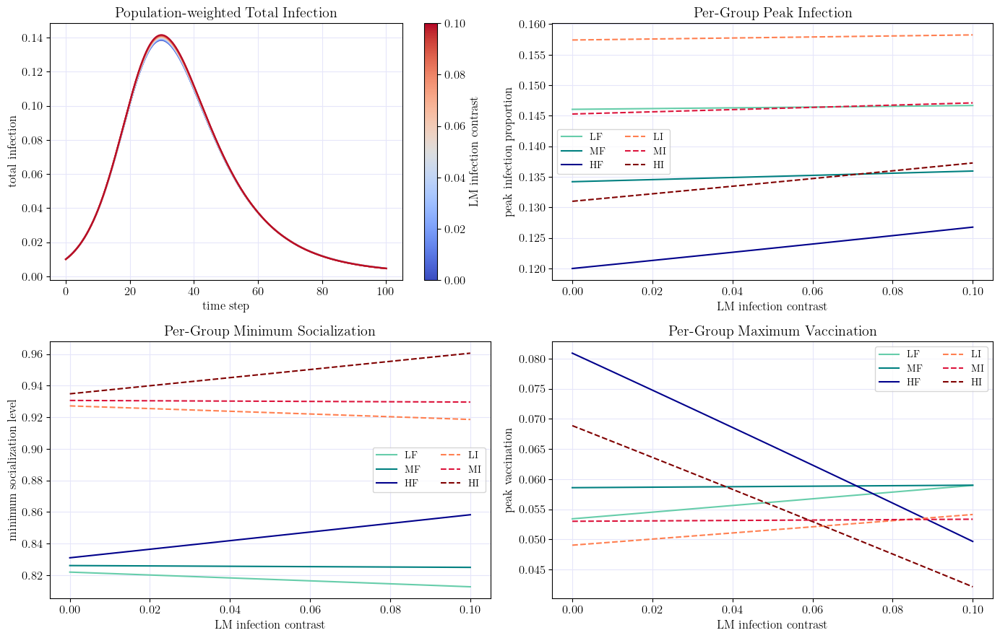

In [1247]:
# --------------------------------------------------
# Visualization
# --------------------------------------------------

cmap_x = plt.cm.coolwarm
x_colors = [cmap_x(i / (len(x_sweep) - 1)) for i in range(len(x_sweep))]

fig, axes = plt.subplots(2, 2, figsize=(14, 9))
# fig.suptitle(r"Revision plot: sensitivity analysis on infection cost $c_{\mathsf I}$", fontsize=13)

# top left: population-weighted total I(t)
for xi, x in enumerate(x_sweep):
    out = ci_debug[x]
    bd = np.asarray(block_dens)
    I_total = np.sum(bd[:, None] * out[1][6:12, :], axis=0)

    axes[0,0].plot(
        t_grid,
        I_total,
        color=x_colors[xi],
        alpha=0.85
    )

axes[0,0].set_xlabel("time step")
axes[0,0].set_ylabel("total infection")
axes[0,0].set_title("Population-weighted Total Infection")
axes[0,0].grid(True, color="lavender")

sm0 = plt.cm.ScalarMappable(
    cmap=cmap_x,
    norm=plt.Normalize(x_sweep[0], x_sweep[-1])
)
sm0.set_array([])
plt.colorbar(sm0, ax=axes[0,0], label="LM infection contrast")

inc_labels_short = ["L", "M", "H"]

# top right: per-block peak infection
for k in range(3):
    axes[0,1].plot(
        x_sweep,
        peak_pI[:, k],
        "-",
        ms=4,
        color=_fol_colors[k],
        label=f"{inc_labels_short[k]}F"
    )

for k in range(3):
    axes[0,1].plot(
        x_sweep,
        peak_pI[:, k+3],
        "--",
        ms=4,
        color=_ind_colors[k],
        label=f"{inc_labels_short[k]}I"
    )

axes[0,1].set_xlabel("LM infection contrast")
axes[0,1].set_ylabel("peak infection proportion")
axes[0,1].set_title("Per-Group Peak Infection")
axes[0,1].legend(fontsize=10, ncol=2)
axes[0,1].grid(True, color="lavender")

# bottom left: per-block minimum socialization
for k in range(3):
    axes[1,0].plot(
        x_sweep,
        min_alp[:, k],
        "-",
        ms=4,
        color=_fol_colors[k],
        label=f"{inc_labels_short[k]}F"
    )

for k in range(3):
    axes[1,0].plot(
        x_sweep,
        min_alp[:, k+3],
        "--",
        ms=4,
        color=_ind_colors[k],
        label=f"{inc_labels_short[k]}I"
    )

axes[1,0].set_xlabel("LM infection contrast")
axes[1,0].set_ylabel(r"minimum socialization level")
axes[1,0].set_title(r"Per-Group Minimum Socialization")
axes[1,0].legend(fontsize=10, ncol=2)
axes[1,0].grid(True, color="lavender")

# bottom right: per-block peak vaccination
for k in range(3):
    axes[1,1].plot(
        x_sweep,
        peak_nu[:, k],
        "-",
        ms=4,
        color=_fol_colors[k],
        label=f"{inc_labels_short[k]}F"
    )

for k in range(3):
    axes[1,1].plot(
        x_sweep,
        peak_nu[:, k+3],
        "--",
        ms=4,
        color=_ind_colors[k],
        label=f"{inc_labels_short[k]}I"
    )

axes[1,1].set_xlabel("LM infection contrast")
axes[1,1].set_ylabel("peak vaccination")
axes[1,1].set_title("Per-Group Maximum Vaccination")
axes[1,1].legend(fontsize=10, ncol=2)
axes[1,1].grid(True, color="lavender")

plt.tight_layout()
plt.savefig("Plots/r10_cI_sensitivity_1.eps", bbox_inches="tight", format="eps")
plt.show()

### G7: Half indifference+Half follower vs. Full follower

In [1553]:
def initializer_cdc(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, lambda_type, lambda_duration):
    before_p =  np.tile(p_0, Nt)
    before_u = np.zeros((n_blocks*n_states, Nt)) 
    if lambda_type == 0: #same for every block time independent
        lambda_s = np.tile(lambda_s_in, n_blocks) #format: [lambda_s_in, lambda_s_in, ...], n_blocks = 6 
        lambda_i = np.tile(lambda_i_in, n_blocks)
        lambda_r = np.tile(lambda_r_in, n_blocks)
    if lambda_type == 1: #different for each block time independent
        lambda_s = lambda_s_in #format: [1, 1, 1]
        lambda_i = lambda_i_in
        lambda_r = lambda_r_in
    if lambda_type == 2: #different for each block time dependent       
        lambda_s = np.repeat(lambda_s_in, lambda_duration[0].astype(int), axis=1) #format[1,1,1,...,3,3,3];
        lambda_i = np.repeat(lambda_i_in, lambda_duration[1].astype(int), axis=1) #format[1,1,1,...,3,3,3];
        lambda_r = np.repeat(lambda_r_in, lambda_duration[2].astype(int), axis=1) #format[1,1,1,...,3,3,3];
    return (before_p, before_u, lambda_s, lambda_i, lambda_r)    

def Z_calculator_cdc(n_blocks, block_dens, lambda_i, graphon, p, lambda_type):
    if (lambda_type==0 or lambda_type==1):
        i_control = lambda_i # np.concatenate((lambda_i[:n_blocks_half], np.repeat(xi_i, n_blocks_half)))
        Z = np.matmul(graphon, np.multiply(np.reshape(np.multiply(block_dens, i_control), (n_blocks,1)),p[n_blocks:2*n_blocks,:]))
    return Z 

def opt_control_calculator_cdc(lambda_s, lambda_i, lambda_r, beta, c_lambda, c_nu, Z, u, n_blocks, lambda_type, kappa):
    # it seems kappa and beta also a (6,1) vector, xi_i is a scalar
    # n_blocks_half = n_blocks // 2
    if (lambda_type==0 or lambda_type==1):
        # followers, each of which is shape (3,1)
        alpha_s = np.reshape(lambda_s[:n_blocks], (n_blocks,1)) + np.reshape(beta[:n_blocks]/(2*c_lambda[:n_blocks]),(n_blocks,1)) * Z[:n_blocks, :] * (u[0:n_blocks,:]-u[n_blocks:2*n_blocks,:])
        alpha_i = np.tile(np.reshape(lambda_i[:n_blocks],(n_blocks,1)),Nt)
        alpha_r = np.tile(np.reshape(lambda_r[:n_blocks],(n_blocks,1)),Nt)
        nu      = np.reshape(kappa[:n_blocks]/(2*c_nu[:n_blocks]),(n_blocks,1)) * (u[0:n_blocks,:]-u[2*n_blocks:3*n_blocks,:])
    if lambda_type==2:
        # not editted
        alpha_s = lambda_s + np.reshape(beta/c_lambda,(n_blocks,1)) * Z * (u[0:n_blocks,:]-u[n_blocks:2*n_blocks,:])
        alpha_i = lambda_i
        alpha_r = lambda_r
        nu      = np.reshape(kappa/(2*c_lambda),(n_blocks,1)) * (u[0:n_blocks,:]-u[2*n_blocks:3*n_blocks,:])
    return (alpha_s, alpha_i, alpha_r, nu)

def rate_ODE_p_cdc(t, p, death, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, rho, n_states, n_blocks, eta):
    alpha_s = inter_alpha_s(t)
    nu      = inter_nu(t)
    Z = inter_Z(t)
    rate_p_S = -beta*alpha_s*Z*p[0:n_blocks]- kappa * nu * p[0:n_blocks] + eta * p[2*n_blocks:3*n_blocks]
    # p[(n_states-1)*n_blocks:n_states*n_blocks]
    rate_p_I = beta*alpha_s*Z*p[0:n_blocks] - gamma * p[n_blocks:2*n_blocks]
    rate = []
    for k in np.arange(n_blocks):
        rate=np.append(rate, rate_p_S[k])
    for k in np.arange(n_blocks):
        rate=np.append(rate, rate_p_I[k])  
    if death==0:
        rate_p_R = gamma * p[n_blocks:2*n_blocks] + kappa * nu * p[0:n_blocks] - eta * p[2*n_blocks:3*n_blocks]
        for k in np.arange(n_blocks):
            rate=np.append(rate, rate_p_R[k])
    # not editted   
    if death==1:
        rate_p_R = rho * gamma * p[n_blocks:2*n_blocks] - kappa * p[(n_states-1)*n_blocks:n_states*n_blocks]
        rate_p_D = (1-rho) * gamma * p[n_blocks:2*n_blocks]
        for k in np.arange(n_blocks):
            rate=np.append(rate, rate_p_R[k]) 
        for k in np.arange(n_blocks):
            rate=np.append(rate, rate_p_D[k])             
    return rate


def solver_KFP_cdc(death, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, rho, eta, n_states, n_blocks, p_0, t_grid, T):
    sol_p = solve_ivp(rate_ODE_p_cdc, [0,T], p_0, t_eval = t_grid, args = (death, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, rho, n_states, n_blocks, eta))    
    p = sol_p.y
    return p

def rate_ODE_u_cdc(t, u, death, lambda_type, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, lambda_s, c_lambda, c_inf, c_dead, c_nu, n_blocks, eta):
    # n_blocks_half = n_blocks // 2
    Z  = inter_Z(t) 
    nu = inter_nu(t)
    alpha_s = inter_alpha_s(t)
    if lambda_type==2:
        lambda_s = lambda_s(t)
    rate_u_S = beta[0:n_blocks] * alpha_s[0:n_blocks] * Z[0:n_blocks] * (u[0:n_blocks]-u[n_blocks:2*n_blocks]) - c_lambda[0:n_blocks]*((lambda_s[0:n_blocks]-alpha_s[0:n_blocks])**2) + kappa[0:n_blocks]*nu[0:n_blocks]*(u[0:n_blocks]-u[2*n_blocks:3*n_blocks]) - c_nu[0:n_blocks]*((nu[0:n_blocks])**2)
    rate_u_I = -(gamma * (u[2*n_blocks:3*n_blocks]- u[n_blocks:2*n_blocks]) + c_inf)
    rate = []
    for k in np.arange(n_blocks):
        rate=np.append(rate, rate_u_S[k])
    for k in np.arange(n_blocks):
        rate=np.append(rate, rate_u_I[k]) 
    if death==0:
        rate_u_R = eta * (u[2*n_blocks:3*n_blocks] - u[0:n_blocks])
        for k in np.arange(n_blocks):
            rate=np.append(rate, rate_u_R[k])   
    # not editted     
    if death==1:   
        rate_u_R = -gamma*(kappa*(u[0:n_blocks] - u[2*n_blocks:3*n_blocks]))
        rate_u_D = - c_dead * np.ones((n_blocks))
        for k in np.arange(n_blocks):
            rate=np.append(rate, rate_u_R[k])  
        for k in np.arange(n_blocks):
            rate=np.append(rate, rate_u_D[k])  
    return rate


def solver_HJB_cdc(death, lambda_type, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, lambda_s, c_lambda, c_inf, c_dead, c_nu, eta, n_blocks, u_T, t_grid, T):
    backward_t_grid = T-t_grid
    sol_u = solve_ivp(rate_ODE_u_cdc, [T, 0], u_T, t_eval = backward_t_grid, \
                  args = (death, lambda_type, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, lambda_s, c_lambda, c_inf, c_dead, c_nu, n_blocks, eta)) 
    u = sol_u.y
    return np.flip(u,axis=1)

In [1554]:
def stoch_block_fixed_cdc(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                      graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta, \
                      t_grid, T, p_0, u_T, n_print, exp_id, block_dens, lambda_type, lambda_duration, death):
    if (lambda_type==0 or lambda_type==1):
        before_p, before_u, lambda_s, lambda_i, lambda_r  =  initializer_cdc(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, lambda_type, lambda_duration)
        Z = Z_calculator_cdc(n_blocks, block_dens, lambda_i, graphon, before_p, lambda_type)
        inter_Z = interp1d(t_grid, Z)
        alpha_s, alpha_i, alpha_r, nu = opt_control_calculator_cdc(lambda_s, lambda_i, lambda_r, beta, c_lambda, c_nu, Z, before_u, n_blocks, lambda_type, kappa)
        inter_alpha_s = interp1d(t_grid, alpha_s)
        inter_nu      = interp1d(t_grid, nu)
        after_p = solver_KFP_cdc(death, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, rho, eta, n_states, n_blocks, np.reshape(p_0,(n_blocks*n_states)), t_grid, T)
        after_u = solver_HJB_cdc(death, lambda_type, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, lambda_s, c_lambda, c_inf, c_dead, c_nu, eta, n_blocks, np.reshape(u_T,(n_blocks*n_states)), t_grid, T)
        convergence_p = la.norm(after_p - before_p)
        convergence_u = la.norm(after_u - before_u)
        i=0
        print("iter: ", i, "p conv: ", convergence_p, "u conv:", convergence_u)
        while ((la.norm(after_p - before_p) > epsilon) or (la.norm(after_u - before_u) > epsilon)):
            Z = Z_calculator_cdc(n_blocks, block_dens, lambda_i, graphon, after_p, lambda_type)
            inter_Z = interp1d(t_grid, Z)
            alpha_s, alpha_i, alpha_r, nu = opt_control_calculator_cdc(lambda_s, lambda_i, lambda_r, beta, c_lambda, c_nu, Z, after_u, n_blocks, lambda_type, kappa)
            inter_alpha_s = interp1d(t_grid, alpha_s)
            inter_nu      = interp1d(t_grid, nu)
            before_p = after_p.copy()
            before_u = after_u.copy()
            after_p = solver_KFP_cdc(death, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, rho, eta, n_states, n_blocks, np.reshape(p_0,(n_blocks*n_states)), t_grid, T)
            after_u = solver_HJB_cdc(death, lambda_type, inter_alpha_s, inter_Z, inter_nu, beta, kappa, gamma, lambda_s, c_lambda, c_inf, c_dead, c_nu, eta, n_blocks, np.reshape(u_T,(n_blocks*n_states)), t_grid, T)
            convergence_p = np.append(convergence_p, la.norm(after_p - before_p))
            convergence_u = np.append(convergence_u, la.norm(after_u - before_u))  
            i +=1
            if i % n_print == 0:
                print("iter: ", i, "p conv: ", convergence_p[-1], "u conv:", convergence_u[-1])      
    return (after_u, after_p, alpha_s, alpha_i, alpha_r, nu, Z, convergence_p, convergence_u)        
        

In [1555]:
# mixed population
diff_indiff_debug = {}
lambda_s_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_i_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
lambda_r_in = [0.9, 0.9, 0.9, 0.9, 0.9, 0.9]
xi_i = 0.97
graphon = np.array([[1.0, 0.95, 0.95, 0.95, 0.9, 0.9],
                    [0.95, 1.0, 0.95, 0.9, 0.95, 0.9],
                    [0.95, 0.95, 1.0, 0.9, 0.9, 0.95],
                    [0.95, 0.9, 0.9, 1.0, 0.95, 0.95],
                    [0.9, 0.95, 0.9, 0.95, 1.0, 0.95],
                    [0.9, 0.9, 0.95, 0.95, 0.95, 1.0]])

diff_indiff_debug[0] = stoch_block_fixed(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  45.10239253946166 u conv: 1588.0928125140915
iter:  10 p conv:  0.8379413840109882 u conv: 9.32268298986906
iter:  20 p conv:  0.0008195564047341369 u conv: 0.02007259540929142
iter:  30 p conv:  1.982213586073193e-07 u conv: 2.4061124740224128e-06


In [1556]:
n_blocks = 3

beta = np.array([0.4, 0.35, 0.3])
# kappa = np.array([0.2, 0.2, 0.2, 0.2, 0.2, 0.2])
kappa = np.array([0.03, 0.03, 0.03])
gamma = np.array([1/7, 1/7, 1/7])
eta = np.array([1/250, 1/250, 1/250])

block_dens = [0.1473 + 0.1751, 0.1509 + 0.1655, 0.1859 + 0.1753]
c_inf = np.array([1.05, 1, 0.8])
c_nu = np.array([1.5, 1.3, 0.9]) # np.array([1.4, 1.2, 0.8, 1.6, 1.4, 1.0])
c_lambda = np.array([1., 1., 1.]) # np.array([0.9, 1., 1.1, 0.9, 1., 1.1])
xi_i = 0.97

p_0 = np.array([[0.99], [0.99], [0.99], 
                [0.01], [0.01], [0.01], 
                [0.00], [0.00], [0.00]])
u_T = np.array([[0], [0], [0],
                [0], [0], [0],
                [0], [0], [0]])
lambda_type =1 #Block specific lambdas
death = 0 # death not included
#unused ones
c_dead = np.array([1., 1.]) 
rho = np.array([1.0, 1.0])

graphon = np.array([[1.0, 0.925, 0.925],
                    [0.925, 1.0, 0.925],
                    [0.925, 0.925, 1.0]])

lambda_s_in = [0.9, 0.9, 0.9]
lambda_i_in = [0.9, 0.9, 0.9]
lambda_r_in = [0.9, 0.9, 0.9]

In [1557]:
diff_indiff_debug[1] = stoch_block_fixed_cdc(n_blocks, n_states, Nt, lambda_s_in, lambda_i_in, lambda_r_in, \
                  graphon, beta, kappa, gamma, rho, c_lambda, c_inf, c_dead, c_nu, xi_i, eta,\
                  t_grid, T, p_0, u_T, n_print, 'Mar{date}_Exp_{id_}'.format(date=date, id_=i), \
                  block_dens, lambda_type, lambda_duration, death)

iter:  0 p conv:  29.547419706651564 u conv: 1120.1093123072835
iter:  10 p conv:  0.7930214897743932 u conv: 4.6261903920331084
iter:  20 p conv:  0.001515754782094715 u conv: 0.011748316672350222
iter:  30 p conv:  2.568693706872801e-06 u conv: 1.618379551799271e-05


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


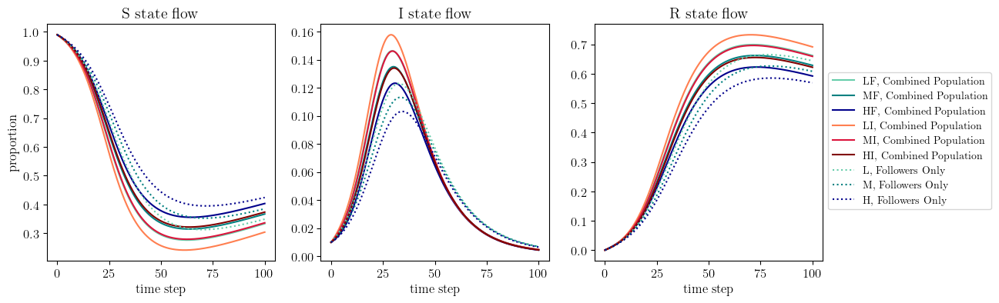

In [1558]:
fig, ax= plt.subplots(1, 3, figsize=(13, 4))
n_candidates = 1#len(kappa_debug)

j = 0
for i in np.arange(6):
    p_S_block_i = diff_indiff_debug[j][1][i,:]
    p_I_block_i = diff_indiff_debug[j][1][6 + i,:]
    p_R_block_i = diff_indiff_debug[j][1][12 + i,:]
    ax[0].plot(t_grid, p_S_block_i, label = f"{block_names[i]}, Combined Population", c=colors[i], linestyle=line_styles[j])
    ax[1].plot(t_grid, p_I_block_i, label = f"{block_names[i]}, Combined Population", c=colors[i], linestyle=line_styles[j])
    ax[2].plot(t_grid, p_R_block_i, label = f"{block_names[i]}, Combined Population", c=colors[i], linestyle=line_styles[j])

colors_three = ['lightskyblue', 'lightseagreen', 'plum']
block_names_three = ['L', 'M', 'H']
j = 1
for i in np.arange(3):
    p_S_block_i = diff_indiff_debug[j][1][i,:]
    p_I_block_i = diff_indiff_debug[j][1][3 + i,:]
    p_R_block_i = diff_indiff_debug[j][1][6 + i,:]
    ax[0].plot(t_grid, p_S_block_i, label = f"{block_names_three[i]}, Followers Only", c=colors[i], linestyle=line_styles[j])
    ax[1].plot(t_grid, p_I_block_i, label = f"{block_names_three[i]}, Followers Only", c=colors[i], linestyle=line_styles[j])
    ax[2].plot(t_grid, p_R_block_i, label = f"{block_names_three[i]}, Followers Only", c=colors[i], linestyle=line_styles[j])
ax[0].set_title("S state flow")
ax[0].set_xlabel('time step')
ax[0].set_ylabel('proportion')
ax[1].set_title("I state flow")
ax[1].set_xlabel('time step')
# ax[1].set_ylabel('proportion')
ax[2].set_title("R state flow")
ax[2].set_xlabel('time step')
# ax[2].set_ylabel('proportion')

handles, labels = ax[0].get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)
title = "e7_p1"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


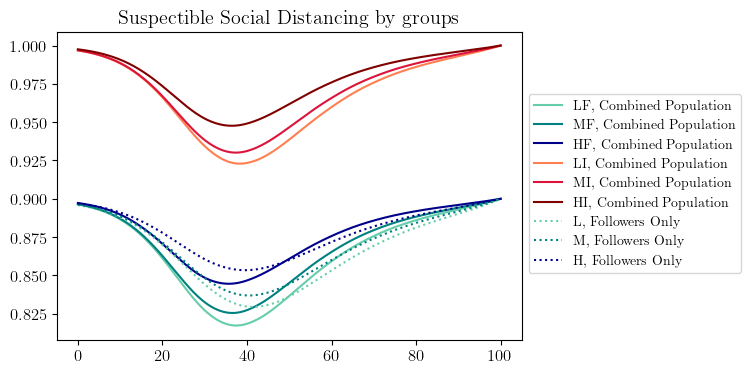

In [1559]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))

j = 0
for i in np.arange(6):
    alpha_S_block_i = diff_indiff_debug[j][2][i,:]
    ax.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, Combined Population", c=colors[i], linestyle=line_styles[j])

j = 1
for i in np.arange(3):
    alpha_S_block_i = diff_indiff_debug[j][2][i,:]
    ax.plot(t_grid, alpha_S_block_i, label = f"{block_names_three[i]}, Followers Only", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax.set_title("Suspectible Social Distancing by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)

title = "e7_p2"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


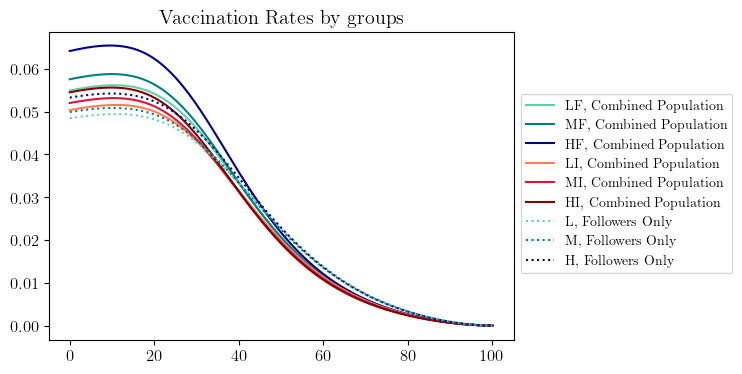

In [1560]:
fig, ax= plt.subplots(1, 1, figsize=(6, 4))

j = 0
for i in np.arange(6):
    nu_block_i = diff_indiff_debug[j][5][i,:]
    ax.plot(t_grid, nu_block_i, label = f"{block_names[i]}, Combined Population", c=colors[i], linestyle=line_styles[j])

j = 1
for i in np.arange(3):
    nu_block_i = diff_indiff_debug[j][5][i,:]
    ax.plot(t_grid, nu_block_i, label = f"{block_names_three[i]}, Followers Only", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
ax.set_title("Vaccination Rates by groups")

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.9, 0.5),
           frameon=True,
           fontsize=10)

title = "e7_p3"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


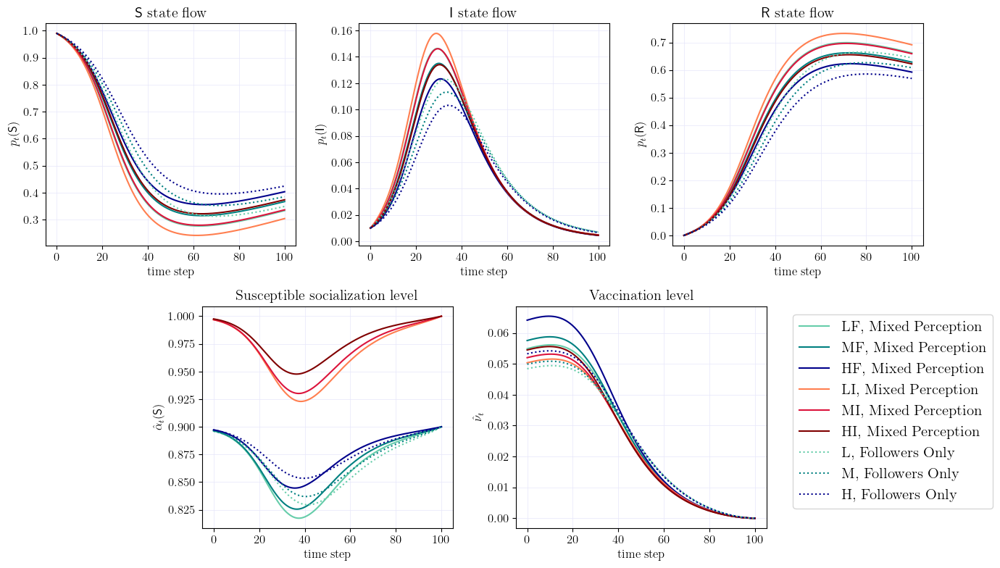

In [1561]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(13, 8))
gs = GridSpec(2, 6, figure=fig, height_ratios=[1, 1])

ax1 = fig.add_subplot(gs[0, 0:2])
ax1.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax2 = fig.add_subplot(gs[0, 2:4])
ax2.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax3 = fig.add_subplot(gs[0, 4:6])
ax3.grid(True, color='lavender', linestyle='-', linewidth=0.5)

ax4 = fig.add_subplot(gs[1, 1:3])
ax4.grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax5 = fig.add_subplot(gs[1, 3:5])
ax5.grid(True, color='lavender', linestyle='-', linewidth=0.5)

j = 0
for i in np.arange(6):
    p_S_block_i = diff_indiff_debug[j][1][i,:]
    p_I_block_i = diff_indiff_debug[j][1][6 + i,:]
    p_R_block_i = diff_indiff_debug[j][1][12 + i,:]
    ax1.plot(t_grid, p_S_block_i, label = f"{block_names[i]}, Mixed Perception", c=colors[i], linestyle=line_styles[j])
    ax2.plot(t_grid, p_I_block_i, label = f"{block_names[i]}, Mixed Perception", c=colors[i], linestyle=line_styles[j])
    ax3.plot(t_grid, p_R_block_i, label = f"{block_names[i]}, Mixed Perception", c=colors[i], linestyle=line_styles[j])

colors_three = ['lightskyblue', 'lightseagreen', 'plum']
block_names_three = ['L', 'M', 'H']
j = 1
for i in np.arange(3):
    p_S_block_i = diff_indiff_debug[j][1][i,:]
    p_I_block_i = diff_indiff_debug[j][1][3 + i,:]
    p_R_block_i = diff_indiff_debug[j][1][6 + i,:]
    ax1.plot(t_grid, p_S_block_i, label = f"{block_names_three[i]}, Followers Only", c=colors[i], linestyle=line_styles[j])
    ax2.plot(t_grid, p_I_block_i, label = f"{block_names_three[i]}, Followers Only", c=colors[i], linestyle=line_styles[j])
    ax3.plot(t_grid, p_R_block_i, label = f"{block_names_three[i]}, Followers Only", c=colors[i], linestyle=line_styles[j])
ax1.set_title(r"$\mathsf{S}$ state flow")
ax1.set_xlabel('time step')
ax1.set_ylabel(r'$p_{t}(\mathsf{S})$')
ax2.set_title(r"$\mathsf{I}$ state flow")
ax2.set_xlabel('time step')
ax2.set_ylabel(r'$p_{t}(\mathsf{I})$')
ax3.set_title(r"$\mathsf{R}$ state flow")
ax3.set_xlabel('time step')
ax3.set_ylabel(r'$p_{t}(\mathsf{R})$')


j = 0
for i in np.arange(6):
    alpha_S_block_i = diff_indiff_debug[j][2][i,:]
    ax4.plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, Mixed Perception", c=colors[i], linestyle=line_styles[j])

j = 1
for i in np.arange(3):
    alpha_S_block_i = diff_indiff_debug[j][2][i,:]
    ax4.plot(t_grid, alpha_S_block_i, label = f"{block_names_three[i]}, Followers Only", c=colors[i], linestyle=line_styles[j])

j = 0
for i in np.arange(6):
    nu_block_i = diff_indiff_debug[j][5][i,:]
    ax5.plot(t_grid, nu_block_i, label = f"{block_names[i]}, Mixed Perception", c=colors[i], linestyle=line_styles[j])

j = 1
for i in np.arange(3):
    nu_block_i = diff_indiff_debug[j][5][i,:]
    ax5.plot(t_grid, nu_block_i, label = f"{block_names_three[i]}, Followers Only", c=colors[i], linestyle=line_styles[j])

ax4.set_ylabel(r'$\hat{\alpha}_t(\mathsf{S})$')
ax4.set_title("Susceptible socialization level")
ax4.set_xlabel('time step')
# ax[0].set_ylabel('proportion')
ax5.set_title("Vaccination level")
ax5.set_xlabel('time step')
ax5.set_ylabel(r'$\hat{\nu}_t$')


handles, labels = ax1.get_legend_handles_labels()

fig.legend(handles, labels,
           loc='center left',
           bbox_to_anchor=(0.84, 0.28),
           frameon=True,
           fontsize=15)


plt.tight_layout(h_pad=1.0)
title = "official_a4"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


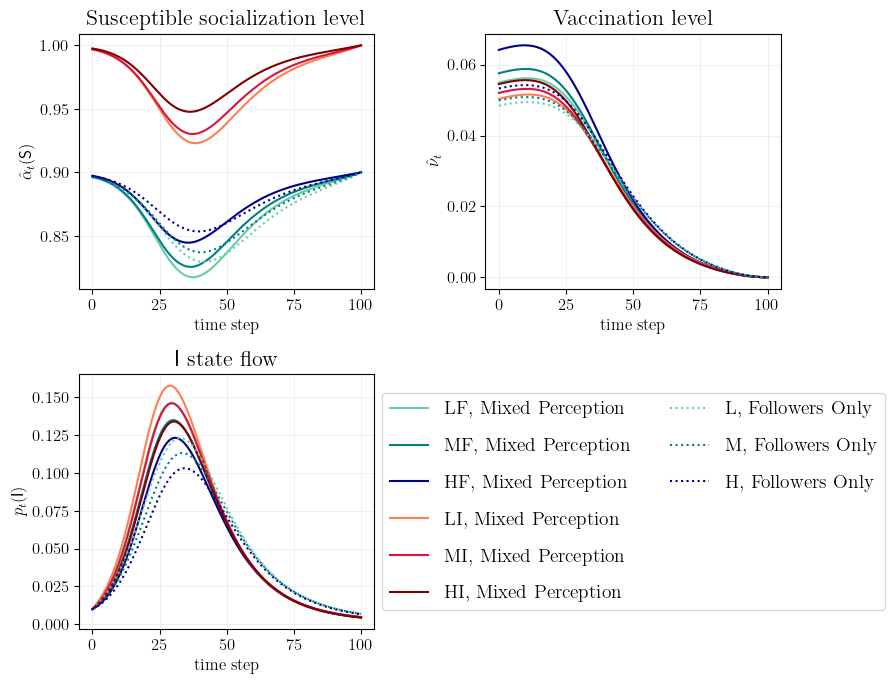

In [1565]:
fig, ax = plt.subplots(2, 2, figsize=(9, 7))

ax[0,0].grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax[0,1].grid(True, color='lavender', linestyle='-', linewidth=0.5)
ax[1,0].grid(True, color='lavender', linestyle='-', linewidth=0.5)

j = 0
for i in np.arange(6):
    p_S_block_i = diff_indiff_debug[j][1][i,:]
    p_I_block_i = diff_indiff_debug[j][1][6 + i,:]
    p_R_block_i = diff_indiff_debug[j][1][12 + i,:]
    # ax1.plot(t_grid, p_S_block_i, label = f"{block_names[i]}, Mixed Perception", c=colors[i], linestyle=line_styles[j])
    ax[1,0].plot(t_grid, p_I_block_i, label = f"{block_names[i]}, Mixed Perception", c=colors[i], linestyle=line_styles[j])
    # ax3.plot(t_grid, p_R_block_i, label = f"{block_names[i]}, Mixed Perception", c=colors[i], linestyle=line_styles[j])

colors_three = ['lightskyblue', 'lightseagreen', 'plum']
block_names_three = ['L', 'M', 'H']
j = 1
for i in np.arange(3):
    p_S_block_i = diff_indiff_debug[j][1][i,:]
    p_I_block_i = diff_indiff_debug[j][1][3 + i,:]
    p_R_block_i = diff_indiff_debug[j][1][6 + i,:]
    # ax1.plot(t_grid, p_S_block_i, label = f"{block_names_three[i]}, Followers Only", c=colors[i], linestyle=line_styles[j])
    ax[1,0].plot(t_grid, p_I_block_i, label = f"{block_names_three[i]}, Followers Only", c=colors[i], linestyle=line_styles[j])
    # ax3.plot(t_grid, p_R_block_i, label = f"{block_names_three[i]}, Followers Only", c=colors[i], linestyle=line_styles[j])
ax[1,0].set_title(r"$\mathsf{I}$ state flow", fontsize=16)
ax[1,0].set_xlabel('time step')
ax[1,0].set_ylabel(r'$p_{t}(\mathsf{I})$')


j = 0
for i in np.arange(6):
    alpha_S_block_i = diff_indiff_debug[j][2][i,:]
    ax[0,0].plot(t_grid, alpha_S_block_i, label = f"{block_names[i]}, Mixed Perception", c=colors[i], linestyle=line_styles[j])

j = 1
for i in np.arange(3):
    alpha_S_block_i = diff_indiff_debug[j][2][i,:]
    ax[0,0].plot(t_grid, alpha_S_block_i, label = f"{block_names_three[i]}, Followers Only", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
# ax4.set_title("Suspectible Social Distancing by groups")

j = 0
for i in np.arange(6):
    nu_block_i = diff_indiff_debug[j][5][i,:]
    ax[0,1].plot(t_grid, nu_block_i, label = f"{block_names[i]}, Mixed Perception", c=colors[i], linestyle=line_styles[j])

j = 1
for i in np.arange(3):
    nu_block_i = diff_indiff_debug[j][5][i,:]
    ax[0,1].plot(t_grid, nu_block_i, label = f"{block_names_three[i]}, Followers Only", c=colors[i], linestyle=line_styles[j])
# ax.legend(fontsize="8")
# ax5.set_title("Vaccination Rates by groups")

ax[0,0].set_ylabel(r'$\hat{\alpha}_t(\mathsf{S})$')
ax[0,0].set_title("Susceptible socialization level", fontsize=16)
ax[0,0].set_xlabel('time step')
# ax[0].set_ylabel('proportion')
ax[0,1].set_title("Vaccination level", fontsize=16)
ax[0,1].set_xlabel('time step')
ax[0,1].set_ylabel(r'$\hat{\nu}_t$')

handles, labels = ax[0,0].get_legend_handles_labels()

ax[1, 1].axis('off')

from matplotlib.lines import Line2D

ax[1, 1].legend(handles + 2 * [Line2D([], [], color='none')], 
                labels + 2 * [' '],
                loc='center',
                frameon=True,
                fontsize=14,
                ncol=2,
                labelspacing=1.0)


plt.tight_layout(h_pad=1.0)
title = "official_a4_nov26"
plt.savefig('Plots/%s.eps' % title, bbox_inches='tight', format='eps')
plt.show()

LF max infection difference: 0.030840596943455437
LF infection peak difference: 0.023238091308402015
MF max infection difference: 0.0289158678931149
MF infection peak difference: 0.021791498809579993
HF max infection difference: 0.02673554248173808
HF infection peak difference: 0.020122209733902566


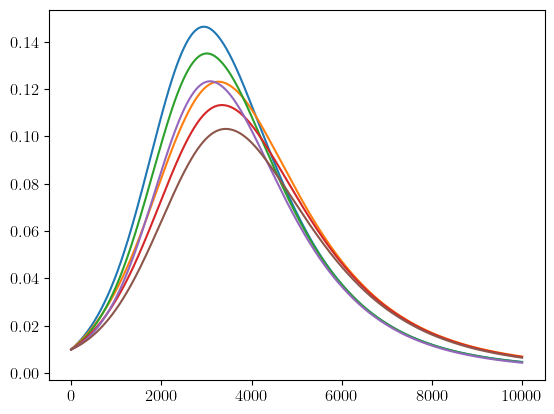

In [579]:
for i in range(3):
    p_I_block_i_mixed = diff_indiff_debug[0][1][6+i,:]
    p_I_block_i_fonly = diff_indiff_debug[1][1][3+i,:]
    plt.plot(p_I_block_i_mixed)
    plt.plot(p_I_block_i_fonly)
    p_diff = (p_I_block_i_mixed - p_I_block_i_fonly)[np.argmax(p_I_block_i_mixed - p_I_block_i_fonly)]
    print(f'{block_names[i]} max infection difference: {p_diff}')
    print(f'{block_names[i]} infection peak difference: {np.max(p_I_block_i_mixed) - np.max(p_I_block_i_fonly)}')

In [580]:
p_I_block_i_mixed_HF = diff_indiff_debug[0][1][6+2,:]
p_I_block_i_fonly_HF = diff_indiff_debug[1][1][3+2,:]

p_I_block_i_mixed_LI = diff_indiff_debug[0][1][6+3,:]
p_I_block_i_fonly_LF = diff_indiff_debug[1][1][3+0,:]

print(f'largest infection gap in mixed(LI-HF): {(p_I_block_i_mixed_LI - p_I_block_i_mixed_HF)[np.argmax(p_I_block_i_mixed_LI - p_I_block_i_mixed_HF)]}')
print(f'largest infection gap in all-follower (LF-HF): {(p_I_block_i_fonly_LF - p_I_block_i_fonly_HF)[np.argmax(p_I_block_i_fonly_LF - p_I_block_i_fonly_HF)]}')

largest infection gap in mixed(LI-HF): 0.038597398130997176
largest infection gap in all-follower (LF-HF): 0.02228974063113938


In [581]:
for i in range(3):
    nu_block_i_mixed = diff_indiff_debug[0][5][i,:]
    nu_block_i_all_fo = diff_indiff_debug[1][5][i,:]
    nu_diff = np.max(nu_block_i_all_fo) - np.max(nu_block_i_mixed)
    nu_peak_diff = nu_diff / np.max(nu_block_i_mixed)
    # nu_diff = (nu_block_i_mixed - nu_block_i_all_fo)[np.argmax(nu_block_i_mixed - nu_block_i_all_fo)]
    print(f'{block_names[i]} max vax difference: {nu_peak_diff}, increase by {nu_diff}')

LF max vax difference: -0.11994032193805647, increase by -0.006738614721859652
MF max vax difference: -0.13479587579300895, increase by -0.007924585487646671
HF max vax difference: -0.17147310652350015, increase by -0.011225494809379927


In [582]:
nu_block_i_mixed_HF = diff_indiff_debug[0][5][2,:]
nu_block_i_fonly_HF = diff_indiff_debug[1][5][2,:]

nu_block_i_mixed_LI = diff_indiff_debug[0][5][3,:]
nu_block_i_fonly_LF = diff_indiff_debug[1][5][0,:]

print(f'largest vaccination gap in mixed(LI-HF): {(nu_block_i_mixed_HF - nu_block_i_mixed_LI)[np.argmax(nu_block_i_mixed_HF - nu_block_i_mixed_LI)]}')
print(f'largest vaccination gap in all-follower (LF-HF): {(nu_block_i_fonly_HF - nu_block_i_fonly_LF)[np.argmax(nu_block_i_fonly_HF - nu_block_i_fonly_LF)]}')

largest vaccination gap in mixed(LI-HF): 0.013977683822011387
largest vaccination gap in all-follower (LF-HF): 0.004868187825948306


In [583]:
for i in range(3):
    alphaS_block_i_mixed = diff_indiff_debug[0][2][i,:]
    alphaS_block_i_all_fo = diff_indiff_debug[1][2][i,:]
    alphaS_diff = np.min(alphaS_block_i_all_fo) - np.min(alphaS_block_i_mixed)
    alphaS_peak_diff = alphaS_diff / np.min(alphaS_block_i_mixed)
    print(f'{block_names[i]} social peak difference: {alphaS_peak_diff}, increase by {alphaS_diff}')

LF social peak difference: 0.014827762637078112, increase by 0.012118898945547296
MF social peak difference: 0.013831703398303164, increase by 0.011417952107472318
HF social peak difference: 0.010472844578621038, increase by 0.00884487997912442


In [584]:
alphaS_block_i_mixed_LF = diff_indiff_debug[0][2][0,:]
alphaS_block_i_mixed_HF = diff_indiff_debug[0][2][2,:]
alphaS_block_i_all_fo_L = diff_indiff_debug[1][2][0,:]
alphaS_block_i_all_fo_H = diff_indiff_debug[1][2][2,:]

print(f'largest social gap in mixed(LF-HF): {(alphaS_block_i_mixed_HF - alphaS_block_i_mixed_LF)[np.argmax(alphaS_block_i_mixed_HF - alphaS_block_i_mixed_LF)]}')
print(f'largest social gap in all-follower (LF-HF): {(alphaS_block_i_all_fo_H - alphaS_block_i_all_fo_L)[np.argmax(alphaS_block_i_all_fo_H - alphaS_block_i_all_fo_L)]}')

largest social gap in mixed(LF-HF): 0.028271175595984466
largest social gap in all-follower (LF-HF): 0.024727458459491092
